In [4]:
import pandas as pd
import numpy as np

In [5]:
def split(X,Y):
    X_train = X[:-8]
    X_test = X[-8:]
    y_train = Y[:-8]
    y_test = Y[-8:]
    
    return X_train, X_test, y_train, y_test

## Neural Network

In [6]:
import tensorflow as tf

def neural_network(df):
    df = df.drop(columns=['Quarter end'])
    df = df.replace([np.inf, -np.inf], np.nan)
    df = df.dropna()
    X = df
    Y = X['Price']
    Y = Y[1:]
    
    #Getting Next Quarter %change of price 
    #This will be our target variable

    X = X[:-1]
    X = X.values
    Y = Y.values
    
    
    X_train, X_test, y_train, y_test = split( X, Y)
    X_train_means = np.mean(X_train, axis = 0)
    X_train_std = np.std(X_train, axis = 0)
    X_train_scaled = (X_train - X_train_means)/X_train_std

    X_test_scaled = (X_test - X_train_means)/X_train_std
    
    Shape = np.shape(X_train_scaled)[1]
    
    model = tf.keras.models.Sequential([
      tf.keras.layers.Dense(20,input_shape=(Shape,),activation = 'relu'),
      tf.keras.layers.Dropout(0.2),
        #tf.keras.layers.Dense(8, activation='relu'),
      #tf.keras.layers.Dropout(0.2),
      tf.keras.layers.Dense(1, activation='tanh')
    ])
    
    Adam = tf.keras.optimizers.Adam(learning_rate=0.005, beta_1=0.9, beta_2=0.999, amsgrad=False)

    model.compile(optimizer=Adam,
                  loss='mean_squared_error',
                  metrics=['accuracy'])
    
    model.fit(X_train_scaled, y_train, epochs=500,shuffle=False)
    
    predictions = model.predict(X_test_scaled)
    
    return predictions,y_test

In [4]:
df = pd.read_csv("./new_clean_data/AAPL_quarterly_financial_data.csv", delimiter = ',')
df.head()

,Unnamed: 0,Quarter end,Assets,Current Assets,Liabilities,Current Liabilities,Shareholders equity,Revenue,Earnings,Earnings available for common stockholders,...,ROE,ROA,Book value of equity per share,P/B ratio,P/E ratio,Cumulative dividends per share,Equity to assets ratio,Net margin,Asset turnover,Current ratio
0,0,1993-12-31,0.016058,0.012353,-0.037095,-0.176394,0.093440,-0.129188,2.450972,2.450972,...,-0.614536,-0.622003,0.063492,0.012121,1.019663,1.333178,0.076130,-0.616188,-0.016216,0.229224
1,1,1994-07-01,0.016058,0.012353,-0.037095,-0.176394,0.093440,-0.129188,2.450972,2.450972,...,-0.614536,-0.622003,0.063492,0.012121,1.019663,1.333178,0.076130,-0.616188,-0.016216,0.229224
2,2,1994-09-30,0.035003,0.050813,0.014296,0.013986,0.061550,0.000000,0.000000,0.000000,...,-0.614536,-0.622003,0.059701,0.012121,1.019663,0.000000,0.025559,-0.616188,-0.016216,0.036279
3,3,1994-12-30,0.043422,0.053960,0.017659,-0.004786,0.074980,0.317266,0.361323,0.361323,...,-0.614536,-0.622003,0.070423,0.149701,1.019663,0.000000,0.030263,-0.616188,-0.016216,0.059028
4,4,1995-03-31,0.093439,0.093896,0.122854,0.159173,0.059329,-0.063559,-0.611702,-0.611702,...,-0.614536,-0.622003,0.052632,0.000000,1.019663,1.000000,-0.031102,-0.616188,-0.016216,-0.056312


In [5]:
preds , labels = neural_network(df)

Train on 93 samples
Epoch 1/500
93/93 [==============================] - 2s 20ms/sample - loss: 0.4152 - accuracy: 0.0000e+00
Epoch 2/500
93/93 [==============================] - 0s 53us/sample - loss: 0.3143 - accuracy: 0.0000e+00
Epoch 3/500
93/93 [==============================] - 0s 63us/sample - loss: 0.2583 - accuracy: 0.0000e+00
Epoch 4/500
93/93 [==============================] - 0s 66us/sample - loss: 0.2735 - accuracy: 0.0000e+00
Epoch 5/500
93/93 [==============================] - 0s 68us/sample - loss: 0.2484 - accuracy: 0.0000e+00
Epoch 6/500
93/93 [==============================] - 0s 80us/sample - loss: 0.2558 - accuracy: 0.0000e+00
Epoch 7/500
93/93 [==============================] - 0s 73us/sample - loss: 0.2124 - accuracy: 0.0000e+00
Epoch 8/500
93/93 [==============================] - 0s 85us/sample - loss: 0.1975 - accuracy: 0.0000e+00
Epoch 9/500
93/93 [==============================] - 0s 83us/sample - loss: 0.1668 - accuracy: 0.0000e+00
Epoch 10/500
93/93 [======

93/93 [==============================] - 0s 45us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 154/500
93/93 [==============================] - 0s 43us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 155/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 156/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 157/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 158/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 159/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 160/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 161/500
93/93 [==============================] - ETA: 0s - loss: 0.0185 - accuracy: 0.0000e+ - 0s 56us/sample - loss: 0.0134 - accuracy: 0.0000e

Epoch 304/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 305/500
93/93 [==============================] - 0s 70us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 306/500
93/93 [==============================] - 0s 64us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 307/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 308/500
93/93 [==============================] - 0s 77us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 309/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 310/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 311/500
93/93 [==============================] - 0s 85us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 312/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 313/500
93/93 [=======

Epoch 455/500
93/93 [==============================] - 0s 79us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 456/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 457/500
93/93 [==============================] - 0s 68us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 458/500
93/93 [==============================] - 0s 65us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 459/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 460/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 461/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 462/500
93/93 [==============================] - 0s 67us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 463/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 464/500
93/93 [=======

### Running the neural network on all stock data

In [6]:
filenames = open('filenames.txt','r').read()
filenames = filenames.split('\n')[:-1]

all_preds = {}
all_labels = {}

i = 0

#for i in range(15):
for i in range(len(filenames)):
    try:
        df = pd.read_csv("./new_clean_data/"+str(filenames[i]), delimiter = ',')
        preds,labels = neural_network(df)
        preds = np.reshape(preds,(8,))
        all_preds[str(filenames[i])] = preds
        all_labels[str(filenames[i])] = labels
    except:
        s=2

Train on 40 samples
Epoch 1/500
40/40 [==============================] - 0s 7ms/sample - loss: 0.4195 - accuracy: 0.0000e+00
Epoch 2/500
40/40 [==============================] - 0s 121us/sample - loss: 0.4027 - accuracy: 0.0000e+00
Epoch 3/500
40/40 [==============================] - 0s 94us/sample - loss: 0.3675 - accuracy: 0.0000e+00
Epoch 4/500
40/40 [==============================] - 0s 91us/sample - loss: 0.3740 - accuracy: 0.0000e+00
Epoch 5/500
40/40 [==============================] - 0s 92us/sample - loss: 0.3364 - accuracy: 0.0000e+00
Epoch 6/500
40/40 [==============================] - 0s 103us/sample - loss: 0.3235 - accuracy: 0.0000e+00
Epoch 7/500
40/40 [==============================] - 0s 116us/sample - loss: 0.3093 - accuracy: 0.0000e+00
Epoch 8/500
40/40 [==============================] - 0s 127us/sample - loss: 0.2422 - accuracy: 0.0000e+00
Epoch 9/500
40/40 [==============================] - 0s 85us/sample - loss: 0.2281 - accuracy: 0.0000e+00
Epoch 10/500
40/40 [===

Epoch 77/500
40/40 [==============================] - 0s 89us/sample - loss: 0.0453 - accuracy: 0.0000e+00
Epoch 78/500
40/40 [==============================] - 0s 107us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 79/500
40/40 [==============================] - 0s 124us/sample - loss: 0.0625 - accuracy: 0.0000e+00
Epoch 80/500
40/40 [==============================] - 0s 87us/sample - loss: 0.0488 - accuracy: 0.0000e+00
Epoch 81/500
40/40 [==============================] - 0s 99us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 82/500
40/40 [==============================] - 0s 112us/sample - loss: 0.0445 - accuracy: 0.0000e+00
Epoch 83/500
40/40 [==============================] - 0s 89us/sample - loss: 0.0379 - accuracy: 0.0000e+00
Epoch 84/500
40/40 [==============================] - 0s 93us/sample - loss: 0.0488 - accuracy: 0.0000e+00
Epoch 85/500
40/40 [==============================] - 0s 106us/sample - loss: 0.0426 - accuracy: 0.0000e+00
Epoch 86/500
40/40 [=============

40/40 [==============================] - 0s 107us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 228/500
40/40 [==============================] - 0s 95us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 229/500
40/40 [==============================] - 0s 94us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 230/500
40/40 [==============================] - 0s 105us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 231/500
40/40 [==============================] - 0s 91us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 232/500
40/40 [==============================] - 0s 91us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 233/500
40/40 [==============================] - 0s 98us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 234/500
40/40 [==============================] - 0s 101us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 235/500
40/40 [==============================] - 0s 92us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 236/500
40/40 [==================

40/40 [==============================] - 0s 90us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 378/500
40/40 [==============================] - 0s 102us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 379/500
40/40 [==============================] - 0s 106us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 380/500
40/40 [==============================] - 0s 96us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 381/500
40/40 [==============================] - 0s 100us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 382/500
40/40 [==============================] - 0s 104us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 383/500
40/40 [==============================] - 0s 85us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 384/500
40/40 [==============================] - 0s 109us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 385/500
40/40 [==============================] - 0s 90us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 386/500
40/40 [================

65/65 [==============================] - 0s 75us/sample - loss: 0.0953 - accuracy: 0.0923
Epoch 29/500
65/65 [==============================] - 0s 79us/sample - loss: 0.1099 - accuracy: 0.1077
Epoch 30/500
65/65 [==============================] - 0s 69us/sample - loss: 0.1072 - accuracy: 0.1077
Epoch 31/500
65/65 [==============================] - 0s 67us/sample - loss: 0.1236 - accuracy: 0.1077
Epoch 32/500
65/65 [==============================] - 0s 68us/sample - loss: 0.0752 - accuracy: 0.1077
Epoch 33/500
65/65 [==============================] - 0s 69us/sample - loss: 0.0877 - accuracy: 0.1077
Epoch 34/500
65/65 [==============================] - 0s 75us/sample - loss: 0.0739 - accuracy: 0.1077
Epoch 35/500
65/65 [==============================] - 0s 78us/sample - loss: 0.0522 - accuracy: 0.1077
Epoch 36/500
65/65 [==============================] - 0s 75us/sample - loss: 0.0601 - accuracy: 0.1077
Epoch 37/500
65/65 [==============================] - 0s 65us/sample - loss: 0.0868 - 

65/65 [==============================] - 0s 72us/sample - loss: 0.0196 - accuracy: 0.1077
Epoch 186/500
65/65 [==============================] - 0s 70us/sample - loss: 0.0157 - accuracy: 0.1077
Epoch 187/500
65/65 [==============================] - 0s 90us/sample - loss: 0.0185 - accuracy: 0.1077
Epoch 188/500
65/65 [==============================] - 0s 67us/sample - loss: 0.0152 - accuracy: 0.1077
Epoch 189/500
65/65 [==============================] - 0s 67us/sample - loss: 0.0205 - accuracy: 0.1077
Epoch 190/500
65/65 [==============================] - 0s 72us/sample - loss: 0.0156 - accuracy: 0.1077
Epoch 191/500
65/65 [==============================] - 0s 66us/sample - loss: 0.0140 - accuracy: 0.1077
Epoch 192/500
65/65 [==============================] - 0s 78us/sample - loss: 0.0124 - accuracy: 0.1077
Epoch 193/500
65/65 [==============================] - 0s 84us/sample - loss: 0.0137 - accuracy: 0.1077
Epoch 194/500
65/65 [==============================] - 0s 70us/sample - loss: 

65/65 [==============================] - 0s 74us/sample - loss: 0.0090 - accuracy: 0.1077
Epoch 342/500
65/65 [==============================] - 0s 81us/sample - loss: 0.0095 - accuracy: 0.1077
Epoch 343/500
65/65 [==============================] - 0s 83us/sample - loss: 0.0103 - accuracy: 0.1077
Epoch 344/500
65/65 [==============================] - 0s 63us/sample - loss: 0.0062 - accuracy: 0.1077
Epoch 345/500
65/65 [==============================] - 0s 82us/sample - loss: 0.0093 - accuracy: 0.1077
Epoch 346/500
65/65 [==============================] - 0s 72us/sample - loss: 0.0110 - accuracy: 0.1077
Epoch 347/500
65/65 [==============================] - 0s 67us/sample - loss: 0.0078 - accuracy: 0.1077
Epoch 348/500
65/65 [==============================] - 0s 80us/sample - loss: 0.0088 - accuracy: 0.1077
Epoch 349/500
65/65 [==============================] - 0s 70us/sample - loss: 0.0061 - accuracy: 0.1077
Epoch 350/500
65/65 [==============================] - 0s 65us/sample - loss: 

65/65 [==============================] - 0s 68us/sample - loss: 0.0160 - accuracy: 0.1077
Epoch 498/500
65/65 [==============================] - 0s 71us/sample - loss: 0.0061 - accuracy: 0.1077
Epoch 499/500
65/65 [==============================] - 0s 82us/sample - loss: 0.0069 - accuracy: 0.1077
Epoch 500/500
65/65 [==============================] - 0s 75us/sample - loss: 0.0052 - accuracy: 0.1077
Train on 79 samples
Epoch 1/500
79/79 [==============================] - 0s 4ms/sample - loss: 0.2966 - accuracy: 0.0127
Epoch 2/500
79/79 [==============================] - 0s 52us/sample - loss: 0.2485 - accuracy: 0.0253
Epoch 3/500
79/79 [==============================] - 0s 54us/sample - loss: 0.1959 - accuracy: 0.0253
Epoch 4/500
79/79 [==============================] - 0s 69us/sample - loss: 0.2019 - accuracy: 0.0253
Epoch 5/500
79/79 [==============================] - 0s 68us/sample - loss: 0.2036 - accuracy: 0.0253
Epoch 6/500
79/79 [==============================] - 0s 58us/sample -

79/79 [==============================] - 0s 55us/sample - loss: 0.0068 - accuracy: 0.0380
Epoch 156/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0078 - accuracy: 0.0380
Epoch 157/500
79/79 [==============================] - 0s 60us/sample - loss: 0.0085 - accuracy: 0.0380
Epoch 158/500
79/79 [==============================] - 0s 62us/sample - loss: 0.0078 - accuracy: 0.0380
Epoch 159/500
79/79 [==============================] - 0s 61us/sample - loss: 0.0097 - accuracy: 0.0380
Epoch 160/500
79/79 [==============================] - 0s 75us/sample - loss: 0.0081 - accuracy: 0.0380
Epoch 161/500
79/79 [==============================] - 0s 65us/sample - loss: 0.0068 - accuracy: 0.0380
Epoch 162/500
79/79 [==============================] - 0s 61us/sample - loss: 0.0073 - accuracy: 0.0380
Epoch 163/500
79/79 [==============================] - 0s 66us/sample - loss: 0.0058 - accuracy: 0.0380
Epoch 164/500
79/79 [==============================] - 0s 66us/sample - loss: 

79/79 [==============================] - 0s 68us/sample - loss: 0.0064 - accuracy: 0.0380
Epoch 312/500
79/79 [==============================] - 0s 65us/sample - loss: 0.0047 - accuracy: 0.0380
Epoch 313/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0057 - accuracy: 0.0380
Epoch 314/500
79/79 [==============================] - 0s 67us/sample - loss: 0.0058 - accuracy: 0.0380
Epoch 315/500
79/79 [==============================] - 0s 63us/sample - loss: 0.0045 - accuracy: 0.0380
Epoch 316/500
79/79 [==============================] - 0s 55us/sample - loss: 0.0059 - accuracy: 0.0380
Epoch 317/500
79/79 [==============================] - 0s 73us/sample - loss: 0.0061 - accuracy: 0.0380
Epoch 318/500
79/79 [==============================] - 0s 72us/sample - loss: 0.0048 - accuracy: 0.0380
Epoch 319/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0063 - accuracy: 0.0380
Epoch 320/500
79/79 [==============================] - 0s 79us/sample - loss: 

79/79 [==============================] - 0s 57us/sample - loss: 0.0052 - accuracy: 0.0380
Epoch 468/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0049 - accuracy: 0.0380
Epoch 469/500
79/79 [==============================] - 0s 63us/sample - loss: 0.0049 - accuracy: 0.0380
Epoch 470/500
79/79 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0380
Epoch 471/500
79/79 [==============================] - 0s 67us/sample - loss: 0.0059 - accuracy: 0.0380
Epoch 472/500
79/79 [==============================] - 0s 72us/sample - loss: 0.0049 - accuracy: 0.0380
Epoch 473/500
79/79 [==============================] - 0s 54us/sample - loss: 0.0041 - accuracy: 0.0380
Epoch 474/500
79/79 [==============================] - 0s 62us/sample - loss: 0.0042 - accuracy: 0.0380
Epoch 475/500
79/79 [==============================] - 0s 64us/sample - loss: 0.0050 - accuracy: 0.0380
Epoch 476/500
79/79 [==============================] - 0s 57us/sample - loss: 

93/93 [==============================] - 0s 54us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 121/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 122/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 123/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 124/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 125/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 126/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 127/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 128/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 129/500
93/93 [=====================

Epoch 271/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 272/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 273/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 274/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 275/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 276/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 277/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 278/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 279/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 280/500
93/93 [=======

Epoch 422/500
93/93 [==============================] - 0s 65us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 423/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 424/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 425/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 426/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 427/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 428/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 429/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 430/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 431/500
93/93 [=======

85/85 [==============================] - 0s 53us/sample - loss: 0.0570 - accuracy: 0.0000e+00
Epoch 74/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0586 - accuracy: 0.0000e+00
Epoch 75/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0589 - accuracy: 0.0000e+00
Epoch 76/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0513 - accuracy: 0.0000e+00
Epoch 77/500
85/85 [==============================] - 0s 69us/sample - loss: 0.0662 - accuracy: 0.0000e+00
Epoch 78/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0465 - accuracy: 0.0000e+00
Epoch 79/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0542 - accuracy: 0.0000e+00
Epoch 80/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0546 - accuracy: 0.0000e+00
Epoch 81/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0566 - accuracy: 0.0000e+00
Epoch 82/500
85/85 [==============================

85/85 [==============================] - 0s 58us/sample - loss: 0.0378 - accuracy: 0.0000e+00
Epoch 225/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0385 - accuracy: 0.0000e+00
Epoch 226/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0441 - accuracy: 0.0000e+00
Epoch 227/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0433 - accuracy: 0.0000e+00
Epoch 228/500
85/85 [==============================] - 0s 70us/sample - loss: 0.0364 - accuracy: 0.0000e+00
Epoch 229/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0401 - accuracy: 0.0000e+00
Epoch 230/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0407 - accuracy: 0.0000e+00
Epoch 231/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0385 - accuracy: 0.0000e+00
Epoch 232/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 233/500
85/85 [=====================

Epoch 300/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0375 - accuracy: 0.0000e+00
Epoch 301/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0427 - accuracy: 0.0000e+00
Epoch 302/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0414 - accuracy: 0.0000e+00
Epoch 303/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0387 - accuracy: 0.0000e+00
Epoch 304/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 305/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0354 - accuracy: 0.0000e+00
Epoch 306/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0385 - accuracy: 0.0000e+00
Epoch 307/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0344 - accuracy: 0.0000e+00
Epoch 308/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0452 - accuracy: 0.0000e+00
Epoch 309/500
85/85 [=======

85/85 [==============================] - 0s 52us/sample - loss: 0.0316 - accuracy: 0.0000e+00
Epoch 451/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0300 - accuracy: 0.0000e+00
Epoch 452/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 453/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0284 - accuracy: 0.0000e+00
Epoch 454/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 455/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0353 - accuracy: 0.0000e+00
Epoch 456/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0319 - accuracy: 0.0000e+00
Epoch 457/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0331 - accuracy: 0.0000e+00
Epoch 458/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 459/500
85/85 [=====================

92/92 [==============================] - 0s 51us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 103/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 104/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 105/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 106/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 107/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 108/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 109/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 110/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 111/500
92/92 [=====================

Epoch 178/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [=======

Epoch 329/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 330/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 331/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 332/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 92us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 87us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [=======

92/92 [==============================] - 0s 47us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 480/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 481/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 482/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 483/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 83us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [=====================

87/87 [==============================] - 0s 52us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 132/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 133/500
87/87 [==============================] - 0s 66us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 134/500
87/87 [==============================] - 0s 66us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 135/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 136/500
87/87 [==============================] - 0s 74us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 137/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 138/500
87/87 [==============================] - 0s 57us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 139/500
87/87 [==============================] - 0s 66us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 140/500
87/87 [=====================

Epoch 207/500
87/87 [==============================] - 0s 68us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 208/500
87/87 [==============================] - 0s 64us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 209/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 210/500
87/87 [==============================] - 0s 80us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 211/500
87/87 [==============================] - 0s 78us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 212/500
87/87 [==============================] - 0s 71us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 213/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 214/500
87/87 [==============================] - 0s 50us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 215/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 216/500
87/87 [=======

Epoch 358/500
87/87 [==============================] - 0s 77us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 359/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 360/500
87/87 [==============================] - 0s 80us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 361/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 362/500
87/87 [==============================] - 0s 64us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 363/500
87/87 [==============================] - 0s 72us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 364/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 365/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 366/500
87/87 [==============================] - 0s 75us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 367/500
87/87 [=======

Epoch 9/500
52/52 [==============================] - 0s 87us/sample - loss: 0.0949 - accuracy: 0.0000e+00
Epoch 10/500
52/52 [==============================] - 0s 72us/sample - loss: 0.0862 - accuracy: 0.0000e+00
Epoch 11/500
52/52 [==============================] - 0s 114us/sample - loss: 0.0768 - accuracy: 0.0000e+00
Epoch 12/500
52/52 [==============================] - 0s 110us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 13/500
52/52 [==============================] - 0s 101us/sample - loss: 0.0651 - accuracy: 0.0000e+00
Epoch 14/500
52/52 [==============================] - 0s 109us/sample - loss: 0.0685 - accuracy: 0.0000e+00
Epoch 15/500
52/52 [==============================] - 0s 69us/sample - loss: 0.1049 - accuracy: 0.0000e+00
Epoch 16/500
52/52 [==============================] - 0s 70us/sample - loss: 0.0657 - accuracy: 0.0000e+00
Epoch 17/500
52/52 [==============================] - 0s 94us/sample - loss: 0.0600 - accuracy: 0.0000e+00
Epoch 18/500
52/52 [==============

52/52 [==============================] - 0s 83us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 161/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 162/500
52/52 [==============================] - 0s 73us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 163/500
52/52 [==============================] - 0s 91us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 164/500
52/52 [==============================] - 0s 68us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 165/500
52/52 [==============================] - 0s 82us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 166/500
52/52 [==============================] - 0s 69us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 167/500
52/52 [==============================] - 0s 82us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 168/500
52/52 [==============================] - 0s 84us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 169/500
52/52 [=====================

Epoch 236/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 237/500
52/52 [==============================] - 0s 84us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 238/500
52/52 [==============================] - 0s 77us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 239/500
52/52 [==============================] - 0s 72us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 240/500
52/52 [==============================] - 0s 72us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 241/500
52/52 [==============================] - 0s 82us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 242/500
52/52 [==============================] - 0s 75us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 243/500
52/52 [==============================] - 0s 71us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 244/500
52/52 [==============================] - 0s 79us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 245/500
52/52 [=======

52/52 [==============================] - 0s 97us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 387/500
52/52 [==============================] - 0s 92us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 388/500
52/52 [==============================] - 0s 90us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 389/500
52/52 [==============================] - 0s 81us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 390/500
52/52 [==============================] - 0s 73us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 391/500
52/52 [==============================] - 0s 106us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 392/500
52/52 [==============================] - 0s 87us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 393/500
52/52 [==============================] - 0s 70us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 394/500
52/52 [==============================] - 0s 101us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 395/500
52/52 [===================

94/94 [==============================] - 0s 55us/sample - loss: 0.0301 - accuracy: 0.0000e+00
Epoch 38/500
94/94 [==============================] - 0s 70us/sample - loss: 0.0258 - accuracy: 0.0000e+00
Epoch 39/500
94/94 [==============================] - 0s 64us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 40/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 41/500
94/94 [==============================] - 0s 77us/sample - loss: 0.0279 - accuracy: 0.0000e+00
Epoch 42/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 43/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 44/500
94/94 [==============================] - 0s 80us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 45/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 46/500
94/94 [==============================

Epoch 189/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 190/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 191/500
94/94 [==============================] - 0s 58us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 192/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 193/500
94/94 [==============================] - 0s 62us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 194/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 195/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 196/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 197/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 198/500
94/94 [=======

Epoch 340/500
94/94 [==============================] - 0s 58us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 341/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 342/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 343/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 344/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 345/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 346/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 347/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 348/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 349/500
94/94 [=======

Epoch 491/500
94/94 [==============================] - 0s 64us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 492/500
94/94 [==============================] - 0s 58us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 493/500
94/94 [==============================] - 0s 59us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 494/500
94/94 [==============================] - 0s 106us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 495/500
94/94 [==============================] - 0s 61us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 496/500
94/94 [==============================] - 0s 60us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 497/500
94/94 [==============================] - 0s 65us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 498/500
94/94 [==============================] - 0s 69us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 499/500
94/94 [==============================] - 0s 60us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 500/500
94/94 [======

89/89 [==============================] - 0s 56us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 144/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 145/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 146/500
89/89 [==============================] - 0s 103us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 147/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 148/500
89/89 [==============================] - 0s 64us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 149/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 150/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 151/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 152/500
89/89 [====================

Epoch 294/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 295/500
89/89 [==============================] - 0s 69us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 296/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 297/500
89/89 [==============================] - 0s 84us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 298/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 299/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 300/500
89/89 [==============================] - 0s 59us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 301/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 302/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 303/500
89/89 [=======

Epoch 445/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 446/500
89/89 [==============================] - 0s 45us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 447/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 448/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 449/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 450/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 451/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 452/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 453/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 454/500
89/89 [=======

Epoch 21/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0562 - accuracy: 0.0000e+00
Epoch 22/500
75/75 [==============================] - 0s 57us/sample - loss: 0.0523 - accuracy: 0.0000e+00
Epoch 23/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0290 - accuracy: 0.0000e+00
Epoch 24/500
75/75 [==============================] - 0s 79us/sample - loss: 0.0502 - accuracy: 0.0000e+00
Epoch 25/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0389 - accuracy: 0.0000e+00
Epoch 26/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 27/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0374 - accuracy: 0.0000e+00
Epoch 28/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 29/500
75/75 [==============================] - 0s 55us/sample - loss: 0.0311 - accuracy: 0.0000e+00
Epoch 30/500
75/75 [=================

75/75 [==============================] - 0s 61us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 174/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 175/500
75/75 [==============================] - 0s 79us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 176/500
75/75 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 177/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 178/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 179/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 180/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 181/500
75/75 [==============================] - 0s 74us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 182/500
75/75 [=====================

Epoch 249/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 250/500
75/75 [==============================] - 0s 66us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 251/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 252/500
75/75 [==============================] - 0s 65us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 253/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 254/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 255/500
75/75 [==============================] - 0s 79us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 256/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 257/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 258/500
75/75 [=======

75/75 [==============================] - 0s 65us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 400/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 401/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 402/500
75/75 [==============================] - 0s 77us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 403/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 404/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 405/500
75/75 [==============================] - 0s 76us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 406/500
75/75 [==============================] - 0s 78us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 407/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 408/500
75/75 [=====================

49/49 [==============================] - 0s 80us/sample - loss: 0.0363 - accuracy: 0.0000e+00
Epoch 51/500
49/49 [==============================] - 0s 85us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 52/500
49/49 [==============================] - 0s 98us/sample - loss: 0.0248 - accuracy: 0.0000e+00
Epoch 53/500
49/49 [==============================] - 0s 86us/sample - loss: 0.0253 - accuracy: 0.0000e+00
Epoch 54/500
49/49 [==============================] - 0s 85us/sample - loss: 0.0244 - accuracy: 0.0000e+00
Epoch 55/500
49/49 [==============================] - 0s 95us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 56/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 57/500
49/49 [==============================] - 0s 97us/sample - loss: 0.0236 - accuracy: 0.0000e+00
Epoch 58/500
49/49 [==============================] - 0s 85us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 59/500
49/49 [==============================

Epoch 202/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 203/500
49/49 [==============================] - 0s 90us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 204/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 205/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 206/500
49/49 [==============================] - 0s 80us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 207/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 208/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 209/500
49/49 [==============================] - 0s 96us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 210/500
49/49 [==============================] - 0s 78us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 211/500
49/49 [=======

49/49 [==============================] - 0s 87us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 353/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 354/500
49/49 [==============================] - 0s 70us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 355/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 356/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 357/500
49/49 [==============================] - 0s 83us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 358/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 359/500
49/49 [==============================] - 0s 87us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 360/500
49/49 [==============================] - 0s 71us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 361/500
49/49 [=====================

93/93 [==============================] - 0s 52us/sample - loss: 0.2902 - accuracy: 0.0108
Epoch 3/500
93/93 [==============================] - 0s 51us/sample - loss: 0.3174 - accuracy: 0.0108
Epoch 4/500
93/93 [==============================] - 0s 55us/sample - loss: 0.2662 - accuracy: 0.0108
Epoch 5/500
93/93 [==============================] - 0s 49us/sample - loss: 0.2039 - accuracy: 0.0108
Epoch 6/500
93/93 [==============================] - 0s 48us/sample - loss: 0.1721 - accuracy: 0.0108
Epoch 7/500
93/93 [==============================] - 0s 44us/sample - loss: 0.1728 - accuracy: 0.0108
Epoch 8/500
93/93 [==============================] - 0s 47us/sample - loss: 0.1694 - accuracy: 0.0108
Epoch 9/500
93/93 [==============================] - 0s 53us/sample - loss: 0.1256 - accuracy: 0.0108
Epoch 10/500
93/93 [==============================] - 0s 47us/sample - loss: 0.1327 - accuracy: 0.0108
Epoch 11/500
93/93 [==============================] - 0s 50us/sample - loss: 0.1568 - accurac

93/93 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0108
Epoch 161/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0108
Epoch 162/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0032 - accuracy: 0.0108
Epoch 163/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0037 - accuracy: 0.0108
Epoch 164/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0042 - accuracy: 0.0108
Epoch 165/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0042 - accuracy: 0.0108
Epoch 166/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0042 - accuracy: 0.0108
Epoch 167/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0036 - accuracy: 0.0108
Epoch 168/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0039 - accuracy: 0.0108
Epoch 169/500
93/93 [==============================] - 0s 46us/sample - loss: 

93/93 [==============================] - 0s 61us/sample - loss: 0.0031 - accuracy: 0.0108
Epoch 317/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0031 - accuracy: 0.0108
Epoch 318/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0027 - accuracy: 0.0108
Epoch 319/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0031 - accuracy: 0.0108
Epoch 320/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0108
Epoch 321/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0029 - accuracy: 0.0108
Epoch 322/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0027 - accuracy: 0.0108
Epoch 323/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0026 - accuracy: 0.0108
Epoch 324/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0031 - accuracy: 0.0108
Epoch 325/500
93/93 [==============================] - 0s 65us/sample - loss: 

93/93 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0108
Epoch 473/500
93/93 [==============================] - 0s 87us/sample - loss: 0.0029 - accuracy: 0.0108
Epoch 474/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0108
Epoch 475/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0022 - accuracy: 0.0108
Epoch 476/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0024 - accuracy: 0.0108
Epoch 477/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0108
Epoch 478/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0026 - accuracy: 0.0108
Epoch 479/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0026 - accuracy: 0.0108
Epoch 480/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0108
Epoch 481/500
93/93 [==============================] - 0s 60us/sample - loss: 

91/91 [==============================] - 0s 46us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 126/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 127/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 128/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 129/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 130/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 131/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 132/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 133/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [=====================

Epoch 201/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 202/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 203/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 204/500
91/91 [==============================] - 0s 45us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 205/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 207/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 208/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 209/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 210/500
91/91 [=======

Epoch 352/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 353/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 354/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 355/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 356/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 358/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 359/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 360/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 361/500
91/91 [=======

88/88 [==============================] - 0s 61us/sample - loss: 0.2443 - accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 0s 52us/sample - loss: 0.2676 - accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 0s 48us/sample - loss: 0.2072 - accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 0s 50us/sample - loss: 0.2006 - accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 0s 52us/sample - loss: 0.1907 - accuracy: 0.0000e+00
Epoch 7/500
88/88 [==============================] - 0s 53us/sample - loss: 0.1607 - accuracy: 0.0000e+00
Epoch 8/500
88/88 [==============================] - 0s 47us/sample - loss: 0.1785 - accuracy: 0.0000e+00
Epoch 9/500
88/88 [==============================] - 0s 57us/sample - loss: 0.1745 - accuracy: 0.0000e+00
Epoch 10/500
88/88 [==============================] - 0s 66us/sample - loss: 0.1633 - accuracy: 0.0000e+00
Epoch 11/500
88/88 [==============================] - 0s 

88/88 [==============================] - 0s 50us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 155/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 156/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 157/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 158/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 159/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 160/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 161/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 162/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 163/500
88/88 [=====================

Epoch 230/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 231/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 232/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 233/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 234/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 235/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 236/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 237/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 238/500
88/88 [==============================] - 0s 70us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 239/500
88/88 [=======

Epoch 381/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 382/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 383/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 384/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 385/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 386/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 387/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 388/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 389/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 390/500
88/88 [=======

Epoch 33/500
83/83 [==============================] - 0s 47us/sample - loss: 0.0742 - accuracy: 0.0120
Epoch 34/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0681 - accuracy: 0.0120
Epoch 35/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0800 - accuracy: 0.0120
Epoch 36/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0582 - accuracy: 0.0120
Epoch 37/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0451 - accuracy: 0.0120
Epoch 38/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0437 - accuracy: 0.0120
Epoch 39/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0432 - accuracy: 0.0120
Epoch 40/500
83/83 [==============================] - 0s 48us/sample - loss: 0.0504 - accuracy: 0.0120
Epoch 41/500
83/83 [==============================] - 0s 52us/sample - loss: 0.0652 - accuracy: 0.0120
Epoch 42/500
83/83 [==============================] - 0s 47us/sample - lo

83/83 [==============================] - 0s 52us/sample - loss: 0.0255 - accuracy: 0.0120
Epoch 191/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0206 - accuracy: 0.0120
Epoch 192/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0185 - accuracy: 0.0120
Epoch 193/500
83/83 [==============================] - 0s 45us/sample - loss: 0.0216 - accuracy: 0.0120
Epoch 194/500
83/83 [==============================] - 0s 49us/sample - loss: 0.0241 - accuracy: 0.0120
Epoch 195/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0217 - accuracy: 0.0120
Epoch 196/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0245 - accuracy: 0.0120
Epoch 197/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0251 - accuracy: 0.0120
Epoch 198/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0237 - accuracy: 0.0120
Epoch 199/500
83/83 [==============================] - 0s 53us/sample - loss: 

83/83 [==============================] - 0s 50us/sample - loss: 0.0140 - accuracy: 0.0120
Epoch 347/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0210 - accuracy: 0.0120
Epoch 348/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0166 - accuracy: 0.0120
Epoch 349/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0197 - accuracy: 0.0120
Epoch 350/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0215 - accuracy: 0.0120
Epoch 351/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0176 - accuracy: 0.0120
Epoch 352/500
83/83 [==============================] - 0s 49us/sample - loss: 0.0133 - accuracy: 0.0120
Epoch 353/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0174 - accuracy: 0.0120
Epoch 354/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0148 - accuracy: 0.0120
Epoch 355/500
83/83 [==============================] - 0s 55us/sample - loss: 

63/63 [==============================] - 0s 57us/sample - loss: 0.5380 - accuracy: 0.0000e+00
Epoch 3/500
63/63 [==============================] - 0s 76us/sample - loss: 0.4225 - accuracy: 0.0000e+00
Epoch 4/500
63/63 [==============================] - 0s 60us/sample - loss: 0.3522 - accuracy: 0.0000e+00
Epoch 5/500
63/63 [==============================] - 0s 56us/sample - loss: 0.3624 - accuracy: 0.0000e+00
Epoch 6/500
63/63 [==============================] - 0s 77us/sample - loss: 0.2201 - accuracy: 0.0000e+00
Epoch 7/500
63/63 [==============================] - 0s 74us/sample - loss: 0.2555 - accuracy: 0.0000e+00
Epoch 8/500
63/63 [==============================] - 0s 58us/sample - loss: 0.2003 - accuracy: 0.0000e+00
Epoch 9/500
63/63 [==============================] - 0s 61us/sample - loss: 0.1804 - accuracy: 0.0000e+00
Epoch 10/500
63/63 [==============================] - 0s 54us/sample - loss: 0.1801 - accuracy: 0.0000e+00
Epoch 11/500
63/63 [==============================] - 0s 

63/63 [==============================] - 0s 59us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 155/500
63/63 [==============================] - 0s 54us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 156/500
63/63 [==============================] - 0s 55us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 157/500
63/63 [==============================] - 0s 59us/sample - loss: 0.0202 - accuracy: 0.0000e+00
Epoch 158/500
63/63 [==============================] - 0s 59us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 159/500
63/63 [==============================] - 0s 57us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 160/500
63/63 [==============================] - 0s 57us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 161/500
63/63 [==============================] - 0s 60us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 162/500
63/63 [==============================] - 0s 60us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 163/500
63/63 [=====================

Epoch 230/500
63/63 [==============================] - 0s 63us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 231/500
63/63 [==============================] - 0s 59us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 232/500
63/63 [==============================] - 0s 56us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 233/500
63/63 [==============================] - 0s 52us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 234/500
63/63 [==============================] - 0s 58us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 235/500
63/63 [==============================] - 0s 54us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 236/500
63/63 [==============================] - 0s 52us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 237/500
63/63 [==============================] - 0s 54us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 238/500
63/63 [==============================] - 0s 55us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 239/500
63/63 [=======

Epoch 381/500
63/63 [==============================] - 0s 60us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 382/500
63/63 [==============================] - 0s 70us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 383/500
63/63 [==============================] - 0s 67us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 384/500
63/63 [==============================] - 0s 60us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 385/500
63/63 [==============================] - 0s 64us/sample - loss: 0.0209 - accuracy: 0.0000e+00
Epoch 386/500
63/63 [==============================] - 0s 55us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 387/500
63/63 [==============================] - 0s 72us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 388/500
63/63 [==============================] - 0s 62us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 389/500
63/63 [==============================] - 0s 65us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 390/500
63/63 [=======

85/85 [==============================] - 0s 51us/sample - loss: 0.0232 - accuracy: 0.0000e+00
Epoch 33/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 34/500
85/85 [==============================] - 0s 46us/sample - loss: 0.0332 - accuracy: 0.0000e+00
Epoch 35/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 36/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 37/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0240 - accuracy: 0.0000e+00
Epoch 38/500
85/85 [==============================] - 0s 47us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 39/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0173 - accuracy: 0.0000e+00
Epoch 40/500
85/85 [==============================] - 0s 47us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 41/500
85/85 [==============================

Epoch 184/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 185/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 186/500
85/85 [==============================] - 0s 47us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 187/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 188/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 189/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 190/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 191/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 192/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 193/500
85/85 [=======

Epoch 335/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 336/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 337/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 338/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 339/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 340/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 341/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 342/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 343/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 344/500
85/85 [=======

Epoch 486/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 487/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 488/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 489/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 490/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 491/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 492/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 493/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 494/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 495/500
85/85 [=======

77/77 [==============================] - 0s 57us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 139/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0402 - accuracy: 0.0000e+00
Epoch 140/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0404 - accuracy: 0.0000e+00
Epoch 141/500
77/77 [==============================] - 0s 67us/sample - loss: 0.0421 - accuracy: 0.0000e+00
Epoch 142/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0388 - accuracy: 0.0000e+00
Epoch 143/500
77/77 [==============================] - 0s 68us/sample - loss: 0.0427 - accuracy: 0.0000e+00
Epoch 144/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0409 - accuracy: 0.0000e+00
Epoch 145/500
77/77 [==============================] - 0s 54us/sample - loss: 0.0361 - accuracy: 0.0000e+00
Epoch 146/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0337 - accuracy: 0.0000e+00
Epoch 147/500
77/77 [=====================

Epoch 214/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0316 - accuracy: 0.0000e+00
Epoch 215/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0289 - accuracy: 0.0000e+00
Epoch 216/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0318 - accuracy: 0.0000e+00
Epoch 217/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0285 - accuracy: 0.0000e+00
Epoch 218/500
77/77 [==============================] - 0s 53us/sample - loss: 0.0312 - accuracy: 0.0000e+00
Epoch 219/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 220/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0292 - accuracy: 0.0000e+00
Epoch 221/500
77/77 [==============================] - 0s 53us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 222/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0345 - accuracy: 0.0000e+00
Epoch 223/500
77/77 [=======

Epoch 365/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 366/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 367/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0190 - accuracy: 0.0000e+00
Epoch 368/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 369/500
77/77 [==============================] - 0s 53us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 370/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 371/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 372/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 373/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 374/500
77/77 [=======

46/46 [==============================] - 0s 73us/sample - loss: 0.1630 - accuracy: 0.0000e+00
Epoch 16/500
46/46 [==============================] - 0s 72us/sample - loss: 0.1337 - accuracy: 0.0000e+00
Epoch 17/500
46/46 [==============================] - 0s 70us/sample - loss: 0.1112 - accuracy: 0.0000e+00
Epoch 18/500
46/46 [==============================] - 0s 77us/sample - loss: 0.1323 - accuracy: 0.0000e+00
Epoch 19/500
46/46 [==============================] - 0s 78us/sample - loss: 0.0907 - accuracy: 0.0000e+00
Epoch 20/500
46/46 [==============================] - 0s 77us/sample - loss: 0.1023 - accuracy: 0.0000e+00
Epoch 21/500
46/46 [==============================] - 0s 77us/sample - loss: 0.1319 - accuracy: 0.0000e+00
Epoch 22/500
46/46 [==============================] - 0s 74us/sample - loss: 0.0900 - accuracy: 0.0000e+00
Epoch 23/500
46/46 [==============================] - 0s 70us/sample - loss: 0.1268 - accuracy: 0.0000e+00
Epoch 24/500
46/46 [==============================

46/46 [==============================] - 0s 94us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 168/500
46/46 [==============================] - 0s 73us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 169/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 170/500
46/46 [==============================] - 0s 70us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 171/500
46/46 [==============================] - 0s 81us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 172/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 173/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 174/500
46/46 [==============================] - 0s 73us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 175/500
46/46 [==============================] - 0s 81us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 176/500
46/46 [=====================

46/46 [==============================] - 0s 91us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 318/500
46/46 [==============================] - 0s 79us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 319/500
46/46 [==============================] - 0s 116us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 320/500
46/46 [==============================] - 0s 90us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 321/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 322/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 323/500
46/46 [==============================] - 0s 99us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 324/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 325/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 326/500
46/46 [====================

46/46 [==============================] - 0s 78us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 468/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 469/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 470/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 471/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 472/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 473/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 474/500
46/46 [==============================] - 0s 79us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 475/500
46/46 [==============================] - 0s 75us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 476/500
46/46 [=====================

68/68 [==============================] - 0s 65us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 120/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 121/500
68/68 [==============================] - 0s 74us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 122/500
68/68 [==============================] - 0s 68us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 123/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 124/500
68/68 [==============================] - 0s 77us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 125/500
68/68 [==============================] - 0s 69us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 126/500
68/68 [==============================] - 0s 62us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 127/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 128/500
68/68 [=====================

Epoch 195/500
68/68 [==============================] - 0s 58us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 196/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 197/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 198/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 199/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 200/500
68/68 [==============================] - 0s 69us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 201/500
68/68 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 202/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 203/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 204/500
68/68 [=======

Epoch 346/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 347/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 348/500
68/68 [==============================] - 0s 62us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 349/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 350/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 351/500
68/68 [==============================] - 0s 63us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 352/500
68/68 [==============================] - 0s 71us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 353/500
68/68 [==============================] - 0s 63us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 354/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 355/500
68/68 [=======

Epoch 497/500
68/68 [==============================] - 0s 68us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 498/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 499/500
68/68 [==============================] - 0s 64us/sample - loss: 9.7272e-04 - accuracy: 0.0000e+00
Epoch 500/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Train on 78 samples
Epoch 1/500
78/78 [==============================] - 0s 3ms/sample - loss: 0.2156 - accuracy: 0.0513
Epoch 2/500
78/78 [==============================] - 0s 57us/sample - loss: 0.1816 - accuracy: 0.0513
Epoch 3/500
78/78 [==============================] - 0s 55us/sample - loss: 0.1777 - accuracy: 0.0513
Epoch 4/500
78/78 [==============================] - 0s 58us/sample - loss: 0.1569 - accuracy: 0.0513
Epoch 5/500
78/78 [==============================] - 0s 59us/sample - loss: 0.1000 - accuracy: 0.0513
Epoch 6/500
78/78 [================

78/78 [==============================] - 0s 56us/sample - loss: 0.0131 - accuracy: 0.0513
Epoch 156/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0108 - accuracy: 0.0513
Epoch 157/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0116 - accuracy: 0.0513
Epoch 158/500
78/78 [==============================] - 0s 54us/sample - loss: 0.0110 - accuracy: 0.0513
Epoch 159/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0108 - accuracy: 0.0513
Epoch 160/500
78/78 [==============================] - 0s 53us/sample - loss: 0.0136 - accuracy: 0.0513
Epoch 161/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0116 - accuracy: 0.0513
Epoch 162/500
78/78 [==============================] - 0s 54us/sample - loss: 0.0130 - accuracy: 0.0513
Epoch 163/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0122 - accuracy: 0.0513
Epoch 164/500
78/78 [==============================] - 0s 54us/sample - loss: 

78/78 [==============================] - 0s 53us/sample - loss: 0.0077 - accuracy: 0.0513
Epoch 312/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0087 - accuracy: 0.0513
Epoch 313/500
78/78 [==============================] - 0s 55us/sample - loss: 0.0089 - accuracy: 0.0513
Epoch 314/500
78/78 [==============================] - 0s 61us/sample - loss: 0.0084 - accuracy: 0.0513
Epoch 315/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0095 - accuracy: 0.0513
Epoch 316/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0092 - accuracy: 0.0513
Epoch 317/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0091 - accuracy: 0.0513
Epoch 318/500
78/78 [==============================] - 0s 53us/sample - loss: 0.0101 - accuracy: 0.0513
Epoch 319/500
78/78 [==============================] - 0s 52us/sample - loss: 0.0078 - accuracy: 0.0513
Epoch 320/500
78/78 [==============================] - 0s 53us/sample - loss: 

78/78 [==============================] - 0s 58us/sample - loss: 0.0051 - accuracy: 0.0513
Epoch 468/500
78/78 [==============================] - 0s 54us/sample - loss: 0.0069 - accuracy: 0.0513
Epoch 469/500
78/78 [==============================] - 0s 55us/sample - loss: 0.0074 - accuracy: 0.0513
Epoch 470/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0086 - accuracy: 0.0513
Epoch 471/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0073 - accuracy: 0.0513
Epoch 472/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0071 - accuracy: 0.0513
Epoch 473/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0067 - accuracy: 0.0513
Epoch 474/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0062 - accuracy: 0.0513
Epoch 475/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0080 - accuracy: 0.0513
Epoch 476/500
78/78 [==============================] - 0s 50us/sample - loss: 

93/93 [==============================] - 0s 48us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 121/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 122/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 123/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 124/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 125/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 126/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 127/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 128/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 129/500
93/93 [=====================

Epoch 196/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 197/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 198/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 199/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 200/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 201/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 202/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 203/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 204/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 205/500
93/93 [=======

Epoch 347/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 348/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 349/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 350/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 351/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 352/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 353/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 354/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 355/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 356/500
93/93 [=======

Epoch 498/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 499/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 500/500
93/93 [==============================] - 0s 42us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Train on 78 samples
Epoch 1/500
78/78 [==============================] - 0s 4ms/sample - loss: 0.3524 - accuracy: 0.0000e+00
Epoch 2/500
78/78 [==============================] - 0s 54us/sample - loss: 0.2832 - accuracy: 0.0000e+00
Epoch 3/500
78/78 [==============================] - 0s 61us/sample - loss: 0.1997 - accuracy: 0.0000e+00
Epoch 4/500
78/78 [==============================] - 0s 62us/sample - loss: 0.2184 - accuracy: 0.0000e+00
Epoch 5/500
78/78 [==============================] - 0s 59us/sample - loss: 0.1797 - accuracy: 0.0000e+00
Epoch 6/500
78/78 [==============================] - 0s 50us/sample - loss: 0.1891 - accuracy: 0.0000e+00
Epoch 7/500
78/78 [==

78/78 [==============================] - 0s 53us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 151/500
78/78 [==============================] - 0s 55us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 152/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 153/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 154/500
78/78 [==============================] - 0s 52us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 155/500
78/78 [==============================] - 0s 52us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 156/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 157/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 158/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 159/500
78/78 [=====================

Epoch 226/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 227/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 228/500
78/78 [==============================] - 0s 60us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 229/500
78/78 [==============================] - 0s 53us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 230/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 231/500
78/78 [==============================] - 0s 53us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 232/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 233/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 234/500
78/78 [==============================] - 0s 60us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 235/500
78/78 [=======

78/78 [==============================] - 0s 62us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 377/500
78/78 [==============================] - 0s 55us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 378/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 379/500
78/78 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 380/500
78/78 [==============================] - 0s 55us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 381/500
78/78 [==============================] - 0s 54us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 382/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 383/500
78/78 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 384/500
78/78 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 385/500
78/78 [=====================

77/77 [==============================] - 0s 54us/sample - loss: 0.0766 - accuracy: 0.0000e+00
Epoch 28/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0607 - accuracy: 0.0000e+00
Epoch 29/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0569 - accuracy: 0.0000e+00
Epoch 30/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0644 - accuracy: 0.0000e+00
Epoch 31/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0541 - accuracy: 0.0000e+00
Epoch 32/500
77/77 [==============================] - 0s 53us/sample - loss: 0.0831 - accuracy: 0.0000e+00
Epoch 33/500
77/77 [==============================] - 0s 53us/sample - loss: 0.0627 - accuracy: 0.0000e+00
Epoch 34/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0675 - accuracy: 0.0000e+00
Epoch 35/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0816 - accuracy: 0.0000e+00
Epoch 36/500
77/77 [==============================

Epoch 179/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 180/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 181/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0224 - accuracy: 0.0000e+00
Epoch 182/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 183/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 184/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 185/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 186/500
77/77 [==============================] - 0s 54us/sample - loss: 0.0184 - accuracy: 0.0000e+00
Epoch 187/500
77/77 [==============================] - 0s 54us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 188/500
77/77 [=======

Epoch 330/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 331/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 332/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 333/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 334/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 335/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 336/500
77/77 [==============================] - 0s 52us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 337/500
77/77 [==============================] - 0s 53us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 338/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 339/500
77/77 [=======

Epoch 481/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 482/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 483/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 484/500
77/77 [==============================] - 0s 72us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 485/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 486/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 487/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 488/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 489/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 490/500
77/77 [=======

67/67 [==============================] - 0s 71us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 134/500
67/67 [==============================] - 0s 77us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 135/500
67/67 [==============================] - 0s 68us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 136/500
67/67 [==============================] - 0s 68us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 137/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 138/500
67/67 [==============================] - 0s 64us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 139/500
67/67 [==============================] - 0s 72us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 140/500
67/67 [==============================] - 0s 66us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 141/500
67/67 [==============================] - 0s 69us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 142/500
67/67 [=====================

Epoch 209/500
67/67 [==============================] - 0s 73us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 210/500
67/67 [==============================] - 0s 70us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 211/500
67/67 [==============================] - 0s 69us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 212/500
67/67 [==============================] - 0s 72us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 213/500
67/67 [==============================] - 0s 75us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 214/500
67/67 [==============================] - 0s 65us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 215/500
67/67 [==============================] - 0s 66us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 216/500
67/67 [==============================] - 0s 63us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 217/500
67/67 [==============================] - 0s 64us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 218/500
67/67 [=======

Epoch 360/500
67/67 [==============================] - 0s 63us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 361/500
67/67 [==============================] - 0s 60us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 362/500
67/67 [==============================] - 0s 62us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 363/500
67/67 [==============================] - 0s 63us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 364/500
67/67 [==============================] - 0s 79us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 365/500
67/67 [==============================] - 0s 69us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 366/500
67/67 [==============================] - 0s 65us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 367/500
67/67 [==============================] - 0s 62us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 368/500
67/67 [==============================] - 0s 81us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 369/500
67/67 [=======

Epoch 11/500
51/51 [==============================] - 0s 68us/sample - loss: 0.1049 - accuracy: 0.0000e+00
Epoch 12/500
51/51 [==============================] - 0s 71us/sample - loss: 0.0967 - accuracy: 0.0000e+00
Epoch 13/500
51/51 [==============================] - 0s 73us/sample - loss: 0.0800 - accuracy: 0.0000e+00
Epoch 14/500
51/51 [==============================] - 0s 64us/sample - loss: 0.0761 - accuracy: 0.0000e+00
Epoch 15/500
51/51 [==============================] - 0s 69us/sample - loss: 0.0749 - accuracy: 0.0000e+00
Epoch 16/500
51/51 [==============================] - 0s 71us/sample - loss: 0.0817 - accuracy: 0.0000e+00
Epoch 17/500
51/51 [==============================] - 0s 67us/sample - loss: 0.0542 - accuracy: 0.0000e+00
Epoch 18/500
51/51 [==============================] - 0s 73us/sample - loss: 0.0425 - accuracy: 0.0000e+00
Epoch 19/500
51/51 [==============================] - 0s 71us/sample - loss: 0.0643 - accuracy: 0.0000e+00
Epoch 20/500
51/51 [=================

51/51 [==============================] - 0s 87us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 164/500
51/51 [==============================] - 0s 69us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 165/500
51/51 [==============================] - 0s 78us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 166/500
51/51 [==============================] - 0s 70us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 167/500
51/51 [==============================] - 0s 73us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 168/500
51/51 [==============================] - 0s 77us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 169/500
51/51 [==============================] - 0s 72us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 170/500
51/51 [==============================] - 0s 85us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 171/500
51/51 [==============================] - 0s 78us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 172/500
51/51 [=====================

Epoch 314/500
51/51 [==============================] - 0s 69us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 315/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 316/500
51/51 [==============================] - 0s 70us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 317/500
51/51 [==============================] - 0s 80us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 318/500
51/51 [==============================] - 0s 62us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 319/500
51/51 [==============================] - ETA: 0s - loss: 0.0031 - accuracy: 0.0000e+ - 0s 72us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 320/500
51/51 [==============================] - 0s 80us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 321/500
51/51 [==============================] - 0s 77us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 322/500
51/51 [==============================] - 0s 74us/sample - loss: 0.0030 - acc

Epoch 465/500
51/51 [==============================] - 0s 67us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 466/500
51/51 [==============================] - 0s 71us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 467/500
51/51 [==============================] - 0s 67us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 468/500
51/51 [==============================] - 0s 67us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 469/500
51/51 [==============================] - 0s 72us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 470/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 471/500
51/51 [==============================] - 0s 86us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 472/500
51/51 [==============================] - 0s 86us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 473/500
51/51 [==============================] - 0s 78us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 474/500
51/51 [=======

88/88 [==============================] - 0s 48us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 118/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 119/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 120/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 121/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 122/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 123/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 124/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 125/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 126/500
88/88 [=====================

Epoch 193/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 194/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 195/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 196/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 197/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 198/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 199/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 200/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 201/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 202/500
88/88 [=======

Epoch 344/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 345/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 346/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 347/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 348/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 349/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 350/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 351/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 352/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 353/500
88/88 [=======

Epoch 495/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 496/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 497/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 498/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 499/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 500/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.3915 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [==============================] - 0s 52us/sample - loss: 0.3347 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 48us/sample - loss: 0.2826 - accuracy: 0.0000e+00
Epoch 4/500
92/

92/92 [==============================] - 0s 48us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 152/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 153/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [=====================

Epoch 223/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [=======

Epoch 374/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.0482 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0383 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0306 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0347 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0391 - accuracy: 0.0000e+00
Epoch 33/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0437 - accuracy: 0.0000e+00
Epoch 34/500
91/91 [==============================

Epoch 177/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 184/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 185/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 186/500
91/91 [=======

Epoch 328/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 329/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 330/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 331/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 332/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 335/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 336/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 337/500
91/91 [=======

Epoch 479/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 480/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 481/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 482/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 485/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 486/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 487/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 488/500
91/91 [=======

94/94 [==============================] - 0s 54us/sample - loss: 0.0040 - accuracy: 0.0106
Epoch 136/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0052 - accuracy: 0.0106
Epoch 137/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0030 - accuracy: 0.0106
Epoch 138/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0106
Epoch 139/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0106
Epoch 140/500
94/94 [==============================] - 0s 43us/sample - loss: 0.0036 - accuracy: 0.0106
Epoch 141/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0055 - accuracy: 0.0106
Epoch 142/500
94/94 [==============================] - 0s 44us/sample - loss: 0.0033 - accuracy: 0.0106
Epoch 143/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0035 - accuracy: 0.0106
Epoch 144/500
94/94 [==============================] - 0s 45us/sample - loss: 

94/94 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0106
Epoch 292/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0023 - accuracy: 0.0106
Epoch 293/500
94/94 [==============================] - 0s 43us/sample - loss: 0.0024 - accuracy: 0.0106
Epoch 294/500
94/94 [==============================] - 0s 56us/sample - loss: 0.0025 - accuracy: 0.0106
Epoch 295/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0025 - accuracy: 0.0106
Epoch 296/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0106
Epoch 297/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0106
Epoch 298/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0024 - accuracy: 0.0106
Epoch 299/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0106
Epoch 300/500
94/94 [==============================] - 0s 44us/sample - loss: 

94/94 [==============================] - 0s 45us/sample - loss: 0.0021 - accuracy: 0.0106
Epoch 448/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0023 - accuracy: 0.0106
Epoch 449/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0017 - accuracy: 0.0106
Epoch 450/500
94/94 [==============================] - 0s 44us/sample - loss: 0.0018 - accuracy: 0.0106
Epoch 451/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0021 - accuracy: 0.0106
Epoch 452/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0017 - accuracy: 0.0106
Epoch 453/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0023 - accuracy: 0.0106
Epoch 454/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0027 - accuracy: 0.0106
Epoch 455/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0017 - accuracy: 0.0106
Epoch 456/500
94/94 [==============================] - 0s 49us/sample - loss: 

46/46 [==============================] - 0s 74us/sample - loss: 0.0297 - accuracy: 0.0000e+00
Epoch 26/500
46/46 [==============================] - 0s 74us/sample - loss: 0.0490 - accuracy: 0.0000e+00
Epoch 27/500
46/46 [==============================] - 0s 73us/sample - loss: 0.0458 - accuracy: 0.0000e+00
Epoch 28/500
46/46 [==============================] - 0s 74us/sample - loss: 0.0398 - accuracy: 0.0000e+00
Epoch 29/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0307 - accuracy: 0.0000e+00
Epoch 30/500
46/46 [==============================] - 0s 70us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 31/500
46/46 [==============================] - 0s 75us/sample - loss: 0.0325 - accuracy: 0.0000e+00
Epoch 32/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0312 - accuracy: 0.0000e+00
Epoch 33/500
46/46 [==============================] - 0s 74us/sample - loss: 0.0474 - accuracy: 0.0000e+00
Epoch 34/500
46/46 [==============================

Epoch 177/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 178/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 179/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 180/500
46/46 [==============================] - 0s 75us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 181/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 182/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 183/500
46/46 [==============================] - 0s 89us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 184/500
46/46 [==============================] - 0s 88us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 185/500
46/46 [==============================] - 0s 92us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 186/500
46/46 [=======

Epoch 328/500
46/46 [==============================] - 0s 81us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 329/500
46/46 [==============================] - 0s 75us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 330/500
46/46 [==============================] - 0s 89us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 331/500
46/46 [==============================] - 0s 72us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 332/500
46/46 [==============================] - 0s 95us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 333/500
46/46 [==============================] - 0s 73us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 334/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 335/500
46/46 [==============================] - 0s 96us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 336/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 337/500
46/46 [=======

46/46 [==============================] - 0s 80us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 479/500
46/46 [==============================] - 0s 75us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 480/500
46/46 [==============================] - 0s 76us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 481/500
46/46 [==============================] - 0s 78us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 482/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 483/500
46/46 [==============================] - 0s 79us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 484/500
46/46 [==============================] - 0s 72us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 485/500
46/46 [==============================] - 0s 73us/sample - loss: 7.4468e-04 - accuracy: 0.0000e+00
Epoch 486/500
46/46 [==============================] - 0s 83us/sample - loss: 8.7411e-04 - accuracy: 0.0000e+00
Epoch 487/500
46/46 [=============

80/80 [==============================] - 0s 53us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 131/500
80/80 [==============================] - 0s 54us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 132/500
80/80 [==============================] - 0s 54us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 133/500
80/80 [==============================] - 0s 55us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 134/500
80/80 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 135/500
80/80 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 136/500
80/80 [==============================] - 0s 64us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 137/500
80/80 [==============================] - 0s 58us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 138/500
80/80 [==============================] - 0s 62us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 139/500
80/80 [=====================

Epoch 206/500
80/80 [==============================] - 0s 60us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 207/500
80/80 [==============================] - 0s 61us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 208/500
80/80 [==============================] - 0s 63us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 209/500
80/80 [==============================] - 0s 59us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 210/500
80/80 [==============================] - 0s 64us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 211/500
80/80 [==============================] - 0s 63us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 212/500
80/80 [==============================] - 0s 60us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 213/500
80/80 [==============================] - 0s 54us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 214/500
80/80 [==============================] - 0s 71us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 215/500
80/80 [=======

Epoch 357/500
80/80 [==============================] - 0s 56us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 358/500
80/80 [==============================] - 0s 64us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 359/500
80/80 [==============================] - 0s 53us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 360/500
80/80 [==============================] - 0s 55us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 361/500
80/80 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 362/500
80/80 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 363/500
80/80 [==============================] - 0s 56us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 364/500
80/80 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 365/500
80/80 [==============================] - 0s 59us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 366/500
80/80 [=======

Epoch 8/500
89/89 [==============================] - 0s 47us/sample - loss: 0.1311 - accuracy: 0.0000e+00
Epoch 9/500
89/89 [==============================] - 0s 47us/sample - loss: 0.1418 - accuracy: 0.0000e+00
Epoch 10/500
89/89 [==============================] - 0s 49us/sample - loss: 0.1122 - accuracy: 0.0000e+00
Epoch 11/500
89/89 [==============================] - 0s 51us/sample - loss: 0.1358 - accuracy: 0.0000e+00
Epoch 12/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0880 - accuracy: 0.0000e+00
Epoch 13/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0943 - accuracy: 0.0000e+00
Epoch 14/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0862 - accuracy: 0.0000e+00
Epoch 15/500
89/89 [==============================] - 0s 48us/sample - loss: 0.1160 - accuracy: 0.0000e+00
Epoch 16/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0783 - accuracy: 0.0000e+00
Epoch 17/500
89/89 [===================

89/89 [==============================] - 0s 52us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 161/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 162/500
89/89 [==============================] - 0s 46us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 163/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 164/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 165/500
89/89 [==============================] - 0s 46us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 166/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 167/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 168/500
89/89 [==============================] - 0s 45us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 169/500
89/89 [=====================

Epoch 236/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 237/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 238/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 239/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 240/500
89/89 [==============================] - 0s 57us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 241/500
89/89 [==============================] - 0s 57us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 242/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 243/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 244/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 245/500
89/89 [=======

Epoch 387/500
89/89 [==============================] - 0s 57us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 388/500
89/89 [==============================] - 0s 46us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 389/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 390/500
89/89 [==============================] - 0s 47us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 391/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 392/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 393/500
89/89 [==============================] - 0s 47us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 394/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 395/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 396/500
89/89 [=======

93/93 [==============================] - 0s 46us/sample - loss: 0.0286 - accuracy: 0.0000e+00
Epoch 39/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 40/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 41/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 42/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0186 - accuracy: 0.0000e+00
Epoch 43/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0209 - accuracy: 0.0000e+00
Epoch 44/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0196 - accuracy: 0.0000e+00
Epoch 45/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 46/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 47/500
93/93 [==============================

93/93 [==============================] - 0s 48us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 115/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 116/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 117/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 118/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 119/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 120/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 121/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 122/500
93/93 [==============================] - 0s 43us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 123/500
93/93 [=====================

Epoch 190/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 191/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 192/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 193/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 194/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 195/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 196/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 197/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 198/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 199/500
93/93 [=======

Epoch 341/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 342/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 343/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 344/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 345/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 346/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 347/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 348/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 349/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 350/500
93/93 [=======

Epoch 492/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 493/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 494/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 495/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 496/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 497/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 498/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 499/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 500/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Train on 91 samples
Epoch 1/

91/91 [==============================] - 0s 37us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 145/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 146/500
91/91 [==============================] - 0s 37us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 147/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 148/500
91/91 [==============================] - 0s 37us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 149/500
91/91 [==============================] - 0s 36us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 150/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 151/500
91/91 [==============================] - 0s 39us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 152/500
91/91 [==============================] - 0s 37us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 153/500
91/91 [=====================

Epoch 220/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 221/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 222/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 223/500
91/91 [==============================] - 0s 40us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 224/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 225/500
91/91 [==============================] - 0s 39us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 226/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 227/500
91/91 [==============================] - 0s 36us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 228/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 229/500
91/91 [=======

Epoch 371/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 372/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 373/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 374/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 375/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 376/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 377/500
91/91 [==============================] - 0s 41us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 378/500
91/91 [==============================] - 0s 43us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 379/500
91/91 [==============================] - 0s 38us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 380/500
91/91 [=======

91/91 [==============================] - 0s 47us/sample - loss: 0.0772 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0577 - accuracy: 0.0000e+00
Epoch 24/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0410 - accuracy: 0.0000e+00
Epoch 25/500
91/91 [==============================] - 0s 45us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0342 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0405 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0336 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0383 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================

Epoch 174/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 176/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 177/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [=======

Epoch 325/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 326/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 327/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 328/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 329/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 330/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 331/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 332/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [=======

91/91 [==============================] - 0s 48us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 476/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 477/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 478/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 479/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 480/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 481/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 482/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [=====================

91/91 [==============================] - 0s 48us/sample - loss: 0.0049 - accuracy: 0.0110
Epoch 133/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0054 - accuracy: 0.0110
Epoch 134/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0046 - accuracy: 0.0110
Epoch 135/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0052 - accuracy: 0.0110
Epoch 136/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0066 - accuracy: 0.0110
Epoch 137/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0069 - accuracy: 0.0110
Epoch 138/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0081 - accuracy: 0.0110
Epoch 139/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0069 - accuracy: 0.0110
Epoch 140/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0053 - accuracy: 0.0110
Epoch 141/500
91/91 [==============================] - 0s 49us/sample - loss: 

91/91 [==============================] - 0s 46us/sample - loss: 0.0044 - accuracy: 0.0110
Epoch 289/500
91/91 [==============================] - 0s 74us/sample - loss: 0.0051 - accuracy: 0.0110
Epoch 290/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0110
Epoch 291/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0049 - accuracy: 0.0110
Epoch 292/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0041 - accuracy: 0.0110
Epoch 293/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0049 - accuracy: 0.0110
Epoch 294/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0067 - accuracy: 0.0110
Epoch 295/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0110
Epoch 296/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0043 - accuracy: 0.0110
Epoch 297/500
91/91 [==============================] - 0s 50us/sample - loss: 

91/91 [==============================] - 0s 46us/sample - loss: 0.0040 - accuracy: 0.0110
Epoch 445/500
91/91 [==============================] - 0s 45us/sample - loss: 0.0046 - accuracy: 0.0110
Epoch 446/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0032 - accuracy: 0.0110
Epoch 447/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0040 - accuracy: 0.0110
Epoch 448/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0030 - accuracy: 0.0110
Epoch 449/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0034 - accuracy: 0.0110
Epoch 450/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0038 - accuracy: 0.0110
Epoch 451/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0027 - accuracy: 0.0110
Epoch 452/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0034 - accuracy: 0.0110
Epoch 453/500
91/91 [==============================] - 0s 46us/sample - loss: 

84/84 [==============================] - 0s 52us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 99/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 100/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 101/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 102/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 103/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 104/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 105/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 106/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 107/500
84/84 [======================

Epoch 174/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 175/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 176/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 177/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 178/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 179/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 180/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 181/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 182/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 183/500
84/84 [=======

Epoch 325/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 326/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 327/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 328/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 329/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 330/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 331/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 332/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 333/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 334/500
84/84 [=======

Epoch 476/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 477/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 478/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 479/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 480/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 481/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 482/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 483/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 484/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 485/500
84/84 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 129/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 130/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 131/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 132/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 133/500
91/91 [==============================] - 0s 45us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 135/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [=====================

Epoch 204/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 205/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 207/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 208/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 209/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 210/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 211/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 212/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 213/500
91/91 [=======

Epoch 355/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 356/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 358/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 359/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 360/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 361/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 362/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 363/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 364/500
91/91 [=======

90/90 [==============================] - 0s 49us/sample - loss: 0.1790 - accuracy: 0.0000e+00
Epoch 6/500
90/90 [==============================] - 0s 61us/sample - loss: 0.1409 - accuracy: 0.0000e+00
Epoch 7/500
90/90 [==============================] - 0s 53us/sample - loss: 0.1430 - accuracy: 0.0000e+00
Epoch 8/500
90/90 [==============================] - 0s 46us/sample - loss: 0.1391 - accuracy: 0.0000e+00
Epoch 9/500
90/90 [==============================] - 0s 45us/sample - loss: 0.1268 - accuracy: 0.0000e+00
Epoch 10/500
90/90 [==============================] - 0s 48us/sample - loss: 0.1185 - accuracy: 0.0000e+00
Epoch 11/500
90/90 [==============================] - 0s 46us/sample - loss: 0.1227 - accuracy: 0.0000e+00
Epoch 12/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0810 - accuracy: 0.0000e+00
Epoch 13/500
90/90 [==============================] - 0s 46us/sample - loss: 0.1015 - accuracy: 0.0000e+00
Epoch 14/500
90/90 [==============================] - 

90/90 [==============================] - 0s 47us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 158/500
90/90 [==============================] - 0s 46us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 159/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 160/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 161/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 162/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 163/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 164/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 165/500
90/90 [==============================] - 0s 62us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 166/500
90/90 [=====================

Epoch 233/500
90/90 [==============================] - 0s 45us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 234/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 235/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 236/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 237/500
90/90 [==============================] - 0s 45us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 238/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 239/500
90/90 [==============================] - 0s 45us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 240/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 241/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 242/500
90/90 [=======

Epoch 384/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 385/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 386/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 387/500
90/90 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 388/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 389/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 390/500
90/90 [==============================] - 0s 63us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 391/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 392/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 393/500
90/90 [=======

91/91 [==============================] - 0s 47us/sample - loss: 0.0217 - accuracy: 0.0110
Epoch 37/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0224 - accuracy: 0.0110
Epoch 38/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0168 - accuracy: 0.0110
Epoch 39/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0286 - accuracy: 0.0110
Epoch 40/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0121 - accuracy: 0.0110
Epoch 41/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0216 - accuracy: 0.0110
Epoch 42/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0237 - accuracy: 0.0110
Epoch 43/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0156 - accuracy: 0.0110
Epoch 44/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0150 - accuracy: 0.0110
Epoch 45/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0239 - 

91/91 [==============================] - 0s 45us/sample - loss: 0.0039 - accuracy: 0.0110
Epoch 194/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0037 - accuracy: 0.0110
Epoch 195/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0052 - accuracy: 0.0110
Epoch 196/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0036 - accuracy: 0.0110
Epoch 197/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0110
Epoch 198/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0110
Epoch 199/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0036 - accuracy: 0.0110
Epoch 200/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0110
Epoch 201/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0041 - accuracy: 0.0110
Epoch 202/500
91/91 [==============================] - 0s 54us/sample - loss: 

91/91 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0110
Epoch 350/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0110
Epoch 351/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0027 - accuracy: 0.0110
Epoch 352/500
91/91 [==============================] - 0s 45us/sample - loss: 0.0026 - accuracy: 0.0110
Epoch 353/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0110
Epoch 354/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0024 - accuracy: 0.0110
Epoch 355/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0034 - accuracy: 0.0110
Epoch 356/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0034 - accuracy: 0.0110
Epoch 357/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0110
Epoch 358/500
91/91 [==============================] - 0s 57us/sample - loss: 

85/85 [==============================] - 0s 52us/sample - loss: 0.2001 - accuracy: 0.0000e+00
Epoch 6/500
85/85 [==============================] - 0s 55us/sample - loss: 0.1831 - accuracy: 0.0000e+00
Epoch 7/500
85/85 [==============================] - 0s 53us/sample - loss: 0.1483 - accuracy: 0.0000e+00
Epoch 8/500
85/85 [==============================] - 0s 53us/sample - loss: 0.1371 - accuracy: 0.0000e+00
Epoch 9/500
85/85 [==============================] - 0s 50us/sample - loss: 0.1044 - accuracy: 0.0000e+00
Epoch 10/500
85/85 [==============================] - 0s 49us/sample - loss: 0.1290 - accuracy: 0.0000e+00
Epoch 11/500
85/85 [==============================] - 0s 56us/sample - loss: 0.1012 - accuracy: 0.0000e+00
Epoch 12/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0817 - accuracy: 0.0000e+00
Epoch 13/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0738 - accuracy: 0.0000e+00
Epoch 14/500
85/85 [==============================] - 

85/85 [==============================] - 0s 52us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 158/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 159/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 160/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 161/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 162/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 163/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 164/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 165/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 166/500
85/85 [=====================

Epoch 233/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 234/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 235/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 236/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 237/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 238/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 239/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 240/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 241/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 242/500
85/85 [=======

Epoch 384/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 385/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 386/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 387/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 388/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 389/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 390/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 391/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 392/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 393/500
85/85 [=======

92/92 [==============================] - 0s 47us/sample - loss: 0.0216 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================] - 0s 43us/sample - loss: 0.0309 - accuracy: 0.0000e+00
Epoch 39/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 40/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0182 - accuracy: 0.0000e+00
Epoch 41/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0205 - accuracy: 0.0000e+00
Epoch 42/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 43/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 44/500
92/92 [==============================

Epoch 187/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 194/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [=======

Epoch 338/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 344/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 345/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [=======

92/92 [==============================] - 0s 46us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 414/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 415/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 416/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 417/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 418/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 419/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 420/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 421/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 422/500
92/92 [=====================

Epoch 489/500
92/92 [==============================] - ETA: 0s - loss: 0.0015 - accuracy: 0.0000e+ - 0s 50us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 493/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 494/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 495/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 496/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 497/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0016 - acc

52/52 [==============================] - 0s 75us/sample - loss: 0.0109 - accuracy: 0.0192
Epoch 147/500
52/52 [==============================] - 0s 67us/sample - loss: 0.0097 - accuracy: 0.0192
Epoch 148/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0076 - accuracy: 0.0192
Epoch 149/500
52/52 [==============================] - 0s 68us/sample - loss: 0.0059 - accuracy: 0.0192
Epoch 150/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0129 - accuracy: 0.0192
Epoch 151/500
52/52 [==============================] - 0s 66us/sample - loss: 0.0057 - accuracy: 0.0192
Epoch 152/500
52/52 [==============================] - 0s 64us/sample - loss: 0.0071 - accuracy: 0.0192
Epoch 153/500
52/52 [==============================] - 0s 66us/sample - loss: 0.0111 - accuracy: 0.0192
Epoch 154/500
52/52 [==============================] - 0s 80us/sample - loss: 0.0100 - accuracy: 0.0192
Epoch 155/500
52/52 [==============================] - 0s 70us/sample - loss: 

52/52 [==============================] - 0s 66us/sample - loss: 0.0045 - accuracy: 0.0192
Epoch 303/500
52/52 [==============================] - 0s 83us/sample - loss: 0.0039 - accuracy: 0.0192
Epoch 304/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0019 - accuracy: 0.0192
Epoch 305/500
52/52 [==============================] - 0s 76us/sample - loss: 0.0042 - accuracy: 0.0192
Epoch 306/500
52/52 [==============================] - 0s 82us/sample - loss: 0.0054 - accuracy: 0.0192
Epoch 307/500
52/52 [==============================] - 0s 72us/sample - loss: 0.0048 - accuracy: 0.0192
Epoch 308/500
52/52 [==============================] - 0s 67us/sample - loss: 0.0055 - accuracy: 0.0192
Epoch 309/500
52/52 [==============================] - 0s 69us/sample - loss: 0.0055 - accuracy: 0.0192
Epoch 310/500
52/52 [==============================] - 0s 69us/sample - loss: 0.0047 - accuracy: 0.0192
Epoch 311/500
52/52 [==============================] - 0s 77us/sample - loss: 

52/52 [==============================] - 0s 65us/sample - loss: 0.0026 - accuracy: 0.0192
Epoch 459/500
52/52 [==============================] - 0s 68us/sample - loss: 0.0024 - accuracy: 0.0192
Epoch 460/500
52/52 [==============================] - 0s 71us/sample - loss: 0.0030 - accuracy: 0.0192
Epoch 461/500
52/52 [==============================] - 0s 83us/sample - loss: 0.0040 - accuracy: 0.0192
Epoch 462/500
52/52 [==============================] - 0s 76us/sample - loss: 0.0036 - accuracy: 0.0192
Epoch 463/500
52/52 [==============================] - 0s 63us/sample - loss: 0.0034 - accuracy: 0.0192
Epoch 464/500
52/52 [==============================] - 0s 70us/sample - loss: 0.0023 - accuracy: 0.0192
Epoch 465/500
52/52 [==============================] - 0s 83us/sample - loss: 0.0042 - accuracy: 0.0192
Epoch 466/500
52/52 [==============================] - 0s 71us/sample - loss: 0.0048 - accuracy: 0.0192
Epoch 467/500
52/52 [==============================] - 0s 70us/sample - loss: 

91/91 [==============================] - 0s 47us/sample - loss: 0.0314 - accuracy: 0.0110
Epoch 38/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0612 - accuracy: 0.0110
Epoch 39/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0417 - accuracy: 0.0110
Epoch 40/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0321 - accuracy: 0.0110
Epoch 41/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0443 - accuracy: 0.0110
Epoch 42/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0446 - accuracy: 0.0110
Epoch 43/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0313 - accuracy: 0.0110
Epoch 44/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0318 - accuracy: 0.0110
Epoch 45/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0290 - accuracy: 0.0110
Epoch 46/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0309 - 

91/91 [==============================] - 0s 51us/sample - loss: 0.0128 - accuracy: 0.0110
Epoch 195/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0110 - accuracy: 0.0110
Epoch 196/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0103 - accuracy: 0.0110
Epoch 197/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0123 - accuracy: 0.0110
Epoch 198/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0103 - accuracy: 0.0110
Epoch 199/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0110
Epoch 200/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0111 - accuracy: 0.0110
Epoch 201/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0105 - accuracy: 0.0110
Epoch 202/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0099 - accuracy: 0.0110
Epoch 203/500
91/91 [==============================] - 0s 52us/sample - loss: 

91/91 [==============================] - 0s 49us/sample - loss: 0.0099 - accuracy: 0.0110
Epoch 351/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0090 - accuracy: 0.0110
Epoch 352/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0094 - accuracy: 0.0110
Epoch 353/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0086 - accuracy: 0.0110
Epoch 354/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0090 - accuracy: 0.0110
Epoch 355/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0104 - accuracy: 0.0110
Epoch 356/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0085 - accuracy: 0.0110
Epoch 357/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0087 - accuracy: 0.0110
Epoch 358/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0094 - accuracy: 0.0110
Epoch 359/500
91/91 [==============================] - 0s 47us/sample - loss: 

93/93 [==============================] - 0s 53us/sample - loss: 0.2188 - accuracy: 0.0000e+00
Epoch 7/500
93/93 [==============================] - 0s 51us/sample - loss: 0.1926 - accuracy: 0.0000e+00
Epoch 8/500
93/93 [==============================] - 0s 49us/sample - loss: 0.1903 - accuracy: 0.0000e+00
Epoch 9/500
93/93 [==============================] - 0s 53us/sample - loss: 0.1659 - accuracy: 0.0000e+00
Epoch 10/500
93/93 [==============================] - 0s 50us/sample - loss: 0.1471 - accuracy: 0.0000e+00
Epoch 11/500
93/93 [==============================] - 0s 47us/sample - loss: 0.1528 - accuracy: 0.0000e+00
Epoch 12/500
93/93 [==============================] - 0s 45us/sample - loss: 0.1513 - accuracy: 0.0000e+00
Epoch 13/500
93/93 [==============================] - 0s 46us/sample - loss: 0.1197 - accuracy: 0.0000e+00
Epoch 14/500
93/93 [==============================] - 0s 45us/sample - loss: 0.1088 - accuracy: 0.0000e+00
Epoch 15/500
93/93 [==============================] -

93/93 [==============================] - 0s 59us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 159/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 160/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 161/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 162/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 163/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 164/500
93/93 [==============================] - 0s 63us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 165/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 166/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 167/500
93/93 [=====================

Epoch 234/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 235/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 236/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 237/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 238/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 239/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 240/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 241/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 242/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 243/500
93/93 [=======

Epoch 385/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 386/500
93/93 [==============================] - 0s 66us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 387/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 388/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 389/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 390/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 391/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 392/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 393/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 394/500
93/93 [=======

93/93 [==============================] - 0s 48us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 39/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 40/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 41/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 42/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0301 - accuracy: 0.0000e+00
Epoch 43/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 44/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 45/500
93/93 [==============================

Epoch 188/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 189/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 190/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 191/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 192/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 193/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 194/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 195/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 196/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 197/500
93/93 [=======

Epoch 339/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 340/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 341/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 342/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 343/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 344/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 345/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 346/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 347/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 348/500
93/93 [=======

Epoch 490/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 491/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 492/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 493/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 494/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 495/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 496/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 497/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 498/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 499/500
93/93 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [=====================

Epoch 218/500
92/92 [==============================] - 0s 43us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [=======

Epoch 369/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [=======

83/83 [==============================] - 0s 62us/sample - loss: 0.0735 - accuracy: 0.0000e+00
Epoch 21/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0555 - accuracy: 0.0000e+00
Epoch 22/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0699 - accuracy: 0.0000e+00
Epoch 23/500
83/83 [==============================] - 0s 71us/sample - loss: 0.0418 - accuracy: 0.0000e+00
Epoch 24/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0618 - accuracy: 0.0000e+00
Epoch 25/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0599 - accuracy: 0.0000e+00
Epoch 26/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 27/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 28/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0620 - accuracy: 0.0000e+00
Epoch 29/500
83/83 [==============================

83/83 [==============================] - 0s 61us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 173/500
83/83 [==============================] - 0s 52us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 174/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 175/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 176/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 177/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 178/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 179/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 180/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 181/500
83/83 [=====================

Epoch 248/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 249/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 250/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 251/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 252/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 253/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 254/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 255/500
83/83 [==============================] - 0s 68us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 256/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 257/500
83/83 [=======

Epoch 399/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 400/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 401/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 402/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 403/500
83/83 [==============================] - 0s 67us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 404/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 405/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 406/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 407/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 408/500
83/83 [=======

53/53 [==============================] - 0s 74us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 50/500
53/53 [==============================] - 0s 69us/sample - loss: 0.0261 - accuracy: 0.0000e+00
Epoch 51/500
53/53 [==============================] - 0s 93us/sample - loss: 0.0283 - accuracy: 0.0000e+00
Epoch 52/500
53/53 [==============================] - 0s 73us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 53/500
53/53 [==============================] - 0s 69us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 54/500
53/53 [==============================] - 0s 75us/sample - loss: 0.0466 - accuracy: 0.0000e+00
Epoch 55/500
53/53 [==============================] - 0s 64us/sample - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 56/500
53/53 [==============================] - 0s 70us/sample - loss: 0.0232 - accuracy: 0.0000e+00
Epoch 57/500
53/53 [==============================] - 0s 71us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 58/500
53/53 [==============================

Epoch 201/500
53/53 [==============================] - 0s 74us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 202/500
53/53 [==============================] - 0s 67us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 203/500
53/53 [==============================] - 0s 81us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 204/500
53/53 [==============================] - 0s 70us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 205/500
53/53 [==============================] - 0s 71us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 206/500
53/53 [==============================] - 0s 75us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 207/500
53/53 [==============================] - 0s 66us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 208/500
53/53 [==============================] - 0s 83us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 209/500
53/53 [==============================] - 0s 67us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 210/500
53/53 [=======

53/53 [==============================] - 0s 67us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 352/500
53/53 [==============================] - 0s 63us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 353/500
53/53 [==============================] - 0s 72us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 354/500
53/53 [==============================] - 0s 69us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 355/500
53/53 [==============================] - 0s 80us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 356/500
53/53 [==============================] - 0s 73us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 357/500
53/53 [==============================] - 0s 72us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 358/500
53/53 [==============================] - 0s 70us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 359/500
53/53 [==============================] - 0s 80us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 360/500
53/53 [=====================

90/90 [==============================] - 0s 3ms/sample - loss: 0.2941 - accuracy: 0.0000e+00
Epoch 2/500
90/90 [==============================] - 0s 51us/sample - loss: 0.2185 - accuracy: 0.0000e+00
Epoch 3/500
90/90 [==============================] - 0s 48us/sample - loss: 0.1957 - accuracy: 0.0000e+00
Epoch 4/500
90/90 [==============================] - 0s 47us/sample - loss: 0.1949 - accuracy: 0.0000e+00
Epoch 5/500
90/90 [==============================] - 0s 62us/sample - loss: 0.1635 - accuracy: 0.0000e+00
Epoch 6/500
90/90 [==============================] - 0s 47us/sample - loss: 0.1441 - accuracy: 0.0000e+00
Epoch 7/500
90/90 [==============================] - 0s 58us/sample - loss: 0.1794 - accuracy: 0.0000e+00
Epoch 8/500
90/90 [==============================] - 0s 53us/sample - loss: 0.1288 - accuracy: 0.0000e+00
Epoch 9/500
90/90 [==============================] - 0s 51us/sample - loss: 0.1346 - accuracy: 0.0000e+00
Epoch 10/500
90/90 [==============================] - 0s 54

90/90 [==============================] - 0s 54us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 154/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 155/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 156/500
90/90 [==============================] - 0s 62us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 157/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 158/500
90/90 [==============================] - 0s 46us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 159/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 160/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 161/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 162/500
90/90 [=====================

Epoch 229/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 230/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 231/500
90/90 [==============================] - 0s 46us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 232/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 233/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 234/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 235/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 236/500
90/90 [==============================] - 0s 68us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 237/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 238/500
90/90 [=======

90/90 [==============================] - 0s 64us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 380/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 381/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 382/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 383/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 384/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 385/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 386/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 387/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 388/500
90/90 [=====================

Epoch 455/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 456/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 457/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 458/500
90/90 [==============================] - 0s 64us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 459/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 460/500
90/90 [==============================] - ETA: 0s - loss: 0.0067 - accuracy: 0.0000e+ - 0s 49us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 461/500
90/90 [==============================] - 0s 62us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 462/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 463/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0062 - acc

92/92 [==============================] - 0s 46us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 107/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 108/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 109/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 110/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 111/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 112/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 113/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 114/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 115/500
92/92 [=====================

Epoch 257/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 258/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 259/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 260/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 261/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 262/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 263/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 264/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 265/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 266/500
92/92 [=======

Epoch 408/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 409/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 410/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 411/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 412/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 413/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 414/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 415/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 416/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 417/500
92/92 [=======

81/81 [==============================] - 0s 65us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 60/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 61/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 62/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 63/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 64/500
81/81 [==============================] - 0s 67us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 65/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 66/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 67/500
81/81 [==============================] - 0s 73us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 68/500
81/81 [==============================

81/81 [==============================] - 0s 61us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 211/500
81/81 [==============================] - 0s 63us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 212/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 213/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 214/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 215/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 216/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 217/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 218/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 219/500
81/81 [=====================

Epoch 286/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 287/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 288/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 289/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 290/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 291/500
81/81 [==============================] - 0s 52us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 292/500
81/81 [==============================] - 0s 52us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 293/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 294/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 295/500
81/81 [=======

Epoch 437/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 438/500
81/81 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 439/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 440/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 441/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 442/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 443/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 444/500
81/81 [==============================] - 0s 63us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 445/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 446/500
81/81 [=======

84/84 [==============================] - 0s 54us/sample - loss: 0.0091 - accuracy: 0.0238
Epoch 92/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0099 - accuracy: 0.0238
Epoch 93/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0094 - accuracy: 0.0238
Epoch 94/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0087 - accuracy: 0.0238
Epoch 95/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0167 - accuracy: 0.0238
Epoch 96/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0159 - accuracy: 0.0238
Epoch 97/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0148 - accuracy: 0.0238
Epoch 98/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0112 - accuracy: 0.0238
Epoch 99/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0088 - accuracy: 0.0238
Epoch 100/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0160 -

Epoch 170/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0057 - accuracy: 0.0238
Epoch 171/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0062 - accuracy: 0.0238
Epoch 172/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0090 - accuracy: 0.0238
Epoch 173/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0089 - accuracy: 0.0238
Epoch 174/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0059 - accuracy: 0.0238
Epoch 175/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0061 - accuracy: 0.0238
Epoch 176/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0054 - accuracy: 0.0238
Epoch 177/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0077 - accuracy: 0.0238
Epoch 178/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0238
Epoch 179/500
84/84 [==============================] - 0s 56us/s

84/84 [==============================] - 0s 69us/sample - loss: 0.0038 - accuracy: 0.0238
Epoch 327/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0040 - accuracy: 0.0238
Epoch 328/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0060 - accuracy: 0.0238
Epoch 329/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0033 - accuracy: 0.0238
Epoch 330/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0034 - accuracy: 0.0238
Epoch 331/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0036 - accuracy: 0.0238
Epoch 332/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0043 - accuracy: 0.0238
Epoch 333/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0041 - accuracy: 0.0238
Epoch 334/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0053 - accuracy: 0.0238
Epoch 335/500
84/84 [==============================] - 0s 62us/sample - loss: 

84/84 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0238
Epoch 483/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0036 - accuracy: 0.0238
Epoch 484/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0042 - accuracy: 0.0238
Epoch 485/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0037 - accuracy: 0.0238
Epoch 486/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0032 - accuracy: 0.0238
Epoch 487/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0034 - accuracy: 0.0238
Epoch 488/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0046 - accuracy: 0.0238
Epoch 489/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0033 - accuracy: 0.0238
Epoch 490/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0238
Epoch 491/500
84/84 [==============================] - 0s 51us/sample - loss: 

91/91 [==============================] - 0s 58us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 143/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 144/500
91/91 [=====================

Epoch 211/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 212/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 213/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 214/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 215/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 216/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 217/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 218/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 219/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 220/500
91/91 [=======

Epoch 362/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 363/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 364/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 365/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 366/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 367/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 368/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 369/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 370/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 371/500
91/91 [=======

93/93 [==============================] - 0s 48us/sample - loss: 0.0960 - accuracy: 0.0000e+00
Epoch 13/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0942 - accuracy: 0.0000e+00
Epoch 14/500
93/93 [==============================] - 0s 59us/sample - loss: 0.1124 - accuracy: 0.0000e+00
Epoch 15/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0846 - accuracy: 0.0000e+00
Epoch 16/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0820 - accuracy: 0.0000e+00
Epoch 17/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0654 - accuracy: 0.0000e+00
Epoch 18/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0789 - accuracy: 0.0000e+00
Epoch 19/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0781 - accuracy: 0.0000e+00
Epoch 20/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0455 - accuracy: 0.0000e+00
Epoch 21/500
93/93 [==============================

93/93 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 165/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 166/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 167/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 168/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 169/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 170/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 171/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 172/500
93/93 [==============================] - 0s 63us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 173/500
93/93 [=====================

Epoch 315/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 316/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 317/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 318/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 319/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 320/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 321/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 322/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 323/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 324/500
93/93 [=======

Epoch 466/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 467/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 468/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 469/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 470/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 471/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 472/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 473/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 474/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 475/500
93/93 [=======

92/92 [==============================] - 0s 47us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 119/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 120/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 121/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 122/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 123/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 124/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 125/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 126/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 127/500
92/92 [=====================

Epoch 194/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 198/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 199/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 200/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 201/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 202/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [=======

Epoch 345/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 348/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 349/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 350/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 351/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 352/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 353/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [=======

Epoch 496/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 497/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 498/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 499/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 500/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Train on 84 samples
Epoch 1/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.2694 - accuracy: 0.0000e+00
Epoch 2/500
84/84 [==============================] - 0s 53us/sample - loss: 0.2193 - accuracy: 0.0000e+00
Epoch 3/500
84/84 [==============================] - 0s 54us/sample - loss: 0.2015 - accuracy: 0.0000e+00
Epoch 4/500
84/84 [==============================] - 0s 51us/sample - loss: 0.1494 - accuracy: 0.0000e+00
Epoch 5/500
84/84

84/84 [==============================] - 0s 57us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 149/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 150/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 151/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 152/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 153/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 154/500
84/84 [==============================] - 0s 70us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 155/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 156/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 157/500
84/84 [=====================

84/84 [==============================] - 0s 71us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 299/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 300/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 301/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 302/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 303/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 304/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 305/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 306/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 307/500
84/84 [=====================

Epoch 374/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 375/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 376/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 377/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 378/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 379/500
84/84 [==============================] - 0s 47us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 380/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 381/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 382/500
84/84 [==============================] - ETA: 0s - loss: 0.0032 - accuracy: 0.0000e+ - 0s 51us/sample - loss: 0.0020 - acc

76/76 [==============================] - 0s 57us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 26/500
76/76 [==============================] - 0s 56us/sample - loss: 0.0377 - accuracy: 0.0000e+00
Epoch 27/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0307 - accuracy: 0.0000e+00
Epoch 28/500
76/76 [==============================] - 0s 56us/sample - loss: 0.0456 - accuracy: 0.0000e+00
Epoch 29/500
76/76 [==============================] - 0s 56us/sample - loss: 0.0494 - accuracy: 0.0000e+00
Epoch 30/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0339 - accuracy: 0.0000e+00
Epoch 31/500
76/76 [==============================] - 0s 58us/sample - loss: 0.0385 - accuracy: 0.0000e+00
Epoch 32/500
76/76 [==============================] - 0s 57us/sample - loss: 0.0409 - accuracy: 0.0000e+00
Epoch 33/500
76/76 [==============================] - 0s 72us/sample - loss: 0.0330 - accuracy: 0.0000e+00
Epoch 34/500
76/76 [==============================

Epoch 177/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 178/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 179/500
76/76 [==============================] - 0s 58us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 180/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 181/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 182/500
76/76 [==============================] - 0s 66us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 183/500
76/76 [==============================] - 0s 54us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 184/500
76/76 [==============================] - 0s 60us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 185/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 186/500
76/76 [=======

Epoch 328/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 329/500
76/76 [==============================] - 0s 70us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 330/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 331/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 332/500
76/76 [==============================] - 0s 66us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 333/500
76/76 [==============================] - 0s 73us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 334/500
76/76 [==============================] - 0s 57us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 335/500
76/76 [==============================] - 0s 67us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 336/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 337/500
76/76 [=======

76/76 [==============================] - 0s 56us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 479/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 480/500
76/76 [==============================] - 0s 68us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 481/500
76/76 [==============================] - 0s 55us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 482/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 483/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 484/500
76/76 [==============================] - 0s 60us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 485/500
76/76 [==============================] - 0s 57us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 486/500
76/76 [==============================] - 0s 66us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 487/500
76/76 [=====================

Epoch 130/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 131/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 132/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 133/500
88/88 [==============================] - 0s 69us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 134/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 135/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 136/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 137/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 138/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 139/500
88/88 [=======

88/88 [==============================] - 0s 63us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 281/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 282/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 283/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 284/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 285/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 286/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 287/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 288/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 289/500
88/88 [=====================

88/88 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 431/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 432/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 433/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 434/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 435/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 436/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 437/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 438/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 439/500
88/88 [=====================

91/91 [==============================] - 0s 48us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 82/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 83/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 84/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 85/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 86/500
91/91 [==============================] - 0s 44us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 87/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 88/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 89/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 90/500
91/91 [==============================

91/91 [==============================] - 0s 51us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 233/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 234/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 235/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 236/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 237/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 238/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 239/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 240/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 241/500
91/91 [=====================

Epoch 308/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 309/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 310/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 311/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 312/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 313/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 314/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 315/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 316/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 317/500
91/91 [=======

Epoch 459/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 460/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 461/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 462/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 463/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 464/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 465/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 466/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 467/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 468/500
91/91 [=======

83/83 [==============================] - 0s 50us/sample - loss: 0.0896 - accuracy: 0.0000e+00
Epoch 36/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0714 - accuracy: 0.0000e+00
Epoch 37/500
83/83 [==============================] - 0s 52us/sample - loss: 0.0677 - accuracy: 0.0000e+00
Epoch 38/500
83/83 [==============================] - 0s 49us/sample - loss: 0.0722 - accuracy: 0.0000e+00
Epoch 39/500
83/83 [==============================] - 0s 48us/sample - loss: 0.0625 - accuracy: 0.0000e+00
Epoch 40/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0615 - accuracy: 0.0000e+00
Epoch 41/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0745 - accuracy: 0.0000e+00
Epoch 42/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0721 - accuracy: 0.0000e+00
Epoch 43/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0548 - accuracy: 0.0000e+00
Epoch 44/500
83/83 [==============================

Epoch 187/500
83/83 [==============================] - 0s 52us/sample - loss: 0.0332 - accuracy: 0.0000e+00
Epoch 188/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0274 - accuracy: 0.0000e+00
Epoch 189/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0339 - accuracy: 0.0000e+00
Epoch 190/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 191/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0260 - accuracy: 0.0000e+00
Epoch 192/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 193/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0311 - accuracy: 0.0000e+00
Epoch 194/500
83/83 [==============================] - 0s 52us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 195/500
83/83 [==============================] - 0s 52us/sample - loss: 0.0290 - accuracy: 0.0000e+00
Epoch 196/500
83/83 [=======

Epoch 338/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0214 - accuracy: 0.0000e+00
Epoch 339/500
83/83 [==============================] - 0s 64us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 340/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0229 - accuracy: 0.0000e+00
Epoch 341/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0258 - accuracy: 0.0000e+00
Epoch 342/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0252 - accuracy: 0.0000e+00
Epoch 343/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 344/500
83/83 [==============================] - 0s 63us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 345/500
83/83 [==============================] - 0s 71us/sample - loss: 0.0248 - accuracy: 0.0000e+00
Epoch 346/500
83/83 [==============================] - 0s 64us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 347/500
83/83 [=======

Epoch 489/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0209 - accuracy: 0.0000e+00
Epoch 490/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 491/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0209 - accuracy: 0.0000e+00
Epoch 492/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0213 - accuracy: 0.0000e+00
Epoch 493/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0197 - accuracy: 0.0000e+00
Epoch 494/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 495/500
83/83 [==============================] - 0s 71us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 496/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 497/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 498/500
83/83 [=======

90/90 [==============================] - 0s 50us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 142/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 143/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 144/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 145/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 146/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0189 - accuracy: 0.0000e+00
Epoch 147/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 148/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 149/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 150/500
90/90 [=====================

Epoch 217/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 218/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 219/500
90/90 [==============================] - 0s 45us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 220/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 221/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 222/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 223/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 224/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 225/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 226/500
90/90 [=======

Epoch 368/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 369/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 370/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 371/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 372/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 373/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 374/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 375/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 376/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 377/500
90/90 [=======

93/93 [==============================] - 0s 49us/sample - loss: 0.1045 - accuracy: 0.0108
Epoch 20/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0902 - accuracy: 0.0108
Epoch 21/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0781 - accuracy: 0.0108
Epoch 22/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0817 - accuracy: 0.0108
Epoch 23/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0972 - accuracy: 0.0108
Epoch 24/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0875 - accuracy: 0.0215
Epoch 25/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0920 - accuracy: 0.0108
Epoch 26/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0704 - accuracy: 0.0108
Epoch 27/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0762 - accuracy: 0.0108
Epoch 28/500
93/93 [==============================] - 0s 67us/sample - loss: 0.0687 - 

93/93 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0215
Epoch 177/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0033 - accuracy: 0.0215
Epoch 178/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0215
Epoch 179/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0046 - accuracy: 0.0215
Epoch 180/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0215
Epoch 181/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0042 - accuracy: 0.0215
Epoch 182/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0035 - accuracy: 0.0215
Epoch 183/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0041 - accuracy: 0.0215
Epoch 184/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0035 - accuracy: 0.0215
Epoch 185/500
93/93 [==============================] - 0s 45us/sample - loss: 

93/93 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0215
Epoch 333/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0030 - accuracy: 0.0215
Epoch 334/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0033 - accuracy: 0.0215
Epoch 335/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0028 - accuracy: 0.0215
Epoch 336/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0030 - accuracy: 0.0215
Epoch 337/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0215
Epoch 338/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0215
Epoch 339/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0031 - accuracy: 0.0215
Epoch 340/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0215
Epoch 341/500
93/93 [==============================] - 0s 48us/sample - loss: 

93/93 [==============================] - 0s 48us/sample - loss: 0.0031 - accuracy: 0.0215
Epoch 489/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0029 - accuracy: 0.0215
Epoch 490/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0030 - accuracy: 0.0215
Epoch 491/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0026 - accuracy: 0.0215
Epoch 492/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0028 - accuracy: 0.0215
Epoch 493/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0029 - accuracy: 0.0215
Epoch 494/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0027 - accuracy: 0.0215
Epoch 495/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0025 - accuracy: 0.0215
Epoch 496/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0023 - accuracy: 0.0215
Epoch 497/500
93/93 [==============================] - 0s 48us/sample - loss: 

Epoch 65/500
79/79 [==============================] - 0s 53us/sample - loss: 0.4184 - accuracy: 0.0000e+00
Epoch 66/500
79/79 [==============================] - 0s 59us/sample - loss: 0.4320 - accuracy: 0.0000e+00
Epoch 67/500
79/79 [==============================] - 0s 57us/sample - loss: 0.4026 - accuracy: 0.0000e+00
Epoch 68/500
79/79 [==============================] - 0s 52us/sample - loss: 0.3953 - accuracy: 0.0000e+00
Epoch 69/500
79/79 [==============================] - 0s 56us/sample - loss: 0.4102 - accuracy: 0.0000e+00
Epoch 70/500
79/79 [==============================] - 0s 51us/sample - loss: 0.3966 - accuracy: 0.0000e+00
Epoch 71/500
79/79 [==============================] - 0s 54us/sample - loss: 0.4128 - accuracy: 0.0000e+00
Epoch 72/500
79/79 [==============================] - 0s 52us/sample - loss: 0.3902 - accuracy: 0.0000e+00
Epoch 73/500
79/79 [==============================] - 0s 54us/sample - loss: 0.3884 - accuracy: 0.0000e+00
Epoch 74/500
79/79 [=================

79/79 [==============================] - 0s 58us/sample - loss: 0.3658 - accuracy: 0.0000e+00
Epoch 217/500
79/79 [==============================] - 0s 55us/sample - loss: 0.3666 - accuracy: 0.0000e+00
Epoch 218/500
79/79 [==============================] - 0s 54us/sample - loss: 0.3590 - accuracy: 0.0000e+00
Epoch 219/500
79/79 [==============================] - 0s 60us/sample - loss: 0.3606 - accuracy: 0.0000e+00
Epoch 220/500
79/79 [==============================] - 0s 54us/sample - loss: 0.3584 - accuracy: 0.0000e+00
Epoch 221/500
79/79 [==============================] - 0s 56us/sample - loss: 0.3655 - accuracy: 0.0000e+00
Epoch 222/500
79/79 [==============================] - 0s 58us/sample - loss: 0.3583 - accuracy: 0.0000e+00
Epoch 223/500
79/79 [==============================] - 0s 55us/sample - loss: 0.3597 - accuracy: 0.0000e+00
Epoch 224/500
79/79 [==============================] - 0s 59us/sample - loss: 0.3609 - accuracy: 0.0000e+00
Epoch 225/500
79/79 [=====================

Epoch 292/500
79/79 [==============================] - 0s 61us/sample - loss: 0.3572 - accuracy: 0.0000e+00
Epoch 293/500
79/79 [==============================] - 0s 53us/sample - loss: 0.3555 - accuracy: 0.0000e+00
Epoch 294/500
79/79 [==============================] - 0s 53us/sample - loss: 0.3590 - accuracy: 0.0000e+00
Epoch 295/500
79/79 [==============================] - 0s 70us/sample - loss: 0.3575 - accuracy: 0.0000e+00
Epoch 296/500
79/79 [==============================] - 0s 66us/sample - loss: 0.3544 - accuracy: 0.0000e+00
Epoch 297/500
79/79 [==============================] - 0s 55us/sample - loss: 0.3552 - accuracy: 0.0000e+00
Epoch 298/500
79/79 [==============================] - 0s 66us/sample - loss: 0.3547 - accuracy: 0.0000e+00
Epoch 299/500
79/79 [==============================] - 0s 66us/sample - loss: 0.3584 - accuracy: 0.0000e+00
Epoch 300/500
79/79 [==============================] - 0s 52us/sample - loss: 0.3531 - accuracy: 0.0000e+00
Epoch 301/500
79/79 [=======

Epoch 443/500
79/79 [==============================] - 0s 62us/sample - loss: 0.3533 - accuracy: 0.0000e+00
Epoch 444/500
79/79 [==============================] - 0s 56us/sample - loss: 0.3504 - accuracy: 0.0000e+00
Epoch 445/500
79/79 [==============================] - 0s 61us/sample - loss: 0.3491 - accuracy: 0.0000e+00
Epoch 446/500
79/79 [==============================] - 0s 73us/sample - loss: 0.3472 - accuracy: 0.0000e+00
Epoch 447/500
79/79 [==============================] - 0s 52us/sample - loss: 0.3518 - accuracy: 0.0000e+00
Epoch 448/500
79/79 [==============================] - 0s 66us/sample - loss: 0.3517 - accuracy: 0.0000e+00
Epoch 449/500
79/79 [==============================] - 0s 59us/sample - loss: 0.3546 - accuracy: 0.0000e+00
Epoch 450/500
79/79 [==============================] - 0s 65us/sample - loss: 0.3501 - accuracy: 0.0000e+00
Epoch 451/500
79/79 [==============================] - 0s 57us/sample - loss: 0.3489 - accuracy: 0.0000e+00
Epoch 452/500
79/79 [=======

Epoch 19/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 20/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0571 - accuracy: 0.0000e+00
Epoch 21/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0404 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0403 - accuracy: 0.0000e+00
Epoch 23/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0585 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0351 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0453 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0413 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0285 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [=================

92/92 [==============================] - 0s 60us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [=====================

Epoch 247/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 252/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 253/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 254/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 255/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 256/500
92/92 [=======

92/92 [==============================] - 0s 54us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 403/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 404/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 405/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 406/500
92/92 [=====================

Epoch 473/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 474/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 475/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 476/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 477/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 478/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 479/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 480/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 481/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 482/500
92/92 [=======

91/91 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 126/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 127/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 128/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 129/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 130/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 131/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 132/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 133/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [=====================

Epoch 276/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 277/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 278/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 279/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 280/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 281/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 282/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 283/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 284/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 285/500
91/91 [=======

91/91 [==============================] - 0s 56us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 426/500
91/91 [==============================] - 0s 52us/sample - loss: 9.8110e-04 - accuracy: 0.0000e+00
Epoch 427/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 428/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 429/500
91/91 [==============================] - 0s 65us/sample - loss: 8.6428e-04 - accuracy: 0.0000e+00
Epoch 430/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 431/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 432/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 433/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 434/500
91/91 [=============

91/91 [==============================] - 0s 53us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 76/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 77/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0272 - accuracy: 0.0000e+00
Epoch 78/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0266 - accuracy: 0.0000e+00
Epoch 79/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 80/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0345 - accuracy: 0.0000e+00
Epoch 81/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0319 - accuracy: 0.0000e+00
Epoch 82/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0319 - accuracy: 0.0000e+00
Epoch 83/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 84/500
91/91 [==============================

91/91 [==============================] - 0s 51us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 227/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 228/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 229/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 230/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 231/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 232/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 233/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 234/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 235/500
91/91 [=====================

91/91 [==============================] - 0s 50us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 377/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 378/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 379/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 380/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 381/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 382/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 383/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 384/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 385/500
91/91 [=====================

Epoch 452/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 453/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 454/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 455/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 456/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 457/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 458/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 459/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 460/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 461/500
91/91 [=======

91/91 [==============================] - 0s 48us/sample - loss: 0.0437 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0422 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0497 - accuracy: 0.0000e+00
Epoch 31/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0351 - accuracy: 0.0000e+00
Epoch 32/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 33/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0343 - accuracy: 0.0000e+00
Epoch 34/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0307 - accuracy: 0.0000e+00
Epoch 35/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0374 - accuracy: 0.0000e+00
Epoch 36/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0398 - accuracy: 0.0000e+00
Epoch 37/500
91/91 [==============================

Epoch 180/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 183/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 184/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 185/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 186/500
91/91 [==============================] - 0s 73us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 187/500
91/91 [==============================] - 0s 71us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 188/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 189/500
91/91 [=======

Epoch 331/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 332/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 333/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 334/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 335/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 336/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 337/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 338/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 339/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 340/500
91/91 [=======

91/91 [==============================] - 0s 65us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 482/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 483/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 484/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 485/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 486/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 487/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 488/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 489/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 490/500
91/91 [=====================

91/91 [==============================] - 0s 50us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 135/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [=====================

Epoch 284/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 285/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 286/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 287/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 288/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 289/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 290/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 291/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 292/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 293/500
91/91 [=======

Epoch 435/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 436/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 437/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 438/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 439/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 440/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 441/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 442/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 443/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 444/500
91/91 [=======

88/88 [==============================] - 0s 57us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 87/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 88/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 89/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 90/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 91/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 92/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 93/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 94/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 95/500
88/88 [==============================

88/88 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 163/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 164/500
88/88 [==============================] - 0s 67us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 165/500
88/88 [==============================] - 0s 71us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 166/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 167/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 168/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 169/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 170/500
88/88 [==============================] - 0s 68us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 171/500
88/88 [=====================

Epoch 238/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 239/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 240/500
88/88 [==============================] - 0s 67us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 241/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 242/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 243/500
88/88 [==============================] - 0s 76us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 244/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 245/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 246/500
88/88 [==============================] - 0s 76us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 247/500
88/88 [=======

Epoch 389/500
88/88 [==============================] - 0s 71us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 390/500
88/88 [==============================] - 0s 67us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 391/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 392/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 393/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 394/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 395/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 396/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 397/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 398/500
88/88 [=======

70/70 [==============================] - 0s 76us/sample - loss: 0.0387 - accuracy: 0.0000e+00
Epoch 41/500
70/70 [==============================] - 0s 74us/sample - loss: 0.0402 - accuracy: 0.0000e+00
Epoch 42/500
70/70 [==============================] - 0s 75us/sample - loss: 0.0393 - accuracy: 0.0000e+00
Epoch 43/500
70/70 [==============================] - 0s 75us/sample - loss: 0.0376 - accuracy: 0.0000e+00
Epoch 44/500
70/70 [==============================] - 0s 76us/sample - loss: 0.0445 - accuracy: 0.0000e+00
Epoch 45/500
70/70 [==============================] - 0s 92us/sample - loss: 0.0399 - accuracy: 0.0000e+00
Epoch 46/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0306 - accuracy: 0.0000e+00
Epoch 47/500
70/70 [==============================] - 0s 84us/sample - loss: 0.0343 - accuracy: 0.0000e+00
Epoch 48/500
70/70 [==============================] - 0s 72us/sample - loss: 0.0307 - accuracy: 0.0000e+00
Epoch 49/500
70/70 [==============================

Epoch 192/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 193/500
70/70 [==============================] - 0s 62us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 194/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 195/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 196/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 197/500
70/70 [==============================] - 0s 78us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 198/500
70/70 [==============================] - 0s 71us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 199/500
70/70 [==============================] - 0s 61us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 200/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0156 - accuracy: 0.0000e+00
Epoch 201/500
70/70 [=======

Epoch 343/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 344/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 345/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 346/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 347/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 348/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 349/500
70/70 [==============================] - 0s 69us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 350/500
70/70 [==============================] - 0s 62us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 351/500
70/70 [==============================] - 0s 71us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 352/500
70/70 [=======

Epoch 494/500
70/70 [==============================] - 0s 59us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 495/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 496/500
70/70 [==============================] - 0s 70us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 497/500
70/70 [==============================] - 0s 60us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 498/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 499/500
70/70 [==============================] - 0s 61us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 500/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Train on 84 samples
Epoch 1/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.3763 - accuracy: 0.0000e+00
Epoch 2/500
84/84 [==============================] - 0s 55us/sample - loss: 0.3345 - accuracy: 0.0000e+00
Epoch 3/500
8

Epoch 70/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0170 - accuracy: 0.0000e+00
Epoch 71/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 72/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 73/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 74/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 75/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 76/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 77/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 78/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0182 - accuracy: 0.0000e+00
Epoch 79/500
84/84 [=================

84/84 [==============================] - 0s 56us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 222/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 223/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 224/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 225/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 226/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 227/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 228/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 229/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 230/500
84/84 [=====================

Epoch 297/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 298/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 299/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 300/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 301/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 302/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 303/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 304/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 305/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 306/500
84/84 [=======

Epoch 448/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 449/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 450/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 451/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 452/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 453/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 454/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 455/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 456/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 457/500
84/84 [=======

Epoch 24/500
68/68 [==============================] - 0s 76us/sample - loss: 0.0935 - accuracy: 0.0000e+00
Epoch 25/500
68/68 [==============================] - 0s 71us/sample - loss: 0.0902 - accuracy: 0.0000e+00
Epoch 26/500
68/68 [==============================] - 0s 80us/sample - loss: 0.0766 - accuracy: 0.0000e+00
Epoch 27/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0643 - accuracy: 0.0000e+00
Epoch 28/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0708 - accuracy: 0.0000e+00
Epoch 29/500
68/68 [==============================] - 0s 71us/sample - loss: 0.0746 - accuracy: 0.0000e+00
Epoch 30/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0804 - accuracy: 0.0000e+00
Epoch 31/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0736 - accuracy: 0.0000e+00
Epoch 32/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0880 - accuracy: 0.0000e+00
Epoch 33/500
68/68 [=================

68/68 [==============================] - 0s 65us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 176/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 177/500
68/68 [==============================] - 0s 68us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 178/500
68/68 [==============================] - 0s 63us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 179/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 180/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 181/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 182/500
68/68 [==============================] - 0s 77us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 183/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 184/500
68/68 [=====================

Epoch 251/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 252/500
68/68 [==============================] - 0s 82us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 253/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 254/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 255/500
68/68 [==============================] - 0s 81us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 256/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 257/500
68/68 [==============================] - 0s 71us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 258/500
68/68 [==============================] - 0s 69us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 259/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 260/500
68/68 [=======

Epoch 402/500
68/68 [==============================] - 0s 79us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 403/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 404/500
68/68 [==============================] - 0s 68us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 405/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 406/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 407/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 408/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 409/500
68/68 [==============================] - 0s 74us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 410/500
68/68 [==============================] - 0s 76us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 411/500
68/68 [=======

70/70 [==============================] - 0s 52us/sample - loss: 0.0410 - accuracy: 0.0000e+00
Epoch 54/500
70/70 [==============================] - 0s 49us/sample - loss: 0.0241 - accuracy: 0.0000e+00
Epoch 55/500
70/70 [==============================] - 0s 48us/sample - loss: 0.0346 - accuracy: 0.0000e+00
Epoch 56/500
70/70 [==============================] - 0s 48us/sample - loss: 0.0454 - accuracy: 0.0000e+00
Epoch 57/500
70/70 [==============================] - 0s 48us/sample - loss: 0.0286 - accuracy: 0.0000e+00
Epoch 58/500
70/70 [==============================] - 0s 48us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 59/500
70/70 [==============================] - 0s 47us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 60/500
70/70 [==============================] - 0s 49us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 61/500
70/70 [==============================] - 0s 59us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 62/500
70/70 [==============================

Epoch 205/500
70/70 [==============================] - 0s 61us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 206/500
70/70 [==============================] - 0s 62us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 207/500
70/70 [==============================] - 0s 74us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 208/500
70/70 [==============================] - 0s 86us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 209/500
70/70 [==============================] - 0s 78us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 210/500
70/70 [==============================] - 0s 72us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 211/500
70/70 [==============================] - 0s 77us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 212/500
70/70 [==============================] - 0s 72us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 213/500
70/70 [==============================] - 0s 89us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 214/500
70/70 [=======

70/70 [==============================] - 0s 61us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 356/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 357/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 358/500
70/70 [==============================] - 0s 70us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 359/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 360/500
70/70 [==============================] - 0s 71us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 361/500
70/70 [==============================] - 0s 63us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 362/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 363/500
70/70 [==============================] - 0s 73us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 364/500
70/70 [=====================

Epoch 431/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 432/500
70/70 [==============================] - 0s 64us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 433/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 434/500
70/70 [==============================] - 0s 69us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 435/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 436/500
70/70 [==============================] - 0s 67us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 437/500
70/70 [==============================] - 0s 72us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 438/500
70/70 [==============================] - 0s 65us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 439/500
70/70 [==============================] - 0s 66us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 440/500
70/70 [=======

49/49 [==============================] - 0s 69us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 83/500
49/49 [==============================] - 0s 86us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 84/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 85/500
49/49 [==============================] - 0s 70us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 86/500
49/49 [==============================] - 0s 72us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 87/500
49/49 [==============================] - 0s 81us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 88/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 89/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 90/500
49/49 [==============================] - 0s 70us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 91/500
49/49 [==============================

Epoch 234/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 235/500
49/49 [==============================] - 0s 70us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 236/500
49/49 [==============================] - 0s 73us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 237/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 238/500
49/49 [==============================] - 0s 75us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 239/500
49/49 [==============================] - 0s 70us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 240/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 241/500
49/49 [==============================] - 0s 84us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 242/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 243/500
49/49 [=======

49/49 [==============================] - 0s 76us/sample - loss: 8.5577e-04 - accuracy: 0.0000e+00
Epoch 310/500
49/49 [==============================] - 0s 82us/sample - loss: 9.7757e-04 - accuracy: 0.0000e+00
Epoch 311/500
49/49 [==============================] - 0s 73us/sample - loss: 9.4871e-04 - accuracy: 0.0000e+00
Epoch 312/500
49/49 [==============================] - 0s 74us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 313/500
49/49 [==============================] - 0s 71us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 314/500
49/49 [==============================] - 0s 70us/sample - loss: 7.2004e-04 - accuracy: 0.0000e+00
Epoch 315/500
49/49 [==============================] - 0s 74us/sample - loss: 9.7343e-04 - accuracy: 0.0000e+00
Epoch 316/500
49/49 [==============================] - 0s 69us/sample - loss: 8.2813e-04 - accuracy: 0.0000e+00
Epoch 317/500
49/49 [==============================] - 0s 71us/sample - loss: 9.0041e-04 - accuracy: 0.0000e+00
Epoch 318/500


49/49 [==============================] - 0s 83us/sample - loss: 3.1123e-04 - accuracy: 0.0000e+00
Epoch 384/500
49/49 [==============================] - 0s 73us/sample - loss: 9.0403e-04 - accuracy: 0.0000e+00
Epoch 385/500
49/49 [==============================] - 0s 76us/sample - loss: 9.2864e-04 - accuracy: 0.0000e+00
Epoch 386/500
49/49 [==============================] - 0s 78us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 387/500
49/49 [==============================] - 0s 83us/sample - loss: 6.6495e-04 - accuracy: 0.0000e+00
Epoch 388/500
49/49 [==============================] - 0s 82us/sample - loss: 5.2939e-04 - accuracy: 0.0000e+00
Epoch 389/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 390/500
49/49 [==============================] - 0s 78us/sample - loss: 9.7651e-04 - accuracy: 0.0000e+00
Epoch 391/500
49/49 [==============================] - 0s 72us/sample - loss: 6.8030e-04 - accuracy: 0.0000e+00
Epoch 392/500


92/92 [==============================] - 0s 46us/sample - loss: 0.0258 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0326 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0297 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0292 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0224 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 43us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0216 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 39/500
92/92 [==============================

Epoch 182/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [=======

Epoch 333/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [=======

92/92 [==============================] - 0s 50us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 484/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [=====================

91/91 [==============================] - 0s 59us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 143/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 144/500
91/91 [=====================

91/91 [==============================] - 0s 54us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 286/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 287/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 288/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 289/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 290/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 291/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 292/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 293/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 294/500
91/91 [=====================

Epoch 361/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 362/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 363/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 364/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 365/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 366/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 367/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 368/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 369/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 370/500
91/91 [=======

Epoch 12/500
88/88 [==============================] - 0s 57us/sample - loss: 0.1041 - accuracy: 0.0114
Epoch 13/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0898 - accuracy: 0.0114
Epoch 14/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0997 - accuracy: 0.0114
Epoch 15/500
88/88 [==============================] - 0s 82us/sample - loss: 0.0969 - accuracy: 0.0114
Epoch 16/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0934 - accuracy: 0.0114
Epoch 17/500
88/88 [==============================] - 0s 54us/sample - loss: 0.1026 - accuracy: 0.0114
Epoch 18/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0728 - accuracy: 0.0114
Epoch 19/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0887 - accuracy: 0.0114
Epoch 20/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0719 - accuracy: 0.0114
Epoch 21/500
88/88 [==============================] - 0s 63us/sample - lo

Epoch 170/500
88/88 [==============================] - 0s 67us/sample - loss: 0.0062 - accuracy: 0.0114
Epoch 171/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0078 - accuracy: 0.0114
Epoch 172/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0092 - accuracy: 0.0114
Epoch 173/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0056 - accuracy: 0.0114
Epoch 174/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0060 - accuracy: 0.0114
Epoch 175/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0054 - accuracy: 0.0114
Epoch 176/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0073 - accuracy: 0.0114
Epoch 177/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0052 - accuracy: 0.0114
Epoch 178/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0052 - accuracy: 0.0114
Epoch 179/500
88/88 [==============================] - 0s 54us/s

88/88 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0114
Epoch 327/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0035 - accuracy: 0.0114
Epoch 328/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0114
Epoch 329/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0114
Epoch 330/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0047 - accuracy: 0.0114
Epoch 331/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0051 - accuracy: 0.0114
Epoch 332/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0114
Epoch 333/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0054 - accuracy: 0.0114
Epoch 334/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0114
Epoch 335/500
88/88 [==============================] - 0s 54us/sample - loss: 

88/88 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0114
Epoch 483/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0036 - accuracy: 0.0114
Epoch 484/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0052 - accuracy: 0.0114
Epoch 485/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0114
Epoch 486/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0033 - accuracy: 0.0114
Epoch 487/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0051 - accuracy: 0.0114
Epoch 488/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0037 - accuracy: 0.0114
Epoch 489/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0031 - accuracy: 0.0114
Epoch 490/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0038 - accuracy: 0.0114
Epoch 491/500
88/88 [==============================] - 0s 55us/sample - loss: 

Epoch 135/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 136/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 137/500
88/88 [==============================] - 0s 72us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 138/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 139/500
88/88 [==============================] - 0s 69us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 140/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 141/500
88/88 [==============================] - 0s 72us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 142/500
88/88 [==============================] - 0s 68us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 143/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 144/500
88/88 [=======

Epoch 286/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 287/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 288/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 289/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 290/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 291/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 292/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 293/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 294/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 295/500
88/88 [=======

Epoch 437/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 438/500
88/88 [==============================] - 0s 89us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 439/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 440/500
88/88 [==============================] - 0s 88us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 441/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 442/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 443/500
88/88 [==============================] - 0s 76us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 444/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 445/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 446/500
88/88 [=======

87/87 [==============================] - 0s 77us/sample - loss: 0.0119 - accuracy: 0.0575
Epoch 93/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0125 - accuracy: 0.0575
Epoch 94/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0083 - accuracy: 0.0575
Epoch 95/500
87/87 [==============================] - 0s 68us/sample - loss: 0.0078 - accuracy: 0.0575
Epoch 96/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0080 - accuracy: 0.0575
Epoch 97/500
87/87 [==============================] - 0s 49us/sample - loss: 0.0057 - accuracy: 0.0575
Epoch 98/500
87/87 [==============================] - 0s 71us/sample - loss: 0.0122 - accuracy: 0.0575
Epoch 99/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0575
Epoch 100/500
87/87 [==============================] - 0s 71us/sample - loss: 0.0072 - accuracy: 0.0575
Epoch 101/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0040 

87/87 [==============================] - 0s 56us/sample - loss: 0.0033 - accuracy: 0.0575
Epoch 249/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0033 - accuracy: 0.0575
Epoch 250/500
87/87 [==============================] - 0s 48us/sample - loss: 0.0028 - accuracy: 0.0575
Epoch 251/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0023 - accuracy: 0.0575
Epoch 252/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0033 - accuracy: 0.0575
Epoch 253/500
87/87 [==============================] - 0s 47us/sample - loss: 0.0033 - accuracy: 0.0575
Epoch 254/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0029 - accuracy: 0.0575
Epoch 255/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0032 - accuracy: 0.0575
Epoch 256/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0575
Epoch 257/500
87/87 [==============================] - 0s 51us/sample - loss: 

87/87 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0575
Epoch 405/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0018 - accuracy: 0.0575
Epoch 406/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0575
Epoch 407/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0013 - accuracy: 0.0575
Epoch 408/500
87/87 [==============================] - 0s 61us/sample - loss: 0.0021 - accuracy: 0.0575
Epoch 409/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0575
Epoch 410/500
87/87 [==============================] - 0s 65us/sample - loss: 0.0023 - accuracy: 0.0575
Epoch 411/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0023 - accuracy: 0.0575
Epoch 412/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0026 - accuracy: 0.0575
Epoch 413/500
87/87 [==============================] - 0s 54us/sample - loss: 

76/76 [==============================] - 0s 57us/sample - loss: 0.0422 - accuracy: 0.0000e+00
Epoch 60/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0488 - accuracy: 0.0000e+00
Epoch 61/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0427 - accuracy: 0.0000e+00
Epoch 62/500
76/76 [==============================] - 0s 68us/sample - loss: 0.0516 - accuracy: 0.0000e+00
Epoch 63/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0415 - accuracy: 0.0000e+00
Epoch 64/500
76/76 [==============================] - 0s 56us/sample - loss: 0.0478 - accuracy: 0.0000e+00
Epoch 65/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0417 - accuracy: 0.0000e+00
Epoch 66/500
76/76 [==============================] - 0s 75us/sample - loss: 0.0389 - accuracy: 0.0000e+00
Epoch 67/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0455 - accuracy: 0.0000e+00
Epoch 68/500
76/76 [==============================

Epoch 211/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0278 - accuracy: 0.0000e+00
Epoch 212/500
76/76 [==============================] - 0s 69us/sample - loss: 0.0268 - accuracy: 0.0000e+00
Epoch 213/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0300 - accuracy: 0.0000e+00
Epoch 214/500
76/76 [==============================] - 0s 56us/sample - loss: 0.0267 - accuracy: 0.0000e+00
Epoch 215/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0263 - accuracy: 0.0000e+00
Epoch 216/500
76/76 [==============================] - 0s 83us/sample - loss: 0.0298 - accuracy: 0.0000e+00
Epoch 217/500
76/76 [==============================] - 0s 85us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 218/500
76/76 [==============================] - 0s 76us/sample - loss: 0.0263 - accuracy: 0.0000e+00
Epoch 219/500
76/76 [==============================] - 0s 70us/sample - loss: 0.0321 - accuracy: 0.0000e+00
Epoch 220/500
76/76 [=======

Epoch 362/500
76/76 [==============================] - 0s 54us/sample - loss: 0.0240 - accuracy: 0.0000e+00
Epoch 363/500
76/76 [==============================] - 0s 58us/sample - loss: 0.0278 - accuracy: 0.0000e+00
Epoch 364/500
76/76 [==============================] - 0s 55us/sample - loss: 0.0249 - accuracy: 0.0000e+00
Epoch 365/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0259 - accuracy: 0.0000e+00
Epoch 366/500
76/76 [==============================] - 0s 68us/sample - loss: 0.0240 - accuracy: 0.0000e+00
Epoch 367/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0258 - accuracy: 0.0000e+00
Epoch 368/500
76/76 [==============================] - 0s 68us/sample - loss: 0.0259 - accuracy: 0.0000e+00
Epoch 369/500
76/76 [==============================] - 0s 58us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 370/500
76/76 [==============================] - 0s 57us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 371/500
76/76 [=======

88/88 [==============================] - 0s 53us/sample - loss: 0.0707 - accuracy: 0.0000e+00
Epoch 14/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0848 - accuracy: 0.0000e+00
Epoch 15/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0785 - accuracy: 0.0000e+00
Epoch 16/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0747 - accuracy: 0.0000e+00
Epoch 17/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0684 - accuracy: 0.0000e+00
Epoch 18/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0611 - accuracy: 0.0000e+00
Epoch 19/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0417 - accuracy: 0.0000e+00
Epoch 20/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0533 - accuracy: 0.0000e+00
Epoch 21/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0577 - accuracy: 0.0000e+00
Epoch 22/500
88/88 [==============================

88/88 [==============================] - 0s 60us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 166/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 167/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 168/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 169/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 170/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 171/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 172/500
88/88 [==============================] - 0s 46us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 173/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 174/500
88/88 [=====================

Epoch 241/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 242/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 243/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 244/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 245/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 246/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 247/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 248/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 249/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 250/500
88/88 [=======

88/88 [==============================] - 0s 52us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 392/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 393/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 394/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 395/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 396/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 397/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 398/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 399/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 400/500
88/88 [=====================

94/94 [==============================] - 0s 65us/sample - loss: 4.2783 - accuracy: 0.0106
Epoch 44/500
94/94 [==============================] - 0s 49us/sample - loss: 4.2992 - accuracy: 0.0106
Epoch 45/500
94/94 [==============================] - 0s 65us/sample - loss: 4.2717 - accuracy: 0.0106
Epoch 46/500
94/94 [==============================] - 0s 52us/sample - loss: 4.2753 - accuracy: 0.0106
Epoch 47/500
94/94 [==============================] - 0s 51us/sample - loss: 4.3055 - accuracy: 0.0106
Epoch 48/500
94/94 [==============================] - 0s 66us/sample - loss: 4.2602 - accuracy: 0.0106
Epoch 49/500
94/94 [==============================] - 0s 57us/sample - loss: 4.2635 - accuracy: 0.0106
Epoch 50/500
94/94 [==============================] - 0s 54us/sample - loss: 4.2920 - accuracy: 0.0106
Epoch 51/500
94/94 [==============================] - 0s 56us/sample - loss: 4.2611 - accuracy: 0.0106
Epoch 52/500
94/94 [==============================] - 0s 58us/sample - loss: 4.2531 - 

94/94 [==============================] - 0s 49us/sample - loss: 4.2323 - accuracy: 0.0106
Epoch 201/500
94/94 [==============================] - 0s 57us/sample - loss: 4.2193 - accuracy: 0.0106
Epoch 202/500
94/94 [==============================] - 0s 46us/sample - loss: 4.2406 - accuracy: 0.0106
Epoch 203/500
94/94 [==============================] - 0s 53us/sample - loss: 4.2213 - accuracy: 0.0106
Epoch 204/500
94/94 [==============================] - 0s 46us/sample - loss: 4.2199 - accuracy: 0.0106
Epoch 205/500
94/94 [==============================] - 0s 47us/sample - loss: 4.2207 - accuracy: 0.0106
Epoch 206/500
94/94 [==============================] - 0s 50us/sample - loss: 4.2288 - accuracy: 0.0106
Epoch 207/500
94/94 [==============================] - 0s 53us/sample - loss: 4.2246 - accuracy: 0.0106
Epoch 208/500
94/94 [==============================] - 0s 50us/sample - loss: 4.2286 - accuracy: 0.0106
Epoch 209/500
94/94 [==============================] - 0s 64us/sample - loss: 

94/94 [==============================] - 0s 49us/sample - loss: 4.2149 - accuracy: 0.0106
Epoch 357/500
94/94 [==============================] - 0s 51us/sample - loss: 4.2113 - accuracy: 0.0106
Epoch 358/500
94/94 [==============================] - 0s 48us/sample - loss: 4.2222 - accuracy: 0.0106
Epoch 359/500
94/94 [==============================] - 0s 53us/sample - loss: 4.2139 - accuracy: 0.0106
Epoch 360/500
94/94 [==============================] - 0s 52us/sample - loss: 4.2156 - accuracy: 0.0106
Epoch 361/500
94/94 [==============================] - 0s 45us/sample - loss: 4.2080 - accuracy: 0.0106
Epoch 362/500
94/94 [==============================] - 0s 49us/sample - loss: 4.2130 - accuracy: 0.0106
Epoch 363/500
94/94 [==============================] - 0s 60us/sample - loss: 4.2088 - accuracy: 0.0106
Epoch 364/500
94/94 [==============================] - 0s 54us/sample - loss: 4.2240 - accuracy: 0.0106
Epoch 365/500
94/94 [==============================] - 0s 57us/sample - loss: 

93/93 [==============================] - 0s 47us/sample - loss: 0.0578 - accuracy: 0.0108
Epoch 13/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0678 - accuracy: 0.0108
Epoch 14/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0551 - accuracy: 0.0108
Epoch 15/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0450 - accuracy: 0.0108
Epoch 16/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0481 - accuracy: 0.0108
Epoch 17/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0380 - accuracy: 0.0108
Epoch 18/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0395 - accuracy: 0.0108
Epoch 19/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0438 - accuracy: 0.0108
Epoch 20/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0288 - accuracy: 0.0108
Epoch 21/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0330 - 

Epoch 170/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0046 - accuracy: 0.0108
Epoch 171/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0051 - accuracy: 0.0108
Epoch 172/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0108
Epoch 173/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0049 - accuracy: 0.0108
Epoch 174/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0042 - accuracy: 0.0108
Epoch 175/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0046 - accuracy: 0.0108
Epoch 176/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0038 - accuracy: 0.0108
Epoch 177/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0044 - accuracy: 0.0108
Epoch 178/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0050 - accuracy: 0.0108
Epoch 179/500
93/93 [==============================] - 0s 49us/s

93/93 [==============================] - 0s 58us/sample - loss: 0.0033 - accuracy: 0.0108
Epoch 327/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0021 - accuracy: 0.0108
Epoch 328/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0026 - accuracy: 0.0108
Epoch 329/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0108
Epoch 330/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0049 - accuracy: 0.0108
Epoch 331/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0025 - accuracy: 0.0108
Epoch 332/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0030 - accuracy: 0.0108
Epoch 333/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0023 - accuracy: 0.0108
Epoch 334/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0025 - accuracy: 0.0108
Epoch 335/500
93/93 [==============================] - 0s 63us/sample - loss: 

93/93 [==============================] - 0s 47us/sample - loss: 0.0024 - accuracy: 0.0108
Epoch 483/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0043 - accuracy: 0.0108
Epoch 484/500
93/93 [==============================] - 0s 44us/sample - loss: 0.0021 - accuracy: 0.0108
Epoch 485/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0021 - accuracy: 0.0108
Epoch 486/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0034 - accuracy: 0.0108
Epoch 487/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0108
Epoch 488/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0020 - accuracy: 0.0108
Epoch 489/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0021 - accuracy: 0.0108
Epoch 490/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0025 - accuracy: 0.0108
Epoch 491/500
93/93 [==============================] - 0s 56us/sample - loss: 

91/91 [==============================] - 0s 51us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 143/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 144/500
91/91 [=====================

Epoch 286/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 287/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 288/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 289/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 290/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 291/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 292/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 293/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 294/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 295/500
91/91 [=======

Epoch 437/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 438/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 439/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 440/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 441/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 442/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 443/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 444/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 445/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 446/500
91/91 [=======

92/92 [==============================] - 0s 56us/sample - loss: 0.0132 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 91/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 92/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 93/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 94/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 95/500
92/92 [==============================] - 0s 43us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 96/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 97/500
92/92 [==============================

92/92 [==============================] - 0s 46us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [=====================

92/92 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 77us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [=====================

Epoch 390/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [=======

51/51 [==============================] - 0s 71us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 42/500
51/51 [==============================] - 0s 69us/sample - loss: 0.0259 - accuracy: 0.0000e+00
Epoch 43/500
51/51 [==============================] - 0s 79us/sample - loss: 0.0443 - accuracy: 0.0000e+00
Epoch 44/500
51/51 [==============================] - 0s 67us/sample - loss: 0.0306 - accuracy: 0.0000e+00
Epoch 45/500
51/51 [==============================] - 0s 69us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 46/500
51/51 [==============================] - 0s 67us/sample - loss: 0.0184 - accuracy: 0.0000e+00
Epoch 47/500
51/51 [==============================] - 0s 77us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 48/500
51/51 [==============================] - 0s 70us/sample - loss: 0.0244 - accuracy: 0.0000e+00
Epoch 49/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 50/500
51/51 [==============================

51/51 [==============================] - 0s 82us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 193/500
51/51 [==============================] - 0s 74us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 194/500
51/51 [==============================] - 0s 83us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 195/500
51/51 [==============================] - 0s 74us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 196/500
51/51 [==============================] - 0s 100us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 197/500
51/51 [==============================] - 0s 72us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 198/500
51/51 [==============================] - 0s 77us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 199/500
51/51 [==============================] - 0s 72us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 200/500
51/51 [==============================] - 0s 65us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 201/500
51/51 [====================

Epoch 268/500
51/51 [==============================] - 0s 74us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 269/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 270/500
51/51 [==============================] - 0s 68us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 271/500
51/51 [==============================] - 0s 80us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 272/500
51/51 [==============================] - 0s 85us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 273/500
51/51 [==============================] - 0s 81us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 274/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 275/500
51/51 [==============================] - 0s 70us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 276/500
51/51 [==============================] - 0s 85us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 277/500
51/51 [=======

Epoch 419/500
51/51 [==============================] - 0s 76us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 420/500
51/51 [==============================] - 0s 78us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 421/500
51/51 [==============================] - 0s 78us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 422/500
51/51 [==============================] - 0s 80us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 423/500
51/51 [==============================] - 0s 78us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 424/500
51/51 [==============================] - 0s 73us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 425/500
51/51 [==============================] - 0s 76us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 426/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 427/500
51/51 [==============================] - 0s 75us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 428/500
51/51 [=======

77/77 [==============================] - 0s 65us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 71/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 72/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 73/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 74/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 75/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 76/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 77/500
77/77 [==============================] - 0s 54us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 78/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 79/500
77/77 [==============================

77/77 [==============================] - 0s 59us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 222/500
77/77 [==============================] - 0s 71us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 223/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 224/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 225/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 226/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 227/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 228/500
77/77 [==============================] - 0s 54us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 229/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 230/500
77/77 [=====================

Epoch 297/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 298/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 299/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 300/500
77/77 [==============================] - 0s 56us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 301/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 302/500
77/77 [==============================] - 0s 74us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 303/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 304/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 305/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 306/500
77/77 [=======

Epoch 448/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 449/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 450/500
77/77 [==============================] - 0s 67us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 451/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 452/500
77/77 [==============================] - 0s 66us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 453/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 454/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 455/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 456/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 457/500
77/77 [=======

92/92 [==============================] - 0s 54us/sample - loss: 0.0041 - accuracy: 0.0109
Epoch 104/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0050 - accuracy: 0.0109
Epoch 105/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0037 - accuracy: 0.0109
Epoch 106/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0109
Epoch 107/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0037 - accuracy: 0.0109
Epoch 108/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0109
Epoch 109/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0109
Epoch 110/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0109
Epoch 111/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0038 - accuracy: 0.0109
Epoch 112/500
92/92 [==============================] - 0s 46us/sample - loss: 

92/92 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0109
Epoch 260/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 261/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 262/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 263/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0032 - accuracy: 0.0109
Epoch 264/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0028 - accuracy: 0.0109
Epoch 265/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 266/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0027 - accuracy: 0.0109
Epoch 267/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0032 - accuracy: 0.0109
Epoch 268/500
92/92 [==============================] - 0s 65us/sample - loss: 

92/92 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0109
Epoch 416/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 417/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 418/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0023 - accuracy: 0.0109
Epoch 419/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 420/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 421/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0017 - accuracy: 0.0109
Epoch 422/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 423/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0026 - accuracy: 0.0109
Epoch 424/500
92/92 [==============================] - 0s 54us/sample - loss: 

49/49 [==============================] - 0s 91us/sample - loss: 0.0271 - accuracy: 0.0000e+00
Epoch 70/500
49/49 [==============================] - 0s 91us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 71/500
49/49 [==============================] - 0s 100us/sample - loss: 0.0220 - accuracy: 0.0000e+00
Epoch 72/500
49/49 [==============================] - 0s 87us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 73/500
49/49 [==============================] - 0s 87us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 74/500
49/49 [==============================] - 0s 75us/sample - loss: 0.0404 - accuracy: 0.0000e+00
Epoch 75/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 76/500
49/49 [==============================] - 0s 72us/sample - loss: 0.0338 - accuracy: 0.0000e+00
Epoch 77/500
49/49 [==============================] - 0s 71us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 78/500
49/49 [=============================

Epoch 221/500
49/49 [==============================] - 0s 80us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 222/500
49/49 [==============================] - 0s 91us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 223/500
49/49 [==============================] - 0s 90us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 224/500
49/49 [==============================] - 0s 77us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 225/500
49/49 [==============================] - 0s 97us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 226/500
49/49 [==============================] - 0s 95us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 227/500
49/49 [==============================] - 0s 76us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 228/500
49/49 [==============================] - 0s 88us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 229/500
49/49 [==============================] - 0s 86us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 230/500
49/49 [=======

Epoch 372/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 373/500
49/49 [==============================] - 0s 80us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 374/500
49/49 [==============================] - 0s 69us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 375/500
49/49 [==============================] - 0s 79us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 376/500
49/49 [==============================] - 0s 71us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 377/500
49/49 [==============================] - 0s 73us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 378/500
49/49 [==============================] - 0s 83us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 379/500
49/49 [==============================] - 0s 88us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 380/500
49/49 [==============================] - 0s 82us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 381/500
49/49 [=======

84/84 [==============================] - 0s 54us/sample - loss: 0.0359 - accuracy: 0.0119
Epoch 24/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0467 - accuracy: 0.0119
Epoch 25/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0277 - accuracy: 0.0119
Epoch 26/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0457 - accuracy: 0.0119
Epoch 27/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0250 - accuracy: 0.0119
Epoch 28/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0266 - accuracy: 0.0119
Epoch 29/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0355 - accuracy: 0.0119
Epoch 30/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0417 - accuracy: 0.0119
Epoch 31/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0305 - accuracy: 0.0119
Epoch 32/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0250 - 

84/84 [==============================] - 0s 53us/sample - loss: 0.0113 - accuracy: 0.0119
Epoch 181/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0095 - accuracy: 0.0119
Epoch 182/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0111 - accuracy: 0.0119
Epoch 183/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0110 - accuracy: 0.0119
Epoch 184/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0116 - accuracy: 0.0119
Epoch 185/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0113 - accuracy: 0.0119
Epoch 186/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0094 - accuracy: 0.0119
Epoch 187/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0111 - accuracy: 0.0119
Epoch 188/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0131 - accuracy: 0.0119
Epoch 189/500
84/84 [==============================] - 0s 51us/sample - loss: 

84/84 [==============================] - 0s 60us/sample - loss: 0.0099 - accuracy: 0.0119
Epoch 337/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0097 - accuracy: 0.0119
Epoch 338/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0104 - accuracy: 0.0119
Epoch 339/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0119
Epoch 340/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0080 - accuracy: 0.0119
Epoch 341/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0093 - accuracy: 0.0119
Epoch 342/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0084 - accuracy: 0.0119
Epoch 343/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0085 - accuracy: 0.0119
Epoch 344/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0098 - accuracy: 0.0119
Epoch 345/500
84/84 [==============================] - 0s 53us/sample - loss: 

84/84 [==============================] - 0s 58us/sample - loss: 0.0084 - accuracy: 0.0119
Epoch 493/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0099 - accuracy: 0.0119
Epoch 494/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0098 - accuracy: 0.0119
Epoch 495/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0085 - accuracy: 0.0119
Epoch 496/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0079 - accuracy: 0.0119
Epoch 497/500
84/84 [==============================] - 0s 79us/sample - loss: 0.0085 - accuracy: 0.0119
Epoch 498/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0073 - accuracy: 0.0119
Epoch 499/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0088 - accuracy: 0.0119
Epoch 500/500
84/84 [==============================] - 0s 78us/sample - loss: 0.0082 - accuracy: 0.0119
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3m

92/92 [==============================] - 0s 47us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 152/500
92/92 [=====================

Epoch 219/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [=======

Epoch 370/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [=======

91/91 [==============================] - 0s 45us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 22/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0385 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0400 - accuracy: 0.0000e+00
Epoch 24/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0473 - accuracy: 0.0000e+00
Epoch 25/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0403 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0261 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0324 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 29/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0346 - accuracy: 0.0000e+00
Epoch 30/500
91/91 [==============================

91/91 [==============================] - 0s 52us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 176/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 177/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 181/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 182/500
91/91 [=====================

Epoch 249/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 81us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 252/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 253/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 254/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 255/500
91/91 [==============================] - 0s 79us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 256/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 257/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 258/500
91/91 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 403/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 404/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 405/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 406/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 407/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 408/500
91/91 [=====================

81/81 [==============================] - 0s 63us/sample - loss: 16.7105 - accuracy: 0.0000e+00
Epoch 50/500
81/81 [==============================] - 0s 63us/sample - loss: 16.7027 - accuracy: 0.0000e+00
Epoch 51/500
81/81 [==============================] - 0s 54us/sample - loss: 16.9752 - accuracy: 0.0000e+00
Epoch 52/500
81/81 [==============================] - 0s 50us/sample - loss: 16.6979 - accuracy: 0.0000e+00
Epoch 53/500
81/81 [==============================] - 0s 59us/sample - loss: 16.7906 - accuracy: 0.0000e+00
Epoch 54/500
81/81 [==============================] - 0s 58us/sample - loss: 16.6751 - accuracy: 0.0000e+00
Epoch 55/500
81/81 [==============================] - 0s 63us/sample - loss: 16.6958 - accuracy: 0.0000e+00
Epoch 56/500
81/81 [==============================] - 0s 59us/sample - loss: 16.7926 - accuracy: 0.0000e+00
Epoch 57/500
81/81 [==============================] - 0s 68us/sample - loss: 16.6639 - accuracy: 0.0000e+00
Epoch 58/500
81/81 [=====================

81/81 [==============================] - 0s 54us/sample - loss: 16.6068 - accuracy: 0.0000e+00
Epoch 200/500
81/81 [==============================] - 0s 63us/sample - loss: 16.5990 - accuracy: 0.0000e+00
Epoch 201/500
81/81 [==============================] - 0s 58us/sample - loss: 16.6569 - accuracy: 0.0000e+00
Epoch 202/500
81/81 [==============================] - 0s 59us/sample - loss: 16.5932 - accuracy: 0.0000e+00
Epoch 203/500
81/81 [==============================] - 0s 53us/sample - loss: 16.6018 - accuracy: 0.0000e+00
Epoch 204/500
81/81 [==============================] - 0s 58us/sample - loss: 16.6062 - accuracy: 0.0000e+00
Epoch 205/500
81/81 [==============================] - 0s 66us/sample - loss: 16.5981 - accuracy: 0.0000e+00
Epoch 206/500
81/81 [==============================] - 0s 61us/sample - loss: 16.6125 - accuracy: 0.0000e+00
Epoch 207/500
81/81 [==============================] - 0s 56us/sample - loss: 16.6026 - accuracy: 0.0000e+00
Epoch 208/500
81/81 [============

81/81 [==============================] - 0s 79us/sample - loss: 16.5847 - accuracy: 0.0000e+00
Epoch 350/500
81/81 [==============================] - 0s 59us/sample - loss: 16.5846 - accuracy: 0.0000e+00
Epoch 351/500
81/81 [==============================] - 0s 65us/sample - loss: 16.5869 - accuracy: 0.0000e+00
Epoch 352/500
81/81 [==============================] - 0s 61us/sample - loss: 16.5829 - accuracy: 0.0000e+00
Epoch 353/500
81/81 [==============================] - 0s 54us/sample - loss: 16.6418 - accuracy: 0.0000e+00
Epoch 354/500
81/81 [==============================] - 0s 68us/sample - loss: 16.5866 - accuracy: 0.0000e+00
Epoch 355/500
81/81 [==============================] - 0s 72us/sample - loss: 16.5835 - accuracy: 0.0000e+00
Epoch 356/500
81/81 [==============================] - 0s 61us/sample - loss: 16.5780 - accuracy: 0.0000e+00
Epoch 357/500
81/81 [==============================] - 0s 69us/sample - loss: 16.5878 - accuracy: 0.0000e+00
Epoch 358/500
81/81 [============

81/81 [==============================] - 0s 63us/sample - loss: 16.5736 - accuracy: 0.0000e+00
Epoch 500/500
81/81 [==============================] - 0s 58us/sample - loss: 16.5754 - accuracy: 0.0000e+00
Train on 84 samples
Epoch 1/500
84/84 [==============================] - 0s 3ms/sample - loss: 0.1888 - accuracy: 0.0000e+00
Epoch 2/500
84/84 [==============================] - 0s 51us/sample - loss: 0.1523 - accuracy: 0.0000e+00
Epoch 3/500
84/84 [==============================] - 0s 63us/sample - loss: 0.1204 - accuracy: 0.0000e+00
Epoch 4/500
84/84 [==============================] - 0s 61us/sample - loss: 0.1186 - accuracy: 0.0000e+00
Epoch 5/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0723 - accuracy: 0.0000e+00
Epoch 6/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0705 - accuracy: 0.0000e+00
Epoch 7/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0775 - accuracy: 0.0000e+00
Epoch 8/500
84/84 [================

84/84 [==============================] - 0s 78us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 152/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 153/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 154/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 155/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 156/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 157/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 158/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 159/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 160/500
84/84 [=====================

Epoch 227/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 228/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 229/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 230/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 231/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 232/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 233/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 234/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 235/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 236/500
84/84 [=======

Epoch 378/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 379/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 380/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 381/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 382/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 383/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 384/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 385/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 386/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 387/500
84/84 [=======

Epoch 29/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0631 - accuracy: 0.0000e+00
Epoch 30/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0536 - accuracy: 0.0000e+00
Epoch 31/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0650 - accuracy: 0.0000e+00
Epoch 32/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0414 - accuracy: 0.0000e+00
Epoch 33/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0581 - accuracy: 0.0000e+00
Epoch 34/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0516 - accuracy: 0.0000e+00
Epoch 35/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0637 - accuracy: 0.0000e+00
Epoch 36/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0601 - accuracy: 0.0000e+00
Epoch 37/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0394 - accuracy: 0.0000e+00
Epoch 38/500
85/85 [=================

85/85 [==============================] - 0s 50us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 181/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 182/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 183/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 184/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 185/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 186/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 187/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 188/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 189/500
85/85 [=====================

Epoch 256/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 257/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 258/500
85/85 [==============================] - 0s 76us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 259/500
85/85 [==============================] - 0s 67us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 260/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 261/500
85/85 [==============================] - 0s 80us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 262/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 263/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 264/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 265/500
85/85 [=======

Epoch 407/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 408/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 409/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 410/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 411/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 412/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 413/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 414/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 415/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 416/500
85/85 [=======

75/75 [==============================] - 0s 65us/sample - loss: 0.0579 - accuracy: 0.0000e+00
Epoch 59/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0729 - accuracy: 0.0000e+00
Epoch 60/500
75/75 [==============================] - 0s 55us/sample - loss: 0.0566 - accuracy: 0.0000e+00
Epoch 61/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0625 - accuracy: 0.0000e+00
Epoch 62/500
75/75 [==============================] - 0s 78us/sample - loss: 0.0615 - accuracy: 0.0000e+00
Epoch 63/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0636 - accuracy: 0.0000e+00
Epoch 64/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0575 - accuracy: 0.0000e+00
Epoch 65/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0572 - accuracy: 0.0000e+00
Epoch 66/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0770 - accuracy: 0.0000e+00
Epoch 67/500
75/75 [==============================

Epoch 134/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0513 - accuracy: 0.0000e+00
Epoch 135/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0534 - accuracy: 0.0000e+00
Epoch 136/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0516 - accuracy: 0.0000e+00
Epoch 137/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0499 - accuracy: 0.0000e+00
Epoch 138/500
75/75 [==============================] - 0s 68us/sample - loss: 0.0514 - accuracy: 0.0000e+00
Epoch 139/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0528 - accuracy: 0.0000e+00
Epoch 140/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0515 - accuracy: 0.0000e+00
Epoch 141/500
75/75 [==============================] - 0s 75us/sample - loss: 0.0512 - accuracy: 0.0000e+00
Epoch 142/500
75/75 [==============================] - 0s 60us/sample - loss: 0.0550 - accuracy: 0.0000e+00
Epoch 143/500
75/75 [=======

Epoch 285/500
75/75 [==============================] - 0s 70us/sample - loss: 0.0468 - accuracy: 0.0000e+00
Epoch 286/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0519 - accuracy: 0.0000e+00
Epoch 287/500
75/75 [==============================] - 0s 58us/sample - loss: 0.0495 - accuracy: 0.0000e+00
Epoch 288/500
75/75 [==============================] - 0s 66us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 289/500
75/75 [==============================] - 0s 74us/sample - loss: 0.0494 - accuracy: 0.0000e+00
Epoch 290/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 291/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0482 - accuracy: 0.0000e+00
Epoch 292/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0432 - accuracy: 0.0000e+00
Epoch 293/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0495 - accuracy: 0.0000e+00
Epoch 294/500
75/75 [=======

Epoch 436/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0413 - accuracy: 0.0000e+00
Epoch 437/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0402 - accuracy: 0.0000e+00
Epoch 438/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0406 - accuracy: 0.0000e+00
Epoch 439/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0404 - accuracy: 0.0000e+00
Epoch 440/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0405 - accuracy: 0.0000e+00
Epoch 441/500
75/75 [==============================] - 0s 72us/sample - loss: 0.0408 - accuracy: 0.0000e+00
Epoch 442/500
75/75 [==============================] - 0s 81us/sample - loss: 0.0408 - accuracy: 0.0000e+00
Epoch 443/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0405 - accuracy: 0.0000e+00
Epoch 444/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 445/500
75/75 [=======

88/88 [==============================] - 0s 55us/sample - loss: 0.0136 - accuracy: 0.0114
Epoch 92/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0127 - accuracy: 0.0114
Epoch 93/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0120 - accuracy: 0.0114
Epoch 94/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0110 - accuracy: 0.0114
Epoch 95/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0085 - accuracy: 0.0114
Epoch 96/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0049 - accuracy: 0.0114
Epoch 97/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0143 - accuracy: 0.0114
Epoch 98/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0046 - accuracy: 0.0114
Epoch 99/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0038 - accuracy: 0.0114
Epoch 100/500
88/88 [==============================] - ETA: 0s - loss: 0.0056 - accura

88/88 [==============================] - 0s 60us/sample - loss: 0.0026 - accuracy: 0.0114
Epoch 170/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0022 - accuracy: 0.0114
Epoch 171/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0114
Epoch 172/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0020 - accuracy: 0.0114
Epoch 173/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0026 - accuracy: 0.0114
Epoch 174/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0114
Epoch 175/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0114
Epoch 176/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0114
Epoch 177/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0021 - accuracy: 0.0114
Epoch 178/500
88/88 [==============================] - 0s 56us/sample - loss: 

88/88 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0114
Epoch 326/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0015 - accuracy: 0.0114
Epoch 327/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0017 - accuracy: 0.0114
Epoch 328/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0021 - accuracy: 0.0114
Epoch 329/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0016 - accuracy: 0.0114
Epoch 330/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 331/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0024 - accuracy: 0.0114
Epoch 332/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0019 - accuracy: 0.0114
Epoch 333/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0021 - accuracy: 0.0114
Epoch 334/500
88/88 [==============================] - 0s 53us/sample - loss: 

88/88 [==============================] - 0s 54us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 482/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 483/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0011 - accuracy: 0.0114
Epoch 484/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 485/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0017 - accuracy: 0.0114
Epoch 486/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 487/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 488/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0014 - accuracy: 0.0114
Epoch 489/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0018 - accuracy: 0.0114
Epoch 490/500
88/88 [==============================] - 0s 57us/sample - loss: 

75/75 [==============================] - 0s 64us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 135/500
75/75 [==============================] - 0s 75us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 136/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 137/500
75/75 [==============================] - 0s 60us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 138/500
75/75 [==============================] - 0s 57us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 139/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 140/500
75/75 [==============================] - 0s 54us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 141/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 142/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 143/500
75/75 [=====================

Epoch 285/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 286/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 287/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 288/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 289/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 290/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 291/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 292/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 293/500
75/75 [==============================] - 0s 60us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 294/500
75/75 [=======

75/75 [==============================] - 0s 77us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 436/500
75/75 [==============================] - 0s 70us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 437/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 438/500
75/75 [==============================] - 0s 65us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 439/500
75/75 [==============================] - 0s 60us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 440/500
75/75 [==============================] - 0s 70us/sample - loss: 8.4802e-04 - accuracy: 0.0000e+00
Epoch 441/500
75/75 [==============================] - 0s 73us/sample - loss: 9.0699e-04 - accuracy: 0.0000e+00
Epoch 442/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 443/500
75/75 [==============================] - 0s 75us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 444/500
75/75 [=============

87/87 [==============================] - 0s 53us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 87/500
87/87 [==============================] - 0s 78us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 88/500
87/87 [==============================] - 0s 50us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 89/500
87/87 [==============================] - 0s 74us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 90/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 91/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 92/500
87/87 [==============================] - 0s 66us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 93/500
87/87 [==============================] - 0s 58us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 94/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 95/500
87/87 [==============================

87/87 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 163/500
87/87 [==============================] - 0s 67us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 164/500
87/87 [==============================] - 0s 46us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 165/500
87/87 [==============================] - 0s 47us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 166/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 167/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 168/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 169/500
87/87 [==============================] - 0s 50us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 170/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 171/500
87/87 [=====================

Epoch 238/500
87/87 [==============================] - 0s 61us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 239/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 240/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 241/500
87/87 [==============================] - 0s 47us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 242/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 243/500
87/87 [==============================] - 0s 56us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 244/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 245/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 246/500
87/87 [==============================] - 0s 49us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 247/500
87/87 [=======

Epoch 389/500
87/87 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 390/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 391/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 392/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 393/500
87/87 [==============================] - 0s 56us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 394/500
87/87 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 395/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 396/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 397/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 398/500
87/87 [=======

92/92 [==============================] - 0s 49us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 41/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 42/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 43/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 44/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 45/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 46/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 47/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 48/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 49/500
92/92 [==============================

92/92 [==============================] - 0s 73us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 194/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 198/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 199/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 200/500
92/92 [=====================

Epoch 267/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 268/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 269/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 270/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 271/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 272/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 273/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 274/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 275/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 276/500
92/92 [=======

Epoch 418/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 419/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 420/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 421/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 422/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 423/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 424/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 425/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 426/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 427/500
92/92 [=======

92/92 [==============================] - 0s 68us/sample - loss: 0.0261 - accuracy: 0.0000e+00
Epoch 70/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 71/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 72/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0248 - accuracy: 0.0000e+00
Epoch 73/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0251 - accuracy: 0.0000e+00
Epoch 74/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 75/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 76/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0308 - accuracy: 0.0000e+00
Epoch 77/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0297 - accuracy: 0.0000e+00
Epoch 78/500
92/92 [==============================

Epoch 221/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [=======

Epoch 372/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [=======

68/68 [==============================] - 0s 102us/sample - loss: 0.1038 - accuracy: 0.0000e+00
Epoch 24/500
68/68 [==============================] - 0s 79us/sample - loss: 0.0954 - accuracy: 0.0000e+00
Epoch 25/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0931 - accuracy: 0.0000e+00
Epoch 26/500
68/68 [==============================] - 0s 97us/sample - loss: 0.1103 - accuracy: 0.0000e+00
Epoch 27/500
68/68 [==============================] - 0s 69us/sample - loss: 0.0950 - accuracy: 0.0000e+00
Epoch 28/500
68/68 [==============================] - 0s 70us/sample - loss: 0.1017 - accuracy: 0.0000e+00
Epoch 29/500
68/68 [==============================] - 0s 77us/sample - loss: 0.1033 - accuracy: 0.0000e+00
Epoch 30/500
68/68 [==============================] - 0s 71us/sample - loss: 0.0724 - accuracy: 0.0000e+00
Epoch 31/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0862 - accuracy: 0.0000e+00
Epoch 32/500
68/68 [=============================

Epoch 175/500
68/68 [==============================] - 0s 71us/sample - loss: 0.0430 - accuracy: 0.0000e+00
Epoch 176/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 177/500
68/68 [==============================] - 0s 83us/sample - loss: 0.0421 - accuracy: 0.0000e+00
Epoch 178/500
68/68 [==============================] - 0s 79us/sample - loss: 0.0388 - accuracy: 0.0000e+00
Epoch 179/500
68/68 [==============================] - 0s 78us/sample - loss: 0.0322 - accuracy: 0.0000e+00
Epoch 180/500
68/68 [==============================] - 0s 74us/sample - loss: 0.0324 - accuracy: 0.0000e+00
Epoch 181/500
68/68 [==============================] - 0s 62us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 182/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0326 - accuracy: 0.0000e+00
Epoch 183/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0318 - accuracy: 0.0000e+00
Epoch 184/500
68/68 [=======

68/68 [==============================] - 0s 59us/sample - loss: 0.0286 - accuracy: 0.0000e+00
Epoch 326/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0316 - accuracy: 0.0000e+00
Epoch 327/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 328/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0277 - accuracy: 0.0000e+00
Epoch 329/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0256 - accuracy: 0.0000e+00
Epoch 330/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0342 - accuracy: 0.0000e+00
Epoch 331/500
68/68 [==============================] - 0s 63us/sample - loss: 0.0236 - accuracy: 0.0000e+00
Epoch 332/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 333/500
68/68 [==============================] - 0s 69us/sample - loss: 0.0261 - accuracy: 0.0000e+00
Epoch 334/500
68/68 [=====================

Epoch 401/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 402/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 403/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0202 - accuracy: 0.0000e+00
Epoch 404/500
68/68 [==============================] - 0s 84us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 405/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0173 - accuracy: 0.0000e+00
Epoch 406/500
68/68 [==============================] - 0s 78us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 407/500
68/68 [==============================] - 0s 81us/sample - loss: 0.0394 - accuracy: 0.0000e+00
Epoch 408/500
68/68 [==============================] - 0s 76us/sample - loss: 0.0247 - accuracy: 0.0000e+00
Epoch 409/500
68/68 [==============================] - 0s 75us/sample - loss: 0.0341 - accuracy: 0.0000e+00
Epoch 410/500
68/68 [=======

85/85 [==============================] - 0s 64us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 53/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 54/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 55/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 56/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 57/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 58/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 59/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 60/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0189 - accuracy: 0.0000e+00
Epoch 61/500
85/85 [==============================

85/85 [==============================] - 0s 73us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 204/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 205/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 206/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 207/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 208/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 209/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 210/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 211/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 212/500
85/85 [=====================

Epoch 279/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 280/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 281/500
85/85 [==============================] - 0s 67us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 282/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 283/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 284/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 285/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 286/500
85/85 [==============================] - 0s 71us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 287/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 288/500
85/85 [=======

Epoch 430/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 431/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 432/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 433/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 434/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 435/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 436/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 437/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 438/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 439/500
85/85 [=======

79/79 [==============================] - 0s 67us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 82/500
79/79 [==============================] - 0s 72us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 83/500
79/79 [==============================] - 0s 62us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 84/500
79/79 [==============================] - 0s 78us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 85/500
79/79 [==============================] - 0s 63us/sample - loss: 0.0127 - accuracy: 0.0000e+00
Epoch 86/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0262 - accuracy: 0.0000e+00
Epoch 87/500
79/79 [==============================] - 0s 75us/sample - loss: 0.0229 - accuracy: 0.0000e+00
Epoch 88/500
79/79 [==============================] - 0s 68us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 89/500
79/79 [==============================] - 0s 57us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 90/500
79/79 [==============================

Epoch 233/500
79/79 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 234/500
79/79 [==============================] - 0s 64us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 235/500
79/79 [==============================] - 0s 73us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 236/500
79/79 [==============================] - 0s 62us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 237/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 238/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 239/500
79/79 [==============================] - 0s 59us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 240/500
79/79 [==============================] - 0s 55us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 241/500
79/79 [==============================] - 0s 54us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 242/500
79/79 [=======

Epoch 384/500
79/79 [==============================] - 0s 83us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 385/500
79/79 [==============================] - 0s 63us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 386/500
79/79 [==============================] - 0s 96us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 387/500
79/79 [==============================] - 0s 80us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 388/500
79/79 [==============================] - 0s 71us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 389/500
79/79 [==============================] - 0s 70us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 390/500
79/79 [==============================] - 0s 58us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 391/500
79/79 [==============================] - 0s 81us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 392/500
79/79 [==============================] - 0s 67us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 393/500
79/79 [=======

84/84 [==============================] - 0s 76us/sample - loss: 0.0311 - accuracy: 0.0000e+00
Epoch 36/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 37/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 38/500
84/84 [==============================] - 0s 75us/sample - loss: 0.0336 - accuracy: 0.0000e+00
Epoch 39/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 40/500
84/84 [==============================] - 0s 80us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 41/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0275 - accuracy: 0.0000e+00
Epoch 42/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0346 - accuracy: 0.0000e+00
Epoch 43/500
84/84 [==============================] - 0s 78us/sample - loss: 0.0308 - accuracy: 0.0000e+00
Epoch 44/500
84/84 [==============================

Epoch 187/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 188/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 189/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 190/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 191/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 192/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 193/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 194/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 195/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 196/500
84/84 [=======

Epoch 338/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 339/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 340/500
84/84 [==============================] - 0s 47us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 341/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 342/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 343/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 344/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 345/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 346/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 347/500
84/84 [=======

Epoch 489/500
84/84 [==============================] - 0s 78us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 490/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 491/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 492/500
84/84 [==============================] - 0s 84us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 493/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 494/500
84/84 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 495/500
84/84 [==============================] - 0s 84us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 496/500
84/84 [==============================] - 0s 65us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 497/500
84/84 [==============================] - 0s 90us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 498/500
84/84 [=======

77/77 [==============================] - 0s 83us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 142/500
77/77 [==============================] - 0s 69us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 143/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 144/500
77/77 [==============================] - 0s 86us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 145/500
77/77 [==============================] - 0s 72us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 146/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 147/500
77/77 [==============================] - 0s 87us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 148/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 149/500
77/77 [==============================] - 0s 74us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 150/500
77/77 [=====================

Epoch 217/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 218/500
77/77 [==============================] - 0s 82us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 219/500
77/77 [==============================] - 0s 70us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 220/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 221/500
77/77 [==============================] - 0s 97us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 222/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 223/500
77/77 [==============================] - 0s 70us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 224/500
77/77 [==============================] - 0s 71us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 225/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 226/500
77/77 [=======

Epoch 368/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 369/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 370/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 371/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 372/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 373/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 374/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 375/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 376/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 377/500
77/77 [=======

82/82 [==============================] - 0s 61us/sample - loss: 0.0804 - accuracy: 0.0000e+00
Epoch 20/500
82/82 [==============================] - 0s 71us/sample - loss: 0.1139 - accuracy: 0.0000e+00
Epoch 21/500
82/82 [==============================] - 0s 64us/sample - loss: 0.0916 - accuracy: 0.0000e+00
Epoch 22/500
82/82 [==============================] - 0s 56us/sample - loss: 0.1071 - accuracy: 0.0000e+00
Epoch 23/500
82/82 [==============================] - 0s 60us/sample - loss: 0.1332 - accuracy: 0.0000e+00
Epoch 24/500
82/82 [==============================] - 0s 53us/sample - loss: 0.1161 - accuracy: 0.0000e+00
Epoch 25/500
82/82 [==============================] - 0s 52us/sample - loss: 0.0965 - accuracy: 0.0000e+00
Epoch 26/500
82/82 [==============================] - 0s 56us/sample - loss: 0.0953 - accuracy: 0.0000e+00
Epoch 27/500
82/82 [==============================] - 0s 52us/sample - loss: 0.0908 - accuracy: 0.0000e+00
Epoch 28/500
82/82 [==============================

82/82 [==============================] - 0s 51us/sample - loss: 0.0327 - accuracy: 0.0000e+00
Epoch 172/500
82/82 [==============================] - 0s 69us/sample - loss: 0.0249 - accuracy: 0.0000e+00
Epoch 173/500
82/82 [==============================] - 0s 51us/sample - loss: 0.0338 - accuracy: 0.0000e+00
Epoch 174/500
82/82 [==============================] - 0s 64us/sample - loss: 0.0284 - accuracy: 0.0000e+00
Epoch 175/500
82/82 [==============================] - 0s 57us/sample - loss: 0.0259 - accuracy: 0.0000e+00
Epoch 176/500
82/82 [==============================] - 0s 62us/sample - loss: 0.0266 - accuracy: 0.0000e+00
Epoch 177/500
82/82 [==============================] - 0s 57us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 178/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 179/500
82/82 [==============================] - 0s 69us/sample - loss: 0.0268 - accuracy: 0.0000e+00
Epoch 180/500
82/82 [=====================

Epoch 322/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 323/500
82/82 [==============================] - 0s 65us/sample - loss: 0.0220 - accuracy: 0.0000e+00
Epoch 324/500
82/82 [==============================] - 0s 61us/sample - loss: 0.0206 - accuracy: 0.0000e+00
Epoch 325/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0229 - accuracy: 0.0000e+00
Epoch 326/500
82/82 [==============================] - 0s 63us/sample - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 327/500
82/82 [==============================] - 0s 65us/sample - loss: 0.0189 - accuracy: 0.0000e+00
Epoch 328/500
82/82 [==============================] - 0s 57us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 329/500
82/82 [==============================] - 0s 88us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 330/500
82/82 [==============================] - 0s 58us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 331/500
82/82 [=======

Epoch 473/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 474/500
82/82 [==============================] - 0s 49us/sample - loss: 0.0176 - accuracy: 0.0000e+00
Epoch 475/500
82/82 [==============================] - 0s 51us/sample - loss: 0.0220 - accuracy: 0.0000e+00
Epoch 476/500
82/82 [==============================] - 0s 52us/sample - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 477/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0176 - accuracy: 0.0000e+00
Epoch 478/500
82/82 [==============================] - 0s 58us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 479/500
82/82 [==============================] - 0s 51us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 480/500
82/82 [==============================] - 0s 65us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 481/500
82/82 [==============================] - 0s 56us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 482/500
82/82 [=======

Epoch 51/500
69/69 [==============================] - 0s 69us/sample - loss: 0.0206 - accuracy: 0.0145
Epoch 52/500
69/69 [==============================] - 0s 63us/sample - loss: 0.0237 - accuracy: 0.0145
Epoch 53/500
69/69 [==============================] - 0s 68us/sample - loss: 0.0262 - accuracy: 0.0145
Epoch 54/500
69/69 [==============================] - 0s 76us/sample - loss: 0.0190 - accuracy: 0.0145
Epoch 55/500
69/69 [==============================] - 0s 66us/sample - loss: 0.0133 - accuracy: 0.0145
Epoch 56/500
69/69 [==============================] - 0s 66us/sample - loss: 0.0200 - accuracy: 0.0145
Epoch 57/500
69/69 [==============================] - 0s 67us/sample - loss: 0.0268 - accuracy: 0.0145
Epoch 58/500
69/69 [==============================] - 0s 74us/sample - loss: 0.0187 - accuracy: 0.0145
Epoch 59/500
69/69 [==============================] - 0s 73us/sample - loss: 0.0228 - accuracy: 0.0145
Epoch 60/500
69/69 [==============================] - 0s 62us/sample - lo

69/69 [==============================] - 0s 79us/sample - loss: 0.0043 - accuracy: 0.0145
Epoch 208/500
69/69 [==============================] - 0s 76us/sample - loss: 0.0033 - accuracy: 0.0145
Epoch 209/500
69/69 [==============================] - 0s 68us/sample - loss: 0.0029 - accuracy: 0.0145
Epoch 210/500
69/69 [==============================] - 0s 67us/sample - loss: 0.0041 - accuracy: 0.0145
Epoch 211/500
69/69 [==============================] - 0s 62us/sample - loss: 0.0034 - accuracy: 0.0145
Epoch 212/500
69/69 [==============================] - 0s 73us/sample - loss: 0.0035 - accuracy: 0.0145
Epoch 213/500
69/69 [==============================] - 0s 68us/sample - loss: 0.0032 - accuracy: 0.0145
Epoch 214/500
69/69 [==============================] - 0s 76us/sample - loss: 0.0032 - accuracy: 0.0145
Epoch 215/500
69/69 [==============================] - 0s 68us/sample - loss: 0.0034 - accuracy: 0.0145
Epoch 216/500
69/69 [==============================] - 0s 63us/sample - loss: 

69/69 [==============================] - 0s 66us/sample - loss: 0.0019 - accuracy: 0.0145
Epoch 364/500
69/69 [==============================] - 0s 68us/sample - loss: 0.0025 - accuracy: 0.0145
Epoch 365/500
69/69 [==============================] - 0s 65us/sample - loss: 0.0034 - accuracy: 0.0145
Epoch 366/500
69/69 [==============================] - 0s 64us/sample - loss: 0.0023 - accuracy: 0.0145
Epoch 367/500
69/69 [==============================] - 0s 63us/sample - loss: 0.0018 - accuracy: 0.0145
Epoch 368/500
69/69 [==============================] - 0s 73us/sample - loss: 0.0026 - accuracy: 0.0145
Epoch 369/500
69/69 [==============================] - 0s 67us/sample - loss: 0.0033 - accuracy: 0.0145
Epoch 370/500
69/69 [==============================] - 0s 64us/sample - loss: 0.0026 - accuracy: 0.0145
Epoch 371/500
69/69 [==============================] - 0s 73us/sample - loss: 0.0023 - accuracy: 0.0145
Epoch 372/500
69/69 [==============================] - 0s 62us/sample - loss: 

91/91 [==============================] - 0s 52us/sample - loss: 0.0596 - accuracy: 0.0000e+00
Epoch 20/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 21/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0650 - accuracy: 0.0000e+00
Epoch 22/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0591 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0452 - accuracy: 0.0000e+00
Epoch 24/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0702 - accuracy: 0.0000e+00
Epoch 25/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0560 - accuracy: 0.0000e+00
Epoch 26/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0568 - accuracy: 0.0000e+00
Epoch 27/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0485 - accuracy: 0.0000e+00
Epoch 28/500
91/91 [==============================

91/91 [==============================] - 0s 49us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 172/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 176/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 177/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 178/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 179/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 180/500
91/91 [=====================

Epoch 247/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 248/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 44us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 252/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 253/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 254/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 255/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 256/500
91/91 [=======

Epoch 398/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 399/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 403/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 404/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 405/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 406/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 407/500
91/91 [=======

56/56 [==============================] - 0s 69us/sample - loss: 0.0226 - accuracy: 0.0000e+00
Epoch 50/500
56/56 [==============================] - 0s 79us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 51/500
56/56 [==============================] - 0s 66us/sample - loss: 0.0246 - accuracy: 0.0000e+00
Epoch 52/500
56/56 [==============================] - 0s 72us/sample - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 53/500
56/56 [==============================] - 0s 82us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 54/500
56/56 [==============================] - 0s 65us/sample - loss: 0.0280 - accuracy: 0.0000e+00
Epoch 55/500
56/56 [==============================] - 0s 64us/sample - loss: 0.0278 - accuracy: 0.0000e+00
Epoch 56/500
56/56 [==============================] - 0s 67us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 57/500
56/56 [==============================] - 0s 69us/sample - loss: 0.0211 - accuracy: 0.0000e+00
Epoch 58/500
56/56 [==============================

56/56 [==============================] - 0s 80us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 201/500
56/56 [==============================] - 0s 80us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 202/500
56/56 [==============================] - 0s 76us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 203/500
56/56 [==============================] - 0s 74us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 204/500
56/56 [==============================] - 0s 77us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 205/500
56/56 [==============================] - 0s 74us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 206/500
56/56 [==============================] - 0s 75us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 207/500
56/56 [==============================] - 0s 81us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 208/500
56/56 [==============================] - 0s 64us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 209/500
56/56 [=====================

Epoch 276/500
56/56 [==============================] - 0s 71us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 277/500
56/56 [==============================] - 0s 69us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 278/500
56/56 [==============================] - 0s 69us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 279/500
56/56 [==============================] - 0s 80us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 280/500
56/56 [==============================] - 0s 69us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 281/500
56/56 [==============================] - 0s 74us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 282/500
56/56 [==============================] - 0s 66us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 283/500
56/56 [==============================] - 0s 81us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 284/500
56/56 [==============================] - 0s 71us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 285/500
56/56 [=======

Epoch 351/500
56/56 [==============================] - 0s 67us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 352/500
56/56 [==============================] - 0s 78us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 353/500
56/56 [==============================] - 0s 68us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 354/500
56/56 [==============================] - 0s 70us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 355/500
56/56 [==============================] - 0s 80us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 356/500
56/56 [==============================] - 0s 77us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 357/500
56/56 [==============================] - 0s 71us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 358/500
56/56 [==============================] - 0s 81us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 359/500
56/56 [==============================] - 0s 75us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 360/500
56/56 [=======

72/72 [==============================] - 0s 4ms/sample - loss: 0.3124 - accuracy: 0.0000e+00
Epoch 2/500
72/72 [==============================] - 0s 71us/sample - loss: 0.2920 - accuracy: 0.0000e+00
Epoch 3/500
72/72 [==============================] - 0s 75us/sample - loss: 0.2945 - accuracy: 0.0000e+00
Epoch 4/500
72/72 [==============================] - 0s 70us/sample - loss: 0.1973 - accuracy: 0.0000e+00
Epoch 5/500
72/72 [==============================] - 0s 76us/sample - loss: 0.2184 - accuracy: 0.0000e+00
Epoch 6/500
72/72 [==============================] - 0s 80us/sample - loss: 0.1758 - accuracy: 0.0000e+00
Epoch 7/500
72/72 [==============================] - 0s 60us/sample - loss: 0.1538 - accuracy: 0.0000e+00
Epoch 8/500
72/72 [==============================] - 0s 69us/sample - loss: 0.1633 - accuracy: 0.0000e+00
Epoch 9/500
72/72 [==============================] - 0s 66us/sample - loss: 0.1427 - accuracy: 0.0000e+00
Epoch 10/500
72/72 [==============================] - 0s 68

72/72 [==============================] - 0s 66us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 153/500
72/72 [==============================] - 0s 74us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 154/500
72/72 [==============================] - 0s 73us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 155/500
72/72 [==============================] - 0s 92us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 156/500
72/72 [==============================] - 0s 64us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 157/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 158/500
72/72 [==============================] - 0s 64us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 159/500
72/72 [==============================] - 0s 70us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 160/500
72/72 [==============================] - 0s 72us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 161/500
72/72 [=====================

Epoch 303/500
72/72 [==============================] - 0s 81us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 304/500
72/72 [==============================] - 0s 73us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 305/500
72/72 [==============================] - 0s 70us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 306/500
72/72 [==============================] - 0s 66us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 307/500
72/72 [==============================] - 0s 75us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 308/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 309/500
72/72 [==============================] - 0s 66us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 310/500
72/72 [==============================] - 0s 77us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 311/500
72/72 [==============================] - 0s 74us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 312/500
72/72 [=======

Epoch 454/500
72/72 [==============================] - 0s 52us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 455/500
72/72 [==============================] - 0s 63us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 456/500
72/72 [==============================] - 0s 51us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 457/500
72/72 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 458/500
72/72 [==============================] - 0s 64us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 459/500
72/72 [==============================] - 0s 52us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 460/500
72/72 [==============================] - 0s 59us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 461/500
72/72 [==============================] - 0s 54us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 462/500
72/72 [==============================] - 0s 54us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 463/500
72/72 [=======

58/58 [==============================] - 0s 80us/sample - loss: 0.0804 - accuracy: 0.0000e+00
Epoch 31/500
58/58 [==============================] - 0s 81us/sample - loss: 0.0693 - accuracy: 0.0000e+00
Epoch 32/500
58/58 [==============================] - 0s 73us/sample - loss: 0.0389 - accuracy: 0.0000e+00
Epoch 33/500
58/58 [==============================] - 0s 73us/sample - loss: 0.0706 - accuracy: 0.0000e+00
Epoch 34/500
58/58 [==============================] - 0s 67us/sample - loss: 0.0685 - accuracy: 0.0000e+00
Epoch 35/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0445 - accuracy: 0.0000e+00
Epoch 36/500
58/58 [==============================] - 0s 85us/sample - loss: 0.0614 - accuracy: 0.0000e+00
Epoch 37/500
58/58 [==============================] - 0s 88us/sample - loss: 0.0585 - accuracy: 0.0000e+00
Epoch 38/500
58/58 [==============================] - 0s 81us/sample - loss: 0.0577 - accuracy: 0.0000e+00
Epoch 39/500
58/58 [==============================

Epoch 182/500
58/58 [==============================] - 0s 70us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 183/500
58/58 [==============================] - 0s 75us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 184/500
58/58 [==============================] - 0s 74us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 185/500
58/58 [==============================] - 0s 63us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 186/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 187/500
58/58 [==============================] - 0s 80us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 188/500
58/58 [==============================] - 0s 62us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 189/500
58/58 [==============================] - 0s 72us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 190/500
58/58 [==============================] - 0s 80us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 191/500
58/58 [=======

58/58 [==============================] - 0s 77us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 333/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 334/500
58/58 [==============================] - 0s 63us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 335/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 336/500
58/58 [==============================] - 0s 65us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 337/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 338/500
58/58 [==============================] - 0s 67us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 339/500
58/58 [==============================] - 0s 79us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 340/500
58/58 [==============================] - 0s 66us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 341/500
58/58 [=====================

Epoch 408/500
58/58 [==============================] - 0s 62us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 409/500
58/58 [==============================] - 0s 79us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 410/500
58/58 [==============================] - 0s 73us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 411/500
58/58 [==============================] - 0s 67us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 412/500
58/58 [==============================] - 0s 68us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 413/500
58/58 [==============================] - 0s 79us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 414/500
58/58 [==============================] - 0s 69us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 415/500
58/58 [==============================] - 0s 64us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 416/500
58/58 [==============================] - 0s 66us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 417/500
58/58 [=======

75/75 [==============================] - 0s 78us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 60/500
75/75 [==============================] - 0s 74us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 61/500
75/75 [==============================] - 0s 76us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 62/500
75/75 [==============================] - 0s 63us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 63/500
75/75 [==============================] - 0s 67us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 64/500
75/75 [==============================] - 0s 62us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 65/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 66/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 67/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 68/500
75/75 [==============================

Epoch 211/500
75/75 [==============================] - 0s 66us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 212/500
75/75 [==============================] - 0s 59us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 213/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 214/500
75/75 [==============================] - 0s 76us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 215/500
75/75 [==============================] - 0s 57us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 216/500
75/75 [==============================] - 0s 75us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 217/500
75/75 [==============================] - 0s 87us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 218/500
75/75 [==============================] - 0s 82us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 219/500
75/75 [==============================] - 0s 66us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 220/500
75/75 [=======

Epoch 362/500
75/75 [==============================] - 0s 77us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 363/500
75/75 [==============================] - 0s 83us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 364/500
75/75 [==============================] - 0s 64us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 365/500
75/75 [==============================] - 0s 61us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 366/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 367/500
75/75 [==============================] - 0s 56us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 368/500
75/75 [==============================] - 0s 81us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 369/500
75/75 [==============================] - 0s 69us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 370/500
75/75 [==============================] - 0s 71us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 371/500
75/75 [=======

Epoch 13/500
72/72 [==============================] - 0s 57us/sample - loss: 0.1006 - accuracy: 0.0000e+00
Epoch 14/500
72/72 [==============================] - 0s 69us/sample - loss: 0.0963 - accuracy: 0.0000e+00
Epoch 15/500
72/72 [==============================] - 0s 57us/sample - loss: 0.0865 - accuracy: 0.0000e+00
Epoch 16/500
72/72 [==============================] - 0s 70us/sample - loss: 0.0925 - accuracy: 0.0000e+00
Epoch 17/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0878 - accuracy: 0.0000e+00
Epoch 18/500
72/72 [==============================] - 0s 60us/sample - loss: 0.0643 - accuracy: 0.0000e+00
Epoch 19/500
72/72 [==============================] - 0s 63us/sample - loss: 0.0868 - accuracy: 0.0000e+00
Epoch 20/500
72/72 [==============================] - 0s 66us/sample - loss: 0.0725 - accuracy: 0.0000e+00
Epoch 21/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0640 - accuracy: 0.0000e+00
Epoch 22/500
72/72 [=================

72/72 [==============================] - 0s 77us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 166/500
72/72 [==============================] - 0s 66us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 167/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 168/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 169/500
72/72 [==============================] - 0s 100us/sample - loss: 0.0184 - accuracy: 0.0000e+00
Epoch 170/500
72/72 [==============================] - 0s 86us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 171/500
72/72 [==============================] - 0s 64us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 172/500
72/72 [==============================] - 0s 72us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 173/500
72/72 [==============================] - 0s 68us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 174/500
72/72 [====================

Epoch 241/500
72/72 [==============================] - 0s 67us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 242/500
72/72 [==============================] - 0s 59us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 243/500
72/72 [==============================] - 0s 72us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 244/500
72/72 [==============================] - 0s 66us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 245/500
72/72 [==============================] - 0s 69us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 246/500
72/72 [==============================] - 0s 68us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 247/500
72/72 [==============================] - 0s 60us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 248/500
72/72 [==============================] - 0s 65us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 249/500
72/72 [==============================] - 0s 71us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 250/500
72/72 [=======

Epoch 392/500
72/72 [==============================] - 0s 62us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 393/500
72/72 [==============================] - 0s 72us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 394/500
72/72 [==============================] - 0s 58us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 395/500
72/72 [==============================] - 0s 66us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 396/500
72/72 [==============================] - 0s 59us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 397/500
72/72 [==============================] - 0s 73us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 398/500
72/72 [==============================] - 0s 69us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 399/500
72/72 [==============================] - 0s 61us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 400/500
72/72 [==============================] - 0s 73us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 401/500
72/72 [=======

77/77 [==============================] - 0s 63us/sample - loss: 0.0299 - accuracy: 0.0000e+00
Epoch 44/500
77/77 [==============================] - 0s 80us/sample - loss: 0.0260 - accuracy: 0.0000e+00
Epoch 45/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0205 - accuracy: 0.0000e+00
Epoch 46/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0265 - accuracy: 0.0000e+00
Epoch 47/500
77/77 [==============================] - 0s 74us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 48/500
77/77 [==============================] - 0s 79us/sample - loss: 0.0249 - accuracy: 0.0000e+00
Epoch 49/500
77/77 [==============================] - 0s 73us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 50/500
77/77 [==============================] - 0s 77us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 51/500
77/77 [==============================] - 0s 66us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 52/500
77/77 [==============================

77/77 [==============================] - 0s 64us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 120/500
77/77 [==============================] - 0s 59us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 121/500
77/77 [==============================] - 0s 72us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 122/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 123/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 124/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 125/500
77/77 [==============================] - 0s 73us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 126/500
77/77 [==============================] - 0s 60us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 127/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 128/500
77/77 [=====================

Epoch 195/500
77/77 [==============================] - 0s 75us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 196/500
77/77 [==============================] - 0s 69us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 197/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 198/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 199/500
77/77 [==============================] - 0s 70us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 200/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 201/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 202/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 203/500
77/77 [==============================] - 0s 68us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 204/500
77/77 [=======

Epoch 346/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 347/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 348/500
77/77 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 349/500
77/77 [==============================] - 0s 62us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 350/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 351/500
77/77 [==============================] - 0s 65us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 352/500
77/77 [==============================] - 0s 55us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 353/500
77/77 [==============================] - 0s 57us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 354/500
77/77 [==============================] - 0s 66us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 355/500
77/77 [=======

Epoch 496/500
77/77 [==============================] - 0s 64us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 497/500
77/77 [==============================] - 0s 63us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 498/500
77/77 [==============================] - 0s 61us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 499/500
77/77 [==============================] - 0s 67us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 500/500
77/77 [==============================] - 0s 58us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Train on 89 samples
Epoch 1/500
89/89 [==============================] - 0s 3ms/sample - loss: 0.3591 - accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 49us/sample - loss: 0.3555 - accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 48us/sample - loss: 0.2498 - accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 54us/sample - loss: 0.2235 - accuracy: 0.0000e+00
Epoch 5/500
89/89

89/89 [==============================] - 0s 73us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 149/500
89/89 [==============================] - 0s 80us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 150/500
89/89 [==============================] - 0s 118us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 151/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 152/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 153/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 154/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 155/500
89/89 [==============================] - 0s 73us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 156/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 157/500
89/89 [====================

Epoch 224/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 225/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 226/500
89/89 [==============================] - 0s 45us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 227/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 228/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 229/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 230/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 231/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 232/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 233/500
89/89 [=======

Epoch 375/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 376/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 377/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 378/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 379/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 380/500
89/89 [==============================] - 0s 57us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 381/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 382/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 383/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 384/500
89/89 [=======

54/54 [==============================] - 0s 72us/sample - loss: 0.0943 - accuracy: 0.0185
Epoch 27/500
54/54 [==============================] - 0s 69us/sample - loss: 0.0484 - accuracy: 0.0185
Epoch 28/500
54/54 [==============================] - 0s 69us/sample - loss: 0.0740 - accuracy: 0.0185
Epoch 29/500
54/54 [==============================] - 0s 77us/sample - loss: 0.0634 - accuracy: 0.0185
Epoch 30/500
54/54 [==============================] - 0s 64us/sample - loss: 0.0774 - accuracy: 0.0185
Epoch 31/500
54/54 [==============================] - 0s 65us/sample - loss: 0.0576 - accuracy: 0.0185
Epoch 32/500
54/54 [==============================] - 0s 72us/sample - loss: 0.0633 - accuracy: 0.0185
Epoch 33/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0879 - accuracy: 0.0185
Epoch 34/500
54/54 [==============================] - 0s 66us/sample - loss: 0.0447 - accuracy: 0.0185
Epoch 35/500
54/54 [==============================] - 0s 68us/sample - loss: 0.0632 - 

54/54 [==============================] - 0s 75us/sample - loss: 0.0042 - accuracy: 0.0185
Epoch 184/500
54/54 [==============================] - 0s 78us/sample - loss: 0.0055 - accuracy: 0.0185
Epoch 185/500
54/54 [==============================] - 0s 77us/sample - loss: 0.0038 - accuracy: 0.0185
Epoch 186/500
54/54 [==============================] - 0s 81us/sample - loss: 0.0049 - accuracy: 0.0185
Epoch 187/500
54/54 [==============================] - 0s 82us/sample - loss: 0.0056 - accuracy: 0.0185
Epoch 188/500
54/54 [==============================] - 0s 68us/sample - loss: 0.0042 - accuracy: 0.0185
Epoch 189/500
54/54 [==============================] - 0s 68us/sample - loss: 0.0069 - accuracy: 0.0185
Epoch 190/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0042 - accuracy: 0.0185
Epoch 191/500
54/54 [==============================] - 0s 76us/sample - loss: 0.0044 - accuracy: 0.0185
Epoch 192/500
54/54 [==============================] - 0s 81us/sample - loss: 

54/54 [==============================] - 0s 68us/sample - loss: 0.0036 - accuracy: 0.0185
Epoch 340/500
54/54 [==============================] - 0s 108us/sample - loss: 0.0035 - accuracy: 0.0185
Epoch 341/500
54/54 [==============================] - 0s 84us/sample - loss: 0.0031 - accuracy: 0.0185
Epoch 342/500
54/54 [==============================] - 0s 94us/sample - loss: 0.0025 - accuracy: 0.0185
Epoch 343/500
54/54 [==============================] - 0s 104us/sample - loss: 0.0029 - accuracy: 0.0185
Epoch 344/500
54/54 [==============================] - 0s 87us/sample - loss: 0.0049 - accuracy: 0.0185
Epoch 345/500
54/54 [==============================] - 0s 81us/sample - loss: 0.0025 - accuracy: 0.0185
Epoch 346/500
54/54 [==============================] - 0s 82us/sample - loss: 0.0034 - accuracy: 0.0185
Epoch 347/500
54/54 [==============================] - 0s 79us/sample - loss: 0.0047 - accuracy: 0.0185
Epoch 348/500
54/54 [==============================] - 0s 76us/sample - loss

54/54 [==============================] - 0s 72us/sample - loss: 0.0023 - accuracy: 0.0185
Epoch 496/500
54/54 [==============================] - 0s 80us/sample - loss: 0.0035 - accuracy: 0.0185
Epoch 497/500
54/54 [==============================] - 0s 62us/sample - loss: 0.0028 - accuracy: 0.0185
Epoch 498/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0021 - accuracy: 0.0185
Epoch 499/500
54/54 [==============================] - 0s 86us/sample - loss: 0.0030 - accuracy: 0.0185
Epoch 500/500
54/54 [==============================] - 0s 75us/sample - loss: 0.0030 - accuracy: 0.0185
Train on 85 samples
Epoch 1/500
85/85 [==============================] - 0s 3ms/sample - loss: 0.3898 - accuracy: 0.0000e+00
Epoch 2/500
85/85 [==============================] - 0s 60us/sample - loss: 0.3578 - accuracy: 0.0000e+00
Epoch 3/500
85/85 [==============================] - 0s 51us/sample - loss: 0.2666 - accuracy: 0.0000e+00
Epoch 4/500
85/85 [==============================] - 

85/85 [==============================] - 0s 58us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 148/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 149/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 150/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 151/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 152/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 153/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 154/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 155/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 156/500
85/85 [=====================

Epoch 223/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 224/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 225/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 226/500
85/85 [==============================] - 0s 71us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 227/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 228/500
85/85 [==============================] - 0s 70us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 229/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 230/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 231/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 232/500
85/85 [=======

Epoch 374/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 375/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 376/500
85/85 [==============================] - 0s 71us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 377/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 378/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 379/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 380/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 381/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 382/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 383/500
85/85 [=======

66/66 [==============================] - 0s 82us/sample - loss: 0.0695 - accuracy: 0.0000e+00
Epoch 26/500
66/66 [==============================] - 0s 79us/sample - loss: 0.0660 - accuracy: 0.0000e+00
Epoch 27/500
66/66 [==============================] - 0s 67us/sample - loss: 0.0433 - accuracy: 0.0000e+00
Epoch 28/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0702 - accuracy: 0.0000e+00
Epoch 29/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0684 - accuracy: 0.0000e+00
Epoch 30/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0674 - accuracy: 0.0000e+00
Epoch 31/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0557 - accuracy: 0.0000e+00
Epoch 32/500
66/66 [==============================] - 0s 75us/sample - loss: 0.0366 - accuracy: 0.0000e+00
Epoch 33/500
66/66 [==============================] - 0s 67us/sample - loss: 0.0512 - accuracy: 0.0000e+00
Epoch 34/500
66/66 [==============================

Epoch 177/500
66/66 [==============================] - 0s 79us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 178/500
66/66 [==============================] - 0s 70us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 179/500
66/66 [==============================] - 0s 74us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 180/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 181/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 182/500
66/66 [==============================] - 0s 78us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 183/500
66/66 [==============================] - 0s 77us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 184/500
66/66 [==============================] - 0s 68us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 185/500
66/66 [==============================] - 0s 81us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 186/500
66/66 [=======

66/66 [==============================] - 0s 75us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 328/500
66/66 [==============================] - 0s 76us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 329/500
66/66 [==============================] - 0s 80us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 330/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 331/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 332/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 333/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 334/500
66/66 [==============================] - 0s 84us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 335/500
66/66 [==============================] - 0s 68us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 336/500
66/66 [=====================

Epoch 403/500
66/66 [==============================] - 0s 65us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 404/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 405/500
66/66 [==============================] - 0s 74us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 406/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 407/500
66/66 [==============================] - 0s 68us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 408/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 409/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 410/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 411/500
66/66 [==============================] - 0s 75us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 412/500
66/66 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.0173 - accuracy: 0.0000e+00
Epoch 55/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 56/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 57/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 58/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 59/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 60/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 61/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 62/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 63/500
92/92 [==============================

Epoch 206/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 207/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 210/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 211/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 212/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 213/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 214/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [=======

Epoch 357/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 358/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 360/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 361/500
92/92 [==============================] - ETA: 0s - loss: 0.0061 - accuracy: 0.0000e+ - 0s 52us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 362/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 363/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 364/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0054 - acc

Epoch 8/500
60/60 [==============================] - 0s 60us/sample - loss: 0.1991 - accuracy: 0.0000e+00
Epoch 9/500
60/60 [==============================] - 0s 67us/sample - loss: 0.1975 - accuracy: 0.0000e+00
Epoch 10/500
60/60 [==============================] - 0s 58us/sample - loss: 0.1328 - accuracy: 0.0000e+00
Epoch 11/500
60/60 [==============================] - 0s 61us/sample - loss: 0.1562 - accuracy: 0.0000e+00
Epoch 12/500
60/60 [==============================] - 0s 58us/sample - loss: 0.1576 - accuracy: 0.0000e+00
Epoch 13/500
60/60 [==============================] - 0s 62us/sample - loss: 0.1273 - accuracy: 0.0000e+00
Epoch 14/500
60/60 [==============================] - 0s 63us/sample - loss: 0.1552 - accuracy: 0.0000e+00
Epoch 15/500
60/60 [==============================] - 0s 62us/sample - loss: 0.1285 - accuracy: 0.0000e+00
Epoch 16/500
60/60 [==============================] - 0s 63us/sample - loss: 0.1197 - accuracy: 0.0000e+00
Epoch 17/500
60/60 [===================

60/60 [==============================] - 0s 71us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 161/500
60/60 [==============================] - 0s 57us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 162/500
60/60 [==============================] - 0s 70us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 163/500
60/60 [==============================] - 0s 63us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 164/500
60/60 [==============================] - 0s 73us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 165/500
60/60 [==============================] - 0s 62us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 166/500
60/60 [==============================] - 0s 64us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 167/500
60/60 [==============================] - 0s 58us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 168/500
60/60 [==============================] - 0s 63us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 169/500
60/60 [=====================

Epoch 236/500
60/60 [==============================] - 0s 70us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 237/500
60/60 [==============================] - 0s 65us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 238/500
60/60 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 239/500
60/60 [==============================] - 0s 66us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 240/500
60/60 [==============================] - 0s 72us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 241/500
60/60 [==============================] - 0s 73us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 242/500
60/60 [==============================] - 0s 68us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 243/500
60/60 [==============================] - 0s 65us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 244/500
60/60 [==============================] - 0s 67us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 245/500
60/60 [=======

Epoch 387/500
60/60 [==============================] - 0s 63us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 388/500
60/60 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 389/500
60/60 [==============================] - 0s 62us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 390/500
60/60 [==============================] - 0s 61us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 391/500
60/60 [==============================] - 0s 61us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 392/500
60/60 [==============================] - 0s 63us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 393/500
60/60 [==============================] - 0s 61us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 394/500
60/60 [==============================] - 0s 68us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 395/500
60/60 [==============================] - 0s 64us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 396/500
60/60 [=======

92/92 [==============================] - 0s 48us/sample - loss: 0.0173 - accuracy: 0.0109
Epoch 40/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0224 - accuracy: 0.0109
Epoch 41/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0249 - accuracy: 0.0109
Epoch 42/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0129 - accuracy: 0.0109
Epoch 43/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0252 - accuracy: 0.0109
Epoch 44/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0133 - accuracy: 0.0109
Epoch 45/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0218 - accuracy: 0.0109
Epoch 46/500
92/92 [==============================] - 0s 42us/sample - loss: 0.0179 - accuracy: 0.0109
Epoch 47/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0256 - accuracy: 0.0109
Epoch 48/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0297 - 

92/92 [==============================] - 0s 47us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 197/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0109
Epoch 198/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0021 - accuracy: 0.0109
Epoch 199/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 200/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0019 - accuracy: 0.0109
Epoch 201/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0109
Epoch 202/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0026 - accuracy: 0.0109
Epoch 203/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0023 - accuracy: 0.0109
Epoch 204/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 205/500
92/92 [==============================] - 0s 58us/sample - loss: 

92/92 [==============================] - 0s 66us/sample - loss: 0.0014 - accuracy: 0.0109
Epoch 353/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 354/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0016 - accuracy: 0.0109
Epoch 355/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0016 - accuracy: 0.0109
Epoch 356/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0014 - accuracy: 0.0109
Epoch 357/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0109
Epoch 358/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0109
Epoch 359/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0015 - accuracy: 0.0109
Epoch 360/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 361/500
92/92 [==============================] - 0s 50us/sample - loss: 

92/92 [==============================] - 0s 50us/sample - loss: 0.1068 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1130 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 56us/sample - loss: 0.1267 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1133 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0931 - accuracy: 0.0000e+00
Epoch 13/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0985 - accuracy: 0.0000e+00
Epoch 14/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0845 - accuracy: 0.0000e+00
Epoch 15/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0703 - accuracy: 0.0000e+00
Epoch 16/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0962 - accuracy: 0.0000e+00
Epoch 17/500
92/92 [==============================]

92/92 [==============================] - 0s 65us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [=====================

Epoch 236/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [=======

Epoch 387/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 78us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [=======

92/92 [==============================] - 0s 57us/sample - loss: 0.0324 - accuracy: 0.0000e+00
Epoch 40/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0470 - accuracy: 0.0109
Epoch 41/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0383 - accuracy: 0.0109
Epoch 42/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0424 - accuracy: 0.0109
Epoch 43/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0402 - accuracy: 0.0109
Epoch 44/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0413 - accuracy: 0.0109
Epoch 45/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0377 - accuracy: 0.0109
Epoch 46/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0459 - accuracy: 0.0109
Epoch 47/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0329 - accuracy: 0.0109
Epoch 48/500
92/92 [==============================] - 0s 49us/sample - loss: 0.037

92/92 [==============================] - 0s 66us/sample - loss: 0.0250 - accuracy: 0.0109
Epoch 196/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0190 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0237 - accuracy: 0.0109
Epoch 198/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0184 - accuracy: 0.0109
Epoch 199/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0216 - accuracy: 0.0109
Epoch 200/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0154 - accuracy: 0.0109
Epoch 201/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0243 - accuracy: 0.0109
Epoch 202/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0154 - accuracy: 0.0109
Epoch 203/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0144 - accuracy: 0.0109
Epoch 204/500
92/92 [==============================] - 0s 54us/sample - lo

92/92 [==============================] - 0s 49us/sample - loss: 0.0093 - accuracy: 0.0109
Epoch 351/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0077 - accuracy: 0.0109
Epoch 352/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0077 - accuracy: 0.0109
Epoch 353/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0078 - accuracy: 0.0109
Epoch 354/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0124 - accuracy: 0.0109
Epoch 355/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0078 - accuracy: 0.0109
Epoch 356/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0067 - accuracy: 0.0109
Epoch 357/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0071 - accuracy: 0.0109
Epoch 358/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0080 - accuracy: 0.0109
Epoch 359/500
92/92 [==============================] - 0s 51us/sample - loss: 

92/92 [==============================] - 0s 46us/sample - loss: 0.2254 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==============================] - 0s 52us/sample - loss: 0.1818 - accuracy: 0.0000e+00
Epoch 8/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1888 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 45us/sample - loss: 0.1452 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0858 - accuracy: 0.0000e+00
Epoch 11/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1191 - accuracy: 0.0000e+00
Epoch 12/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1332 - accuracy: 0.0000e+00
Epoch 13/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1357 - accuracy: 0.0000e+00
Epoch 14/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1073 - accuracy: 0.0000e+00
Epoch 15/500
92/92 [==============================] -

92/92 [==============================] - 0s 52us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [==============================] - 0s 44us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 160/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [=====================

Epoch 234/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [=======

Epoch 385/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [=======

94/94 [==============================] - 0s 50us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 37/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 38/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 39/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 40/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0273 - accuracy: 0.0000e+00
Epoch 41/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 42/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0293 - accuracy: 0.0000e+00
Epoch 43/500
94/94 [==============================] - 0s 61us/sample - loss: 0.0186 - accuracy: 0.0000e+00
Epoch 44/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0292 - accuracy: 0.0000e+00
Epoch 45/500
94/94 [==============================

Epoch 188/500
94/94 [==============================] - 0s 62us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 189/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 190/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 191/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 192/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 193/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 194/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 195/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 196/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 197/500
94/94 [=======

Epoch 339/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 340/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 341/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 342/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 343/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 344/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 345/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 346/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 347/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 348/500
94/94 [=======

94/94 [==============================] - 0s 56us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 490/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 491/500
94/94 [==============================] - 0s 45us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 492/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 493/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 494/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 495/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 496/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 497/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 498/500
94/94 [=====================

92/92 [==============================] - 0s 54us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0176 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [=====================

Epoch 217/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0135 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [=======

Epoch 368/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [=======

92/92 [==============================] - 0s 50us/sample - loss: 0.0816 - accuracy: 0.0000e+00
Epoch 20/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0608 - accuracy: 0.0000e+00
Epoch 21/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0498 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0481 - accuracy: 0.0000e+00
Epoch 23/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0590 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0584 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0470 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0726 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [==============================

92/92 [==============================] - 0s 57us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [=====================

Epoch 247/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 252/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 253/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 254/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 255/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 256/500
92/92 [=======

Epoch 398/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 403/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 404/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 405/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 406/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 407/500
92/92 [=======

91/91 [==============================] - 0s 47us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 50/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0387 - accuracy: 0.0000e+00
Epoch 51/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 52/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 53/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0339 - accuracy: 0.0000e+00
Epoch 54/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 55/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 56/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0182 - accuracy: 0.0000e+00
Epoch 57/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 58/500
91/91 [==============================

Epoch 201/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 202/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 203/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 204/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 205/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 207/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 208/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 209/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 210/500
91/91 [=======

91/91 [==============================] - 0s 50us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 277/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 278/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 279/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 280/500
91/91 [==============================] - ETA: 0s - loss: 0.0092 - accuracy: 0.0000e+ - 0s 62us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 281/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 282/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 283/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 284/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0056 - accuracy: 0.0000e

Epoch 427/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 428/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 429/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 430/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 431/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 432/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 433/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 434/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 435/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 436/500
91/91 [=======

54/54 [==============================] - 0s 73us/sample - loss: 0.0251 - accuracy: 0.0000e+00
Epoch 79/500
54/54 [==============================] - 0s 80us/sample - loss: 0.0173 - accuracy: 0.0000e+00
Epoch 80/500
54/54 [==============================] - 0s 72us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 81/500
54/54 [==============================] - 0s 93us/sample - loss: 0.0205 - accuracy: 0.0000e+00
Epoch 82/500
54/54 [==============================] - 0s 75us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 83/500
54/54 [==============================] - 0s 90us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 84/500
54/54 [==============================] - 0s 93us/sample - loss: 0.0222 - accuracy: 0.0000e+00
Epoch 85/500
54/54 [==============================] - 0s 78us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 86/500
54/54 [==============================] - 0s 88us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 87/500
54/54 [==============================

Epoch 230/500
54/54 [==============================] - 0s 68us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 231/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 232/500
54/54 [==============================] - 0s 79us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 233/500
54/54 [==============================] - 0s 78us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 234/500
54/54 [==============================] - 0s 72us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 235/500
54/54 [==============================] - 0s 86us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 236/500
54/54 [==============================] - 0s 74us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 237/500
54/54 [==============================] - 0s 73us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 238/500
54/54 [==============================] - 0s 81us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 239/500
54/54 [=======

Epoch 381/500
54/54 [==============================] - 0s 89us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 382/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 383/500
54/54 [==============================] - 0s 86us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 384/500
54/54 [==============================] - 0s 100us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 385/500
54/54 [==============================] - 0s 72us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 386/500
54/54 [==============================] - 0s 82us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 387/500
54/54 [==============================] - 0s 82us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 388/500
54/54 [==============================] - 0s 71us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 389/500
54/54 [==============================] - 0s 66us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 390/500
54/54 [======

87/87 [==============================] - 0s 55us/sample - loss: 0.0680 - accuracy: 0.0000e+00
Epoch 33/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 34/500
87/87 [==============================] - 0s 62us/sample - loss: 0.0499 - accuracy: 0.0000e+00
Epoch 35/500
87/87 [==============================] - 0s 47us/sample - loss: 0.0543 - accuracy: 0.0000e+00
Epoch 36/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 37/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0457 - accuracy: 0.0000e+00
Epoch 38/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0446 - accuracy: 0.0000e+00
Epoch 39/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0448 - accuracy: 0.0000e+00
Epoch 40/500
87/87 [==============================] - 0s 61us/sample - loss: 0.0420 - accuracy: 0.0000e+00
Epoch 41/500
87/87 [==============================

Epoch 184/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 185/500
87/87 [==============================] - 0s 52us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 186/500
87/87 [==============================] - 0s 66us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 187/500
87/87 [==============================] - 0s 62us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 188/500
87/87 [==============================] - 0s 49us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 189/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 190/500
87/87 [==============================] - 0s 60us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 191/500
87/87 [==============================] - 0s 49us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 192/500
87/87 [==============================] - 0s 59us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 193/500
87/87 [=======

Epoch 335/500
87/87 [==============================] - 0s 63us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 336/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 337/500
87/87 [==============================] - 0s 53us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 338/500
87/87 [==============================] - 0s 56us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 339/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 340/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 341/500
87/87 [==============================] - 0s 57us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 342/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 343/500
87/87 [==============================] - 0s 51us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 344/500
87/87 [=======

Epoch 486/500
87/87 [==============================] - 0s 55us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 487/500
87/87 [==============================] - 0s 57us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 488/500
87/87 [==============================] - 0s 56us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 489/500
87/87 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 490/500
87/87 [==============================] - 0s 62us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 491/500
87/87 [==============================] - 0s 63us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 492/500
87/87 [==============================] - 0s 50us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 493/500
87/87 [==============================] - 0s 71us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 494/500
87/87 [==============================] - 0s 63us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 495/500
87/87 [=======

92/92 [==============================] - 0s 62us/sample - loss: 0.0039 - accuracy: 0.0109
Epoch 143/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0109
Epoch 144/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0109
Epoch 145/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0054 - accuracy: 0.0109
Epoch 146/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0047 - accuracy: 0.0109
Epoch 147/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0038 - accuracy: 0.0109
Epoch 148/500
92/92 [==============================] - 0s 77us/sample - loss: 0.0040 - accuracy: 0.0109
Epoch 149/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0109
Epoch 150/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0048 - accuracy: 0.0109
Epoch 151/500
92/92 [==============================] - 0s 59us/sample - loss: 

92/92 [==============================] - 0s 67us/sample - loss: 0.0026 - accuracy: 0.0109
Epoch 299/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0031 - accuracy: 0.0109
Epoch 300/500
92/92 [==============================] - 0s 80us/sample - loss: 0.0035 - accuracy: 0.0109
Epoch 301/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 302/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 303/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0033 - accuracy: 0.0109
Epoch 304/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 305/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 306/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 307/500
92/92 [==============================] - 0s 52us/sample - loss: 

92/92 [==============================] - 0s 49us/sample - loss: 0.0017 - accuracy: 0.0109
Epoch 455/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0019 - accuracy: 0.0109
Epoch 456/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0026 - accuracy: 0.0109
Epoch 457/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 458/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 459/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0017 - accuracy: 0.0109
Epoch 460/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0019 - accuracy: 0.0109
Epoch 461/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 462/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0016 - accuracy: 0.0109
Epoch 463/500
92/92 [==============================] - 0s 47us/sample - loss: 

92/92 [==============================] - 0s 60us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 108/500
92/92 [==============================] - 0s 76us/sample - loss: 0.0159 - accuracy: 0.0000e+00
Epoch 109/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 110/500
92/92 [==============================] - 0s 87us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 111/500
92/92 [==============================] - 0s 93us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 112/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 113/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0156 - accuracy: 0.0000e+00
Epoch 114/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 115/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 116/500
92/92 [=====================

Epoch 183/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [=======

Epoch 334/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 485/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 486/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 493/500
92/92 [=====================

92/92 [==============================] - 0s 53us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 136/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 137/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 138/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 139/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 140/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 141/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [=====================

Epoch 211/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 212/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 213/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 214/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 362/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 363/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 364/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [=====================

Epoch 437/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 438/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 439/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 440/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 441/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 442/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 443/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 444/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 445/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 446/500
92/92 [=======

88/88 [==============================] - 0s 50us/sample - loss: 0.0824 - accuracy: 0.0000e+00
Epoch 13/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0949 - accuracy: 0.0000e+00
Epoch 14/500
88/88 [==============================] - 0s 52us/sample - loss: 0.1080 - accuracy: 0.0000e+00
Epoch 15/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0591 - accuracy: 0.0000e+00
Epoch 16/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0686 - accuracy: 0.0000e+00
Epoch 17/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0683 - accuracy: 0.0000e+00
Epoch 18/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0900 - accuracy: 0.0000e+00
Epoch 19/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0820 - accuracy: 0.0000e+00
Epoch 20/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0582 - accuracy: 0.0000e+00
Epoch 21/500
88/88 [==============================

88/88 [==============================] - 0s 51us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 165/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 166/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 167/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 168/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 169/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 170/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 171/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 172/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 173/500
88/88 [=====================

Epoch 240/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 241/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 242/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 243/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 244/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 245/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 246/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 247/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 248/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 249/500
88/88 [=======

88/88 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 391/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 392/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 393/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 394/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 395/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 396/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 397/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 398/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 399/500
88/88 [=====================

Epoch 466/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 467/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 468/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 469/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 470/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 471/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 472/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 473/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 474/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 475/500
88/88 [=======

92/92 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 119/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 120/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 121/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 122/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 123/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 124/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 125/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 126/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 127/500
92/92 [=====================

Epoch 194/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 198/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 199/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 200/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 201/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 202/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [=======

Epoch 345/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 348/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 349/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 350/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 351/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 352/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 353/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [=======

Epoch 496/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 497/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 498/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 499/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 500/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Train on 91 samples
Epoch 1/500
91/91 [==============================] - 0s 3ms/sample - loss: 0.4844 - accuracy: 0.0000e+00
Epoch 2/500
91/91 [==============================] - 0s 53us/sample - loss: 0.3620 - accuracy: 0.0000e+00
Epoch 3/500
91/91 [==============================] - 0s 50us/sample - loss: 0.3116 - accuracy: 0.0000e+00
Epoch 4/500
91/91 [==============================] - 0s 47us/sample - loss: 0.2370 - accuracy: 0.0000e+00
Epoch 5/500
91/91

91/91 [==============================] - 0s 53us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 149/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 150/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 151/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 152/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 153/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 154/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 155/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 156/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 157/500
91/91 [=====================

Epoch 224/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 225/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 226/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 227/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 228/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 229/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 230/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 231/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 232/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 233/500
91/91 [=======

Epoch 375/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 376/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 377/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 378/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 379/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 380/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 381/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 382/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 383/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 384/500
91/91 [=======

81/81 [==============================] - 0s 53us/sample - loss: 0.0784 - accuracy: 0.0000e+00
Epoch 27/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 28/500
81/81 [==============================] - 0s 65us/sample - loss: 0.0317 - accuracy: 0.0000e+00
Epoch 29/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0500 - accuracy: 0.0000e+00
Epoch 30/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 31/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0372 - accuracy: 0.0000e+00
Epoch 32/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 33/500
81/81 [==============================] - 0s 52us/sample - loss: 0.0260 - accuracy: 0.0000e+00
Epoch 34/500
81/81 [==============================] - 0s 51us/sample - loss: 0.0611 - accuracy: 0.0000e+00
Epoch 35/500
81/81 [==============================

Epoch 178/500
81/81 [==============================] - 0s 65us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 179/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 180/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 181/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 182/500
81/81 [==============================] - 0s 63us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 183/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 184/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 185/500
81/81 [==============================] - 0s 62us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 186/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 187/500
81/81 [=======

Epoch 329/500
81/81 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 330/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 331/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 332/500
81/81 [==============================] - 0s 68us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 333/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 334/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 335/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 336/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 337/500
81/81 [==============================] - 0s 68us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 338/500
81/81 [=======

81/81 [==============================] - 0s 63us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 480/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 481/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 482/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 483/500
81/81 [==============================] - 0s 63us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 484/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 485/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 486/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 487/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 488/500
81/81 [=====================

84/84 [==============================] - 0s 55us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 132/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 133/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 134/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 135/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 136/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 137/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 138/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 139/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 140/500
84/84 [=====================

Epoch 207/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 208/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 209/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 210/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 211/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 212/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 213/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 214/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 215/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 216/500
84/84 [=======

84/84 [==============================] - 0s 51us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 358/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 359/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 360/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 361/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 362/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 363/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 364/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 365/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 366/500
84/84 [=====================

86/86 [==============================] - 0s 51us/sample - loss: 0.1890 - accuracy: 0.0000e+00
Epoch 8/500
86/86 [==============================] - 0s 51us/sample - loss: 0.1705 - accuracy: 0.0000e+00
Epoch 9/500
86/86 [==============================] - 0s 49us/sample - loss: 0.1414 - accuracy: 0.0000e+00
Epoch 10/500
86/86 [==============================] - 0s 51us/sample - loss: 0.1636 - accuracy: 0.0000e+00
Epoch 11/500
86/86 [==============================] - 0s 51us/sample - loss: 0.1548 - accuracy: 0.0000e+00
Epoch 12/500
86/86 [==============================] - 0s 56us/sample - loss: 0.1568 - accuracy: 0.0000e+00
Epoch 13/500
86/86 [==============================] - 0s 63us/sample - loss: 0.1170 - accuracy: 0.0000e+00
Epoch 14/500
86/86 [==============================] - 0s 54us/sample - loss: 0.1298 - accuracy: 0.0000e+00
Epoch 15/500
86/86 [==============================] - 0s 49us/sample - loss: 0.0962 - accuracy: 0.0000e+00
Epoch 16/500
86/86 [==============================] 

86/86 [==============================] - 0s 48us/sample - loss: 0.0271 - accuracy: 0.0000e+00
Epoch 160/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 161/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0221 - accuracy: 0.0000e+00
Epoch 162/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0250 - accuracy: 0.0000e+00
Epoch 163/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 164/500
86/86 [==============================] - 0s 57us/sample - loss: 0.0261 - accuracy: 0.0000e+00
Epoch 165/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0273 - accuracy: 0.0000e+00
Epoch 166/500
86/86 [==============================] - 0s 49us/sample - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 167/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 168/500
86/86 [=====================

Epoch 310/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0214 - accuracy: 0.0000e+00
Epoch 311/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0236 - accuracy: 0.0000e+00
Epoch 312/500
86/86 [==============================] - 0s 56us/sample - loss: 0.0190 - accuracy: 0.0000e+00
Epoch 313/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0190 - accuracy: 0.0000e+00
Epoch 314/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 315/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0177 - accuracy: 0.0000e+00
Epoch 316/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 317/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 318/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0192 - accuracy: 0.0000e+00
Epoch 319/500
86/86 [=======

Epoch 461/500
86/86 [==============================] - 0s 51us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 462/500
86/86 [==============================] - 0s 61us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 463/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 464/500
86/86 [==============================] - 0s 49us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 465/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 466/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 467/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 468/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 469/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 470/500
86/86 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 39/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 40/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 41/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 42/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0147 - accuracy: 0.0000e+00
Epoch 43/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 44/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 45/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 46/500
92/92 [==============================

Epoch 189/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 194/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 198/500
92/92 [=======

Epoch 340/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 344/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 345/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 348/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 349/500
92/92 [=======

Epoch 491/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 493/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 494/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 495/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 496/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 497/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 498/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 499/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 500/500
92/92 [=======

93/93 [==============================] - 0s 48us/sample - loss: 0.0177 - accuracy: 0.0108
Epoch 148/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0165 - accuracy: 0.0108
Epoch 149/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0165 - accuracy: 0.0108
Epoch 150/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0137 - accuracy: 0.0108
Epoch 151/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0142 - accuracy: 0.0108
Epoch 152/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0132 - accuracy: 0.0108
Epoch 153/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0152 - accuracy: 0.0108
Epoch 154/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0132 - accuracy: 0.0108
Epoch 155/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0162 - accuracy: 0.0108
Epoch 156/500
93/93 [==============================] - 0s 50us/sample - loss: 

93/93 [==============================] - 0s 47us/sample - loss: 0.0104 - accuracy: 0.0108
Epoch 304/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0120 - accuracy: 0.0108
Epoch 305/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0092 - accuracy: 0.0108
Epoch 306/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0128 - accuracy: 0.0108
Epoch 307/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0097 - accuracy: 0.0108
Epoch 308/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0114 - accuracy: 0.0108
Epoch 309/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0095 - accuracy: 0.0108
Epoch 310/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0100 - accuracy: 0.0108
Epoch 311/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0103 - accuracy: 0.0108
Epoch 312/500
93/93 [==============================] - 0s 45us/sample - loss: 

93/93 [==============================] - 0s 57us/sample - loss: 0.0084 - accuracy: 0.0108
Epoch 460/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0066 - accuracy: 0.0108
Epoch 461/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0075 - accuracy: 0.0108
Epoch 462/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0108
Epoch 463/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0080 - accuracy: 0.0108
Epoch 464/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0069 - accuracy: 0.0108
Epoch 465/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0086 - accuracy: 0.0108
Epoch 466/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0081 - accuracy: 0.0108
Epoch 467/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0080 - accuracy: 0.0108
Epoch 468/500
93/93 [==============================] - 0s 46us/sample - loss: 

92/92 [==============================] - 0s 65us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 113/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 114/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 115/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 116/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 117/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 118/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 119/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 120/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 121/500
92/92 [=====================

Epoch 188/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 194/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 195/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [=======

92/92 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 344/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 345/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 346/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [=====================

Epoch 414/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 415/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 416/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 417/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 418/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 419/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 420/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 421/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 422/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 423/500
92/92 [=======

93/93 [==============================] - 0s 51us/sample - loss: 0.0115 - accuracy: 0.0108
Epoch 68/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0162 - accuracy: 0.0108
Epoch 69/500
93/93 [==============================] - 0s 68us/sample - loss: 0.0122 - accuracy: 0.0108
Epoch 70/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0150 - accuracy: 0.0108
Epoch 71/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0102 - accuracy: 0.0108
Epoch 72/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0124 - accuracy: 0.0108
Epoch 73/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0095 - accuracy: 0.0108
Epoch 74/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0110 - accuracy: 0.0108
Epoch 75/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0139 - accuracy: 0.0108
Epoch 76/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0104 - 

93/93 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0108
Epoch 225/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0059 - accuracy: 0.0108
Epoch 226/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0073 - accuracy: 0.0108
Epoch 227/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0070 - accuracy: 0.0108
Epoch 228/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0065 - accuracy: 0.0108
Epoch 229/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0058 - accuracy: 0.0108
Epoch 230/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0061 - accuracy: 0.0108
Epoch 231/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0067 - accuracy: 0.0108
Epoch 232/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0069 - accuracy: 0.0108
Epoch 233/500
93/93 [==============================] - 0s 53us/sample - loss: 

93/93 [==============================] - 0s 48us/sample - loss: 0.0051 - accuracy: 0.0108
Epoch 381/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0053 - accuracy: 0.0108
Epoch 382/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0053 - accuracy: 0.0108
Epoch 383/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0063 - accuracy: 0.0108
Epoch 384/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0054 - accuracy: 0.0108
Epoch 385/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0050 - accuracy: 0.0108
Epoch 386/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0066 - accuracy: 0.0108
Epoch 387/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0108
Epoch 388/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0056 - accuracy: 0.0108
Epoch 389/500
93/93 [==============================] - 0s 55us/sample - loss: 

93/93 [==============================] - 0s 49us/sample - loss: 0.0249 - accuracy: 0.0000e+00
Epoch 36/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0254 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0159 - accuracy: 0.0000e+00
Epoch 39/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 40/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 41/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 42/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 43/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 44/500
93/93 [==============================

Epoch 187/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 188/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 189/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 190/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 191/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 192/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 193/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 194/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 195/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 196/500
93/93 [=======

Epoch 338/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 339/500
93/93 [==============================] - 0s 70us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 340/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 341/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 342/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 343/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 344/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 345/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 346/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 347/500
93/93 [=======

Epoch 489/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 490/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 491/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 492/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 493/500
93/93 [==============================] - 0s 45us/sample - loss: 9.8939e-04 - accuracy: 0.0000e+00
Epoch 494/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 495/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 496/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 497/500
93/93 [==============================] - 0s 63us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 498/500
93/93 [===

92/92 [==============================] - 0s 53us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [=====================

Epoch 217/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [=======

92/92 [==============================] - 0s 65us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [=====================

92/92 [==============================] - 0s 55us/sample - loss: 0.0801 - accuracy: 0.0000e+00
Epoch 18/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0574 - accuracy: 0.0000e+00
Epoch 19/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0520 - accuracy: 0.0000e+00
Epoch 20/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0501 - accuracy: 0.0000e+00
Epoch 21/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0699 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0658 - accuracy: 0.0000e+00
Epoch 23/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0440 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0519 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0446 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================

92/92 [==============================] - 0s 51us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0130 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [=====================

Epoch 244/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 252/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 253/500
92/92 [=======

Epoch 395/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 403/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 404/500
92/92 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.0155 - accuracy: 0.0217
Epoch 49/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0203 - accuracy: 0.0217
Epoch 50/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0155 - accuracy: 0.0217
Epoch 51/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0230 - accuracy: 0.0217
Epoch 52/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0224 - accuracy: 0.0217
Epoch 53/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0141 - accuracy: 0.0217
Epoch 54/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0198 - accuracy: 0.0217
Epoch 55/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0168 - accuracy: 0.0217
Epoch 56/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0206 - accuracy: 0.0217
Epoch 57/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0140 - 

92/92 [==============================] - 0s 49us/sample - loss: 0.0039 - accuracy: 0.0217
Epoch 206/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0217
Epoch 207/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0217
Epoch 208/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0055 - accuracy: 0.0217
Epoch 209/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0217
Epoch 210/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0217
Epoch 211/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0037 - accuracy: 0.0217
Epoch 212/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0034 - accuracy: 0.0217
Epoch 213/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0032 - accuracy: 0.0217
Epoch 214/500
92/92 [==============================] - 0s 53us/sample - loss: 

92/92 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0217
Epoch 362/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0030 - accuracy: 0.0217
Epoch 363/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0038 - accuracy: 0.0217
Epoch 364/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0026 - accuracy: 0.0217
Epoch 365/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0031 - accuracy: 0.0217
Epoch 366/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0033 - accuracy: 0.0217
Epoch 367/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0217
Epoch 368/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0217
Epoch 369/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0031 - accuracy: 0.0217
Epoch 370/500
92/92 [==============================] - 0s 59us/sample - loss: 

Epoch 18/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0655 - accuracy: 0.0119
Epoch 19/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0778 - accuracy: 0.0119
Epoch 20/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0772 - accuracy: 0.0119
Epoch 21/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0521 - accuracy: 0.0119
Epoch 22/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0751 - accuracy: 0.0119
Epoch 23/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0467 - accuracy: 0.0119
Epoch 24/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0469 - accuracy: 0.0119
Epoch 25/500
84/84 [==============================] - 0s 47us/sample - loss: 0.0483 - accuracy: 0.0119
Epoch 26/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0462 - accuracy: 0.0119
Epoch 27/500
84/84 [==============================] - 0s 51us/sample - lo

84/84 [==============================] - 0s 59us/sample - loss: 0.0079 - accuracy: 0.0119
Epoch 98/500
84/84 [==============================] - 0s 71us/sample - loss: 0.0079 - accuracy: 0.0119
Epoch 99/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0095 - accuracy: 0.0119
Epoch 100/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0070 - accuracy: 0.0119
Epoch 101/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0077 - accuracy: 0.0119
Epoch 102/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0091 - accuracy: 0.0119
Epoch 103/500
84/84 [==============================] - 0s 74us/sample - loss: 0.0095 - accuracy: 0.0119
Epoch 104/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0098 - accuracy: 0.0119
Epoch 105/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0090 - accuracy: 0.0119
Epoch 106/500
84/84 [==============================] - 0s 78us/sample - loss: 0.

84/84 [==============================] - 0s 57us/sample - loss: 0.0055 - accuracy: 0.0119
Epoch 254/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0044 - accuracy: 0.0119
Epoch 255/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0046 - accuracy: 0.0119
Epoch 256/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0119
Epoch 257/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0051 - accuracy: 0.0119
Epoch 258/500
84/84 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0119
Epoch 259/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0054 - accuracy: 0.0119
Epoch 260/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0043 - accuracy: 0.0119
Epoch 261/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0119
Epoch 262/500
84/84 [==============================] - 0s 67us/sample - loss: 

84/84 [==============================] - 0s 62us/sample - loss: 0.0036 - accuracy: 0.0119
Epoch 410/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0119
Epoch 411/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0034 - accuracy: 0.0119
Epoch 412/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0119
Epoch 413/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0037 - accuracy: 0.0119
Epoch 414/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0041 - accuracy: 0.0119
Epoch 415/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0040 - accuracy: 0.0119
Epoch 416/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0119
Epoch 417/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0041 - accuracy: 0.0119
Epoch 418/500
84/84 [==============================] - 0s 51us/sample - loss: 

Epoch 64/500
66/66 [==============================] - 0s 78us/sample - loss: 0.0377 - accuracy: 0.0000e+00
Epoch 65/500
66/66 [==============================] - 0s 92us/sample - loss: 0.0524 - accuracy: 0.0000e+00
Epoch 66/500
66/66 [==============================] - 0s 68us/sample - loss: 0.0440 - accuracy: 0.0000e+00
Epoch 67/500
66/66 [==============================] - 0s 118us/sample - loss: 0.0409 - accuracy: 0.0000e+00
Epoch 68/500
66/66 [==============================] - 0s 72us/sample - loss: 0.0325 - accuracy: 0.0000e+00
Epoch 69/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0463 - accuracy: 0.0000e+00
Epoch 70/500
66/66 [==============================] - 0s 105us/sample - loss: 0.0372 - accuracy: 0.0000e+00
Epoch 71/500
66/66 [==============================] - 0s 77us/sample - loss: 0.0380 - accuracy: 0.0000e+00
Epoch 72/500
66/66 [==============================] - 0s 78us/sample - loss: 0.0344 - accuracy: 0.0000e+00
Epoch 73/500
66/66 [===============

66/66 [==============================] - 0s 66us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 215/500
66/66 [==============================] - 0s 91us/sample - loss: 0.0162 - accuracy: 0.0000e+00
Epoch 216/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 217/500
66/66 [==============================] - 0s 73us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 218/500
66/66 [==============================] - 0s 98us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 219/500
66/66 [==============================] - 0s 86us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 220/500
66/66 [==============================] - 0s 65us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 221/500
66/66 [==============================] - 0s 107us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 222/500
66/66 [==============================] - 0s 75us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 223/500
66/66 [====================

66/66 [==============================] - 0s 67us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 365/500
66/66 [==============================] - 0s 107us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 366/500
66/66 [==============================] - 0s 74us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 367/500
66/66 [==============================] - 0s 80us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 368/500
66/66 [==============================] - 0s 107us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 369/500
66/66 [==============================] - 0s 71us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 370/500
66/66 [==============================] - 0s 84us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 371/500
66/66 [==============================] - 0s 83us/sample - loss: 0.0183 - accuracy: 0.0000e+00
Epoch 372/500
66/66 [==============================] - 0s 69us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 373/500
66/66 [===================

84/84 [==============================] - 0s 44us/sample - loss: 0.2035 - accuracy: 0.0119
Epoch 16/500
84/84 [==============================] - 0s 42us/sample - loss: 0.1746 - accuracy: 0.0119
Epoch 17/500
84/84 [==============================] - 0s 41us/sample - loss: 0.2057 - accuracy: 0.0119
Epoch 18/500
84/84 [==============================] - 0s 41us/sample - loss: 0.1882 - accuracy: 0.0119
Epoch 19/500
84/84 [==============================] - 0s 43us/sample - loss: 0.1772 - accuracy: 0.0119
Epoch 20/500
84/84 [==============================] - 0s 45us/sample - loss: 0.1771 - accuracy: 0.0119
Epoch 21/500
84/84 [==============================] - 0s 46us/sample - loss: 0.1649 - accuracy: 0.0119
Epoch 22/500
84/84 [==============================] - 0s 53us/sample - loss: 0.1635 - accuracy: 0.0119
Epoch 23/500
84/84 [==============================] - 0s 42us/sample - loss: 0.1842 - accuracy: 0.0119
Epoch 24/500
84/84 [==============================] - 0s 45us/sample - loss: 0.1643 - 

84/84 [==============================] - 0s 57us/sample - loss: 0.0856 - accuracy: 0.0119
Epoch 173/500
84/84 [==============================] - 0s 72us/sample - loss: 0.0873 - accuracy: 0.0119
Epoch 174/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0906 - accuracy: 0.0119
Epoch 175/500
84/84 [==============================] - 0s 72us/sample - loss: 0.0855 - accuracy: 0.0119
Epoch 176/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0835 - accuracy: 0.0119
Epoch 177/500
84/84 [==============================] - 0s 72us/sample - loss: 0.0815 - accuracy: 0.0119
Epoch 178/500
84/84 [==============================] - 0s 62us/sample - loss: 0.0810 - accuracy: 0.0119
Epoch 179/500
84/84 [==============================] - 0s 67us/sample - loss: 0.0905 - accuracy: 0.0119
Epoch 180/500
84/84 [==============================] - 0s 75us/sample - loss: 0.0857 - accuracy: 0.0119
Epoch 181/500
84/84 [==============================] - 0s 72us/sample - loss: 

84/84 [==============================] - 0s 58us/sample - loss: 0.0799 - accuracy: 0.0119
Epoch 329/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0793 - accuracy: 0.0119
Epoch 330/500
84/84 [==============================] - 0s 66us/sample - loss: 0.0765 - accuracy: 0.0119
Epoch 331/500
84/84 [==============================] - 0s 75us/sample - loss: 0.0755 - accuracy: 0.0119
Epoch 332/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0817 - accuracy: 0.0119
Epoch 333/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0711 - accuracy: 0.0119
Epoch 334/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0753 - accuracy: 0.0119
Epoch 335/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0822 - accuracy: 0.0119
Epoch 336/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0691 - accuracy: 0.0119
Epoch 337/500
84/84 [==============================] - 0s 65us/sample - loss: 

84/84 [==============================] - 0s 60us/sample - loss: 0.0708 - accuracy: 0.0119
Epoch 485/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0696 - accuracy: 0.0119
Epoch 486/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0705 - accuracy: 0.0119
Epoch 487/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0634 - accuracy: 0.0119
Epoch 488/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0691 - accuracy: 0.0119
Epoch 489/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0711 - accuracy: 0.0119
Epoch 490/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0598 - accuracy: 0.0119
Epoch 491/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0646 - accuracy: 0.0119
Epoch 492/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0718 - accuracy: 0.0119
Epoch 493/500
84/84 [==============================] - 0s 54us/sample - loss: 

91/91 [==============================] - 0s 53us/sample - loss: 0.0069 - accuracy: 0.0220
Epoch 143/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0094 - accuracy: 0.0220
Epoch 144/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0087 - accuracy: 0.0220
Epoch 145/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0061 - accuracy: 0.0220
Epoch 146/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0084 - accuracy: 0.0220
Epoch 147/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0079 - accuracy: 0.0220
Epoch 148/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0076 - accuracy: 0.0220
Epoch 149/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0085 - accuracy: 0.0220
Epoch 150/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0072 - accuracy: 0.0220
Epoch 151/500
91/91 [==============================] - 0s 55us/sample - loss: 

91/91 [==============================] - 0s 65us/sample - loss: 0.0047 - accuracy: 0.0220
Epoch 299/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0050 - accuracy: 0.0220
Epoch 300/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0042 - accuracy: 0.0220
Epoch 301/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0063 - accuracy: 0.0220
Epoch 302/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0041 - accuracy: 0.0220
Epoch 303/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0057 - accuracy: 0.0220
Epoch 304/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0061 - accuracy: 0.0220
Epoch 305/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0043 - accuracy: 0.0220
Epoch 306/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0042 - accuracy: 0.0220
Epoch 307/500
91/91 [==============================] - 0s 49us/sample - loss: 

91/91 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0220
Epoch 455/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0032 - accuracy: 0.0220
Epoch 456/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0031 - accuracy: 0.0220
Epoch 457/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0220
Epoch 458/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0036 - accuracy: 0.0220
Epoch 459/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0220
Epoch 460/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0049 - accuracy: 0.0220
Epoch 461/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0220
Epoch 462/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0220
Epoch 463/500
91/91 [==============================] - 0s 52us/sample - loss: 

81/81 [==============================] - 0s 64us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 108/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 109/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 110/500
81/81 [==============================] - 0s 69us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 111/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 112/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 113/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 114/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 115/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 116/500
81/81 [=====================

Epoch 183/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 184/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 185/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 186/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 187/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 188/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 189/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 190/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 191/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0117 - accuracy: 0.0000e+00
Epoch 192/500
81/81 [=======

Epoch 334/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 335/500
81/81 [==============================] - 0s 73us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 336/500
81/81 [==============================] - 0s 69us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 337/500
81/81 [==============================] - 0s 72us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 338/500
81/81 [==============================] - 0s 69us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 339/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 340/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 341/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 342/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 343/500
81/81 [=======

Epoch 485/500
81/81 [==============================] - 0s 63us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 486/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 487/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 488/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 489/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 490/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 491/500
81/81 [==============================] - 0s 66us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 492/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 493/500
81/81 [==============================] - 0s 59us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 494/500
81/81 [=======

91/91 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 143/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 144/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 145/500
91/91 [=====================

Epoch 212/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 213/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 214/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 215/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 216/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 217/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 218/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 219/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 220/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 221/500
91/91 [=======

Epoch 363/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 364/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 365/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 366/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 367/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 368/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 369/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 370/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 371/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 372/500
91/91 [=======

91/91 [==============================] - 0s 49us/sample - loss: 0.0705 - accuracy: 0.0000e+00
Epoch 15/500
91/91 [==============================] - 0s 73us/sample - loss: 0.0787 - accuracy: 0.0000e+00
Epoch 16/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0795 - accuracy: 0.0000e+00
Epoch 17/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0527 - accuracy: 0.0000e+00
Epoch 18/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0783 - accuracy: 0.0000e+00
Epoch 19/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0730 - accuracy: 0.0000e+00
Epoch 20/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0653 - accuracy: 0.0000e+00
Epoch 21/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0658 - accuracy: 0.0000e+00
Epoch 22/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0460 - accuracy: 0.0000e+00
Epoch 23/500
91/91 [==============================

91/91 [==============================] - 0s 50us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 167/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 168/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 169/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 171/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 172/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [=====================

Epoch 242/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 243/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 244/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 245/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 246/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 247/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 248/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [=======

Epoch 393/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 395/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 396/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 397/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 398/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 399/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [=======

Epoch 46/500
67/67 [==============================] - 0s 68us/sample - loss: 0.0487 - accuracy: 0.0149
Epoch 47/500
67/67 [==============================] - 0s 70us/sample - loss: 0.0352 - accuracy: 0.0149
Epoch 48/500
67/67 [==============================] - 0s 67us/sample - loss: 0.0183 - accuracy: 0.0149
Epoch 49/500
67/67 [==============================] - 0s 66us/sample - loss: 0.0462 - accuracy: 0.0149
Epoch 50/500
67/67 [==============================] - 0s 74us/sample - loss: 0.0364 - accuracy: 0.0149
Epoch 51/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0366 - accuracy: 0.0149
Epoch 52/500
67/67 [==============================] - 0s 65us/sample - loss: 0.0415 - accuracy: 0.0149
Epoch 53/500
67/67 [==============================] - 0s 70us/sample - loss: 0.0375 - accuracy: 0.0149
Epoch 54/500
67/67 [==============================] - 0s 73us/sample - loss: 0.0308 - accuracy: 0.0149
Epoch 55/500
67/67 [==============================] - 0s 67us/sample - lo

67/67 [==============================] - 0s 71us/sample - loss: 0.0059 - accuracy: 0.0149
Epoch 204/500
67/67 [==============================] - 0s 67us/sample - loss: 0.0063 - accuracy: 0.0149
Epoch 205/500
67/67 [==============================] - 0s 75us/sample - loss: 0.0063 - accuracy: 0.0149
Epoch 206/500
67/67 [==============================] - 0s 69us/sample - loss: 0.0058 - accuracy: 0.0149
Epoch 207/500
67/67 [==============================] - 0s 67us/sample - loss: 0.0058 - accuracy: 0.0149
Epoch 208/500
67/67 [==============================] - 0s 69us/sample - loss: 0.0068 - accuracy: 0.0149
Epoch 209/500
67/67 [==============================] - 0s 75us/sample - loss: 0.0052 - accuracy: 0.0149
Epoch 210/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0065 - accuracy: 0.0149
Epoch 211/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0048 - accuracy: 0.0149
Epoch 212/500
67/67 [==============================] - 0s 67us/sample - loss: 

67/67 [==============================] - 0s 67us/sample - loss: 0.0048 - accuracy: 0.0149
Epoch 360/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0045 - accuracy: 0.0149
Epoch 361/500
67/67 [==============================] - 0s 69us/sample - loss: 0.0042 - accuracy: 0.0149
Epoch 362/500
67/67 [==============================] - 0s 68us/sample - loss: 0.0045 - accuracy: 0.0149
Epoch 363/500
67/67 [==============================] - 0s 68us/sample - loss: 0.0042 - accuracy: 0.0149
Epoch 364/500
67/67 [==============================] - 0s 72us/sample - loss: 0.0049 - accuracy: 0.0149
Epoch 365/500
67/67 [==============================] - 0s 86us/sample - loss: 0.0042 - accuracy: 0.0149
Epoch 366/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0057 - accuracy: 0.0149
Epoch 367/500
67/67 [==============================] - 0s 75us/sample - loss: 0.0044 - accuracy: 0.0149
Epoch 368/500
67/67 [==============================] - ETA: 0s - loss: 0.0047 

67/67 [==============================] - 0s 72us/sample - loss: 0.0042 - accuracy: 0.0149
Epoch 438/500
67/67 [==============================] - 0s 76us/sample - loss: 0.0041 - accuracy: 0.0149
Epoch 439/500
67/67 [==============================] - 0s 75us/sample - loss: 0.0049 - accuracy: 0.0149
Epoch 440/500
67/67 [==============================] - 0s 77us/sample - loss: 0.0040 - accuracy: 0.0149
Epoch 441/500
67/67 [==============================] - 0s 77us/sample - loss: 0.0036 - accuracy: 0.0149
Epoch 442/500
67/67 [==============================] - 0s 77us/sample - loss: 0.0041 - accuracy: 0.0149
Epoch 443/500
67/67 [==============================] - 0s 71us/sample - loss: 0.0038 - accuracy: 0.0149
Epoch 444/500
67/67 [==============================] - 0s 72us/sample - loss: 0.0039 - accuracy: 0.0149
Epoch 445/500
67/67 [==============================] - 0s 70us/sample - loss: 0.0041 - accuracy: 0.0149
Epoch 446/500
67/67 [==============================] - 0s 75us/sample - loss: 

68/68 [==============================] - 0s 64us/sample - loss: 0.0298 - accuracy: 0.0000e+00
Epoch 92/500
68/68 [==============================] - 0s 85us/sample - loss: 0.0289 - accuracy: 0.0000e+00
Epoch 93/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0310 - accuracy: 0.0000e+00
Epoch 94/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0337 - accuracy: 0.0000e+00
Epoch 95/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0363 - accuracy: 0.0000e+00
Epoch 96/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0269 - accuracy: 0.0000e+00
Epoch 97/500
68/68 [==============================] - 0s 66us/sample - loss: 0.0338 - accuracy: 0.0000e+00
Epoch 98/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0395 - accuracy: 0.0000e+00
Epoch 99/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0298 - accuracy: 0.0000e+00
Epoch 100/500
68/68 [=============================

68/68 [==============================] - 0s 87us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 168/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 169/500
68/68 [==============================] - 0s 64us/sample - loss: 0.0179 - accuracy: 0.0000e+00
Epoch 170/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0206 - accuracy: 0.0000e+00
Epoch 171/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0157 - accuracy: 0.0000e+00
Epoch 172/500
68/68 [==============================] - 0s 62us/sample - loss: 0.0220 - accuracy: 0.0000e+00
Epoch 173/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 174/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0193 - accuracy: 0.0000e+00
Epoch 175/500
68/68 [==============================] - 0s 73us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 176/500
68/68 [=====================

Epoch 243/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 244/500
68/68 [==============================] - 0s 63us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 245/500
68/68 [==============================] - 0s 70us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 246/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 247/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0139 - accuracy: 0.0000e+00
Epoch 248/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 249/500
68/68 [==============================] - 0s 65us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 250/500
68/68 [==============================] - 0s 67us/sample - loss: 0.0170 - accuracy: 0.0000e+00
Epoch 251/500
68/68 [==============================] - 0s 76us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 252/500
68/68 [=======

Epoch 394/500
68/68 [==============================] - 0s 61us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 395/500
68/68 [==============================] - 0s 60us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 396/500
68/68 [==============================] - 0s 61us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 397/500
68/68 [==============================] - 0s 74us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 398/500
68/68 [==============================] - 0s 68us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 399/500
68/68 [==============================] - 0s 69us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 400/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0134 - accuracy: 0.0000e+00
Epoch 401/500
68/68 [==============================] - 0s 80us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 402/500
68/68 [==============================] - 0s 72us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 403/500
68/68 [=======

/home/anshul/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide
/home/anshul/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide


68/68 [==============================] - 0s 4ms/sample - loss: nan - accuracy: 0.0000e+00
Epoch 2/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 3/500
68/68 [==============================] - 0s 67us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 4/500
68/68 [==============================] - 0s 74us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 5/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 6/500
68/68 [==============================] - 0s 71us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 7/500
68/68 [==============================] - 0s 75us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 8/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 9/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 10/500
68/68 [==============================] - 0s 82us/sample - loss: nan - acc

Epoch 80/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 81/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 82/500
68/68 [==============================] - 0s 63us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 83/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 84/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 85/500
68/68 [==============================] - 0s 69us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 86/500
68/68 [==============================] - 0s 67us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 87/500
68/68 [==============================] - 0s 66us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 88/500
68/68 [==============================] - 0s 63us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 89/500
68/68 [==============================] - 0s 70us/sa

68/68 [==============================] - 0s 67us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 237/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 238/500
68/68 [==============================] - 0s 71us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 239/500
68/68 [==============================] - 0s 67us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 240/500
68/68 [==============================] - 0s 68us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 241/500
68/68 [==============================] - 0s 66us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 242/500
68/68 [==============================] - 0s 88us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 243/500
68/68 [==============================] - 0s 67us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 244/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 245/500
68/68 [==============================] - 0s 82us/sample

68/68 [==============================] - 0s 71us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 393/500
68/68 [==============================] - 0s 80us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 394/500
68/68 [==============================] - 0s 62us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 395/500
68/68 [==============================] - 0s 67us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 396/500
68/68 [==============================] - 0s 65us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 397/500
68/68 [==============================] - 0s 72us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 398/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 399/500
68/68 [==============================] - 0s 64us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 400/500
68/68 [==============================] - 0s 73us/sample - loss: nan - accuracy: 0.0000e+00
Epoch 401/500
68/68 [==============================] - 0s 70us/sample

85/85 [==============================] - 0s 51us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 48/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0261 - accuracy: 0.0000e+00
Epoch 49/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0152 - accuracy: 0.0000e+00
Epoch 50/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0316 - accuracy: 0.0000e+00
Epoch 51/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0194 - accuracy: 0.0000e+00
Epoch 52/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0159 - accuracy: 0.0000e+00
Epoch 53/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 54/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0163 - accuracy: 0.0000e+00
Epoch 55/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 56/500
85/85 [==============================

85/85 [==============================] - 0s 74us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 124/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 125/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 126/500
85/85 [==============================] - 0s 46us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 127/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 128/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 129/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 130/500
85/85 [==============================] - 0s 43us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 131/500
85/85 [==============================] - 0s 96us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 132/500
85/85 [=====================

Epoch 199/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 200/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 201/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 202/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 203/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 204/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 205/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 206/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 207/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 208/500
85/85 [=======

85/85 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 275/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 276/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 277/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 278/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 279/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 280/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 281/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 282/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 283/500
85/85 [=====================

Epoch 350/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 351/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 352/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 353/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 354/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 355/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 356/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 357/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 358/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 359/500
85/85 [=======

Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.3317 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2579 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 51us/sample - loss: 0.1852 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 50us/sample - loss: 0.2172 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1766 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1926 - accuracy: 0.0000e+00
Epoch 7/500
92/92 [==============================] - 0s 46us/sample - loss: 0.1837 - accuracy: 0.0000e+00
Epoch 8/500
92/92 [==============================] - 0s 50us/sample - loss: 0.1291 - accuracy: 0.0000e+00
Epoch 9/500
92/92 [==============================] - 0s 47us/sample - loss: 0.1534 - accuracy: 0.0000e+00
Epoch 10/500
92/92 [=======

92/92 [==============================] - 0s 62us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 158/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 159/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 160/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 161/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 162/500
92/92 [=====================

Epoch 229/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [=======

Epoch 380/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - ETA: 0s - loss: 0.0017 - accuracy: 0.0000e+ - 0s 53us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0018 - acc

89/89 [==============================] - 0s 50us/sample - loss: 0.0411 - accuracy: 0.0000e+00
Epoch 32/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0336 - accuracy: 0.0000e+00
Epoch 33/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0338 - accuracy: 0.0000e+00
Epoch 34/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0380 - accuracy: 0.0000e+00
Epoch 35/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 36/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0437 - accuracy: 0.0000e+00
Epoch 37/500
89/89 [==============================] - 0s 47us/sample - loss: 0.0306 - accuracy: 0.0000e+00
Epoch 38/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0308 - accuracy: 0.0000e+00
Epoch 39/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0278 - accuracy: 0.0000e+00
Epoch 40/500
89/89 [==============================

Epoch 183/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 184/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 185/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 186/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 187/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 188/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 189/500
89/89 [==============================] - 0s 60us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 190/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 191/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 192/500
89/89 [=======

89/89 [==============================] - 0s 52us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 334/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 335/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 336/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 337/500
89/89 [==============================] - 0s 47us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 338/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 339/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 340/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 341/500
89/89 [==============================] - 0s 48us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 342/500
89/89 [=====================

Epoch 409/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 410/500
89/89 [==============================] - 0s 55us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 411/500
89/89 [==============================] - 0s 57us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 412/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 413/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 414/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 415/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 416/500
89/89 [==============================] - 0s 47us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 417/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 418/500
89/89 [=======

43/43 [==============================] - 0s 81us/sample - loss: 0.0410 - accuracy: 0.0233
Epoch 63/500
43/43 [==============================] - 0s 85us/sample - loss: 0.0542 - accuracy: 0.0233
Epoch 64/500
43/43 [==============================] - 0s 82us/sample - loss: 0.0349 - accuracy: 0.0233
Epoch 65/500
43/43 [==============================] - 0s 101us/sample - loss: 0.0368 - accuracy: 0.0233
Epoch 66/500
43/43 [==============================] - 0s 81us/sample - loss: 0.0164 - accuracy: 0.0233
Epoch 67/500
43/43 [==============================] - 0s 84us/sample - loss: 0.0245 - accuracy: 0.0233
Epoch 68/500
43/43 [==============================] - 0s 84us/sample - loss: 0.0301 - accuracy: 0.0233
Epoch 69/500
43/43 [==============================] - 0s 78us/sample - loss: 0.0301 - accuracy: 0.0233
Epoch 70/500
43/43 [==============================] - 0s 89us/sample - loss: 0.0460 - accuracy: 0.0233
Epoch 71/500
43/43 [==============================] - 0s 80us/sample - loss: 0.0282 -

43/43 [==============================] - 0s 87us/sample - loss: 0.0108 - accuracy: 0.0233
Epoch 220/500
43/43 [==============================] - 0s 89us/sample - loss: 0.0084 - accuracy: 0.0233
Epoch 221/500
43/43 [==============================] - 0s 84us/sample - loss: 0.0090 - accuracy: 0.0233
Epoch 222/500
43/43 [==============================] - 0s 83us/sample - loss: 0.0070 - accuracy: 0.0233
Epoch 223/500
43/43 [==============================] - 0s 88us/sample - loss: 0.0072 - accuracy: 0.0233
Epoch 224/500
43/43 [==============================] - 0s 100us/sample - loss: 0.0076 - accuracy: 0.0233
Epoch 225/500
43/43 [==============================] - 0s 98us/sample - loss: 0.0098 - accuracy: 0.0233
Epoch 226/500
43/43 [==============================] - 0s 108us/sample - loss: 0.0066 - accuracy: 0.0233
Epoch 227/500
43/43 [==============================] - 0s 88us/sample - loss: 0.0097 - accuracy: 0.0233
Epoch 228/500
43/43 [==============================] - 0s 98us/sample - loss

43/43 [==============================] - 0s 91us/sample - loss: 0.0086 - accuracy: 0.0233
Epoch 376/500
43/43 [==============================] - 0s 104us/sample - loss: 0.0053 - accuracy: 0.0233
Epoch 377/500
43/43 [==============================] - 0s 94us/sample - loss: 0.0046 - accuracy: 0.0233
Epoch 378/500
43/43 [==============================] - 0s 89us/sample - loss: 0.0045 - accuracy: 0.0233
Epoch 379/500
43/43 [==============================] - 0s 93us/sample - loss: 0.0050 - accuracy: 0.0233
Epoch 380/500
43/43 [==============================] - 0s 91us/sample - loss: 0.0058 - accuracy: 0.0233
Epoch 381/500
43/43 [==============================] - 0s 88us/sample - loss: 0.0050 - accuracy: 0.0233
Epoch 382/500
43/43 [==============================] - 0s 87us/sample - loss: 0.0034 - accuracy: 0.0233
Epoch 383/500
43/43 [==============================] - 0s 103us/sample - loss: 0.0047 - accuracy: 0.0233
Epoch 384/500
43/43 [==============================] - 0s 94us/sample - loss

90/90 [==============================] - 0s 49us/sample - loss: 0.0408 - accuracy: 0.0111
Epoch 32/500
90/90 [==============================] - 0s 67us/sample - loss: 0.0497 - accuracy: 0.0111
Epoch 33/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0371 - accuracy: 0.0111
Epoch 34/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0258 - accuracy: 0.0111
Epoch 35/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0463 - accuracy: 0.0111
Epoch 36/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0233 - accuracy: 0.0111
Epoch 37/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0369 - accuracy: 0.0111
Epoch 38/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0374 - accuracy: 0.0111
Epoch 39/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0371 - accuracy: 0.0111
Epoch 40/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0133 - 

90/90 [==============================] - 0s 65us/sample - loss: 0.0045 - accuracy: 0.0111
Epoch 189/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0051 - accuracy: 0.0111
Epoch 190/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0046 - accuracy: 0.0111
Epoch 191/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0111
Epoch 192/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0049 - accuracy: 0.0111
Epoch 193/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0041 - accuracy: 0.0111
Epoch 194/500
90/90 [==============================] - 0s 47us/sample - loss: 0.0044 - accuracy: 0.0111
Epoch 195/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0055 - accuracy: 0.0111
Epoch 196/500
90/90 [==============================] - 0s 68us/sample - loss: 0.0050 - accuracy: 0.0111
Epoch 197/500
90/90 [==============================] - 0s 51us/sample - loss: 

90/90 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0111
Epoch 345/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0028 - accuracy: 0.0111
Epoch 346/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0052 - accuracy: 0.0111
Epoch 347/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0032 - accuracy: 0.0111
Epoch 348/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0111
Epoch 349/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0039 - accuracy: 0.0111
Epoch 350/500
90/90 [==============================] - 0s 63us/sample - loss: 0.0034 - accuracy: 0.0111
Epoch 351/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0111
Epoch 352/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0111
Epoch 353/500
90/90 [==============================] - 0s 53us/sample - loss: 

90/90 [==============================] - 0s 52us/sample - loss: 0.0024 - accuracy: 0.0111
Train on 88 samples
Epoch 1/500
88/88 [==============================] - 0s 3ms/sample - loss: 0.2961 - accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 0s 54us/sample - loss: 0.2402 - accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 0s 55us/sample - loss: 0.1937 - accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 0s 54us/sample - loss: 0.1964 - accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 0s 51us/sample - loss: 0.1594 - accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 0s 50us/sample - loss: 0.1751 - accuracy: 0.0000e+00
Epoch 7/500
88/88 [==============================] - 0s 57us/sample - loss: 0.1459 - accuracy: 0.0000e+00
Epoch 8/500
88/88 [==============================] - 0s 53us/sample - loss: 0.1186 - accuracy: 0.0000e+00
Epoch 9/500
88/88 [========================

88/88 [==============================] - 0s 57us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 152/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 153/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 154/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 155/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 156/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 157/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 158/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 159/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 160/500
88/88 [=====================

Epoch 227/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 228/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 229/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 230/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 231/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 232/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 233/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 234/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 235/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 236/500
88/88 [=======

Epoch 378/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 379/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 380/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 381/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 382/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 383/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 384/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 385/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 386/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 387/500
88/88 [=======

96/96 [==============================] - 0s 47us/sample - loss: 0.0299 - accuracy: 0.0000e+00
Epoch 29/500
96/96 [==============================] - 0s 47us/sample - loss: 0.0308 - accuracy: 0.0000e+00
Epoch 30/500
96/96 [==============================] - 0s 50us/sample - loss: 0.0296 - accuracy: 0.0000e+00
Epoch 31/500
96/96 [==============================] - 0s 44us/sample - loss: 0.0379 - accuracy: 0.0000e+00
Epoch 32/500
96/96 [==============================] - 0s 50us/sample - loss: 0.0349 - accuracy: 0.0000e+00
Epoch 33/500
96/96 [==============================] - 0s 44us/sample - loss: 0.0214 - accuracy: 0.0000e+00
Epoch 34/500
96/96 [==============================] - 0s 43us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 35/500
96/96 [==============================] - 0s 43us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 36/500
96/96 [==============================] - 0s 42us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 37/500
96/96 [==============================

Epoch 180/500
96/96 [==============================] - 0s 53us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 181/500
96/96 [==============================] - 0s 45us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 182/500
96/96 [==============================] - 0s 51us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 183/500
96/96 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 184/500
96/96 [==============================] - 0s 47us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 185/500
96/96 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 186/500
96/96 [==============================] - 0s 50us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 187/500
96/96 [==============================] - 0s 43us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 188/500
96/96 [==============================] - 0s 47us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 189/500
96/96 [=======

Epoch 331/500
96/96 [==============================] - 0s 46us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 332/500
96/96 [==============================] - 0s 48us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 333/500
96/96 [==============================] - 0s 45us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 334/500
96/96 [==============================] - 0s 60us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 335/500
96/96 [==============================] - 0s 59us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 336/500
96/96 [==============================] - 0s 48us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 337/500
96/96 [==============================] - 0s 46us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 338/500
96/96 [==============================] - 0s 46us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 339/500
96/96 [==============================] - 0s 53us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 340/500
96/96 [=======

96/96 [==============================] - 0s 48us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 482/500
96/96 [==============================] - 0s 50us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 483/500
96/96 [==============================] - 0s 56us/sample - loss: 9.3300e-04 - accuracy: 0.0000e+00
Epoch 484/500
96/96 [==============================] - 0s 60us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 485/500
96/96 [==============================] - 0s 56us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 486/500
96/96 [==============================] - 0s 62us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 487/500
96/96 [==============================] - 0s 55us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 488/500
96/96 [==============================] - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 489/500
96/96 [==============================] - 0s 57us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 490/500
96/96 [=================

91/91 [==============================] - 0s 59us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 134/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 135/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 136/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 137/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 138/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [=====================

Epoch 284/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 285/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 286/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 287/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 288/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 289/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 290/500
91/91 [==============================] - 0s 76us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 291/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 292/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 293/500
91/91 [=======

Epoch 435/500
91/91 [==============================] - 0s 74us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 436/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 437/500
91/91 [==============================] - 0s 70us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 438/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 439/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 440/500
91/91 [==============================] - 0s 92us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 441/500
91/91 [==============================] - 0s 90us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 442/500
91/91 [==============================] - 0s 85us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 443/500
91/91 [==============================] - 0s 67us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 444/500
91/91 [=======

92/92 [==============================] - 0s 55us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0165 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 91/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 92/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 93/500
92/92 [==============================] - 0s 85us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 94/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 95/500
92/92 [==============================

92/92 [==============================] - 0s 55us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 163/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 164/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 165/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 166/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 75us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 81us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [=====================

Epoch 238/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 75us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 84us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [=======

92/92 [==============================] - 0s 63us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 81us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [=====================

Epoch 464/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 465/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 466/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 467/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 468/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 469/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 470/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 471/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 472/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 473/500
92/92 [=======

88/88 [==============================] - 0s 51us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 117/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 118/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0155 - accuracy: 0.0000e+00
Epoch 119/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0156 - accuracy: 0.0000e+00
Epoch 120/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0143 - accuracy: 0.0000e+00
Epoch 121/500
88/88 [==============================] - 0s 70us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 122/500
88/88 [==============================] - 0s 48us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 123/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0159 - accuracy: 0.0000e+00
Epoch 124/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 125/500
88/88 [=====================

Epoch 192/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 193/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 194/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 195/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0136 - accuracy: 0.0000e+00
Epoch 196/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 197/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 198/500
88/88 [==============================] - 0s 70us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 199/500
88/88 [==============================] - 0s 72us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 200/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 201/500
88/88 [=======

Epoch 343/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 344/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 345/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 346/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 347/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 348/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 349/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 350/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 351/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0128 - accuracy: 0.0000e+00
Epoch 352/500
88/88 [=======

88/88 [==============================] - 0s 51us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 494/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 495/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 496/500
88/88 [==============================] - 0s 46us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 497/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 498/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 499/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 500/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.3274 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [======

92/92 [==============================] - 0s 51us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 147/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 148/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 152/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 153/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [=====================

Epoch 221/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 223/500
92/92 [==============================] - ETA: 0s - loss: 0.0039 - accuracy: 0.0000e+ - 0s 50us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 224/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0037 - acc

92/92 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 374/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 375/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [=====================

Epoch 447/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 448/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 449/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 450/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 451/500
92/92 [==============================] - 0s 82us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 452/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 453/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 454/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 455/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 456/500
92/92 [=======

Epoch 23/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0592 - accuracy: 0.0000e+00
Epoch 24/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0608 - accuracy: 0.0000e+00
Epoch 25/500
85/85 [==============================] - 0s 67us/sample - loss: 0.0447 - accuracy: 0.0000e+00
Epoch 26/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0581 - accuracy: 0.0000e+00
Epoch 27/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0509 - accuracy: 0.0000e+00
Epoch 28/500
85/85 [==============================] - 0s 68us/sample - loss: 0.0475 - accuracy: 0.0000e+00
Epoch 29/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 30/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0383 - accuracy: 0.0000e+00
Epoch 31/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0360 - accuracy: 0.0000e+00
Epoch 32/500
85/85 [=================

Epoch 175/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 176/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 177/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 178/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 179/500
85/85 [==============================] - 0s 72us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 180/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 181/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 182/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 183/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 184/500
85/85 [=======

85/85 [==============================] - 0s 59us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 326/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 327/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 328/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 329/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 330/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 331/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 332/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 333/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 334/500
85/85 [=====================

Epoch 401/500
85/85 [==============================] - 0s 98us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 402/500
85/85 [==============================] - 0s 79us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 403/500
85/85 [==============================] - 0s 85us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 404/500
85/85 [==============================] - 0s 80us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 405/500
85/85 [==============================] - 0s 75us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 406/500
85/85 [==============================] - 0s 76us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 407/500
85/85 [==============================] - 0s 77us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 408/500
85/85 [==============================] - 0s 77us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 409/500
85/85 [==============================] - 0s 82us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 410/500
85/85 [=======

92/92 [==============================] - 0s 62us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 53/500
92/92 [==============================] - 0s 81us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 54/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 55/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0294 - accuracy: 0.0000e+00
Epoch 56/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0308 - accuracy: 0.0000e+00
Epoch 57/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0237 - accuracy: 0.0000e+00
Epoch 58/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 59/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 60/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 61/500
92/92 [==============================

Epoch 204/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 205/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 206/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 207/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 208/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 209/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 210/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 211/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 212/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 213/500
92/92 [=======

92/92 [==============================] - 0s 53us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 355/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 356/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 357/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 358/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 359/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 360/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 361/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 362/500
92/92 [==============================] - 0s 68us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 363/500
92/92 [=====================

Epoch 430/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 431/500
92/92 [==============================] - 0s 75us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 432/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 433/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 434/500
92/92 [==============================] - 0s 75us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 435/500
92/92 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 0.0000e+ - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 436/500
92/92 [==============================] - 0s 92us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 437/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 438/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0019 - acc

92/92 [==============================] - 0s 54us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 82/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 84/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================

Epoch 233/500
92/92 [==============================] - ETA: 0s - loss: 0.0026 - accuracy: 0.0000e+ - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0022 - acc

92/92 [==============================] - 0s 54us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [=====================

Epoch 459/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 460/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 461/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 462/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 463/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 464/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 465/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 466/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 467/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 468/500
92/92 [=======

41/41 [==============================] - 0s 85us/sample - loss: 0.0613 - accuracy: 0.0000e+00
Epoch 36/500
41/41 [==============================] - 0s 87us/sample - loss: 0.0497 - accuracy: 0.0000e+00
Epoch 37/500
41/41 [==============================] - 0s 92us/sample - loss: 0.0545 - accuracy: 0.0000e+00
Epoch 38/500
41/41 [==============================] - 0s 92us/sample - loss: 0.0449 - accuracy: 0.0000e+00
Epoch 39/500
41/41 [==============================] - 0s 102us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 40/500
41/41 [==============================] - 0s 93us/sample - loss: 0.0673 - accuracy: 0.0000e+00
Epoch 41/500
41/41 [==============================] - 0s 90us/sample - loss: 0.0482 - accuracy: 0.0000e+00
Epoch 42/500
41/41 [==============================] - 0s 94us/sample - loss: 0.0293 - accuracy: 0.0000e+00
Epoch 43/500
41/41 [==============================] - 0s 107us/sample - loss: 0.0390 - accuracy: 0.0000e+00
Epoch 44/500
41/41 [============================

41/41 [==============================] - 0s 104us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 187/500
41/41 [==============================] - 0s 102us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 188/500
41/41 [==============================] - 0s 88us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 189/500
41/41 [==============================] - 0s 91us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 190/500
41/41 [==============================] - 0s 90us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 191/500
41/41 [==============================] - 0s 87us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 192/500
41/41 [==============================] - 0s 96us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 193/500
41/41 [==============================] - 0s 89us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 194/500
41/41 [==============================] - 0s 87us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 195/500
41/41 [===================

41/41 [==============================] - 0s 97us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 337/500
41/41 [==============================] - 0s 98us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 338/500
41/41 [==============================] - 0s 106us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 339/500
41/41 [==============================] - 0s 103us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 340/500
41/41 [==============================] - 0s 86us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 341/500
41/41 [==============================] - 0s 112us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 342/500
41/41 [==============================] - 0s 99us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 343/500
41/41 [==============================] - 0s 99us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 344/500
41/41 [==============================] - 0s 102us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 345/500
41/41 [=================

41/41 [==============================] - 0s 96us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 487/500
41/41 [==============================] - 0s 93us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 488/500
41/41 [==============================] - 0s 108us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 489/500
41/41 [==============================] - 0s 100us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 490/500
41/41 [==============================] - 0s 98us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 491/500
41/41 [==============================] - 0s 91us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 492/500
41/41 [==============================] - 0s 95us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 493/500
41/41 [==============================] - 0s 88us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 494/500
41/41 [==============================] - 0s 88us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 495/500
41/41 [===================

82/82 [==============================] - 0s 53us/sample - loss: 0.0119 - accuracy: 0.0122
Epoch 144/500
82/82 [==============================] - 0s 59us/sample - loss: 0.0122 - accuracy: 0.0122
Epoch 145/500
82/82 [==============================] - 0s 57us/sample - loss: 0.0100 - accuracy: 0.0122
Epoch 146/500
82/82 [==============================] - 0s 54us/sample - loss: 0.0097 - accuracy: 0.0122
Epoch 147/500
82/82 [==============================] - 0s 52us/sample - loss: 0.0113 - accuracy: 0.0122
Epoch 148/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0088 - accuracy: 0.0122
Epoch 149/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0097 - accuracy: 0.0122
Epoch 150/500
82/82 [==============================] - 0s 58us/sample - loss: 0.0096 - accuracy: 0.0122
Epoch 151/500
82/82 [==============================] - 0s 69us/sample - loss: 0.0083 - accuracy: 0.0122
Epoch 152/500
82/82 [==============================] - 0s 52us/sample - loss: 

82/82 [==============================] - 0s 65us/sample - loss: 0.0075 - accuracy: 0.0122
Epoch 300/500
82/82 [==============================] - 0s 61us/sample - loss: 0.0060 - accuracy: 0.0122
Epoch 301/500
82/82 [==============================] - 0s 55us/sample - loss: 0.0069 - accuracy: 0.0122
Epoch 302/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0089 - accuracy: 0.0122
Epoch 303/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0071 - accuracy: 0.0122
Epoch 304/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0072 - accuracy: 0.0122
Epoch 305/500
82/82 [==============================] - 0s 53us/sample - loss: 0.0060 - accuracy: 0.0122
Epoch 306/500
82/82 [==============================] - 0s 54us/sample - loss: 0.0071 - accuracy: 0.0122
Epoch 307/500
82/82 [==============================] - 0s 56us/sample - loss: 0.0069 - accuracy: 0.0122
Epoch 308/500
82/82 [==============================] - 0s 58us/sample - loss: 

82/82 [==============================] - 0s 59us/sample - loss: 0.0062 - accuracy: 0.0122
Epoch 456/500
82/82 [==============================] - 0s 63us/sample - loss: 0.0062 - accuracy: 0.0122
Epoch 457/500
82/82 [==============================] - 0s 60us/sample - loss: 0.0058 - accuracy: 0.0122
Epoch 458/500
82/82 [==============================] - 0s 63us/sample - loss: 0.0060 - accuracy: 0.0122
Epoch 459/500
82/82 [==============================] - 0s 62us/sample - loss: 0.0059 - accuracy: 0.0122
Epoch 460/500
82/82 [==============================] - 0s 61us/sample - loss: 0.0059 - accuracy: 0.0122
Epoch 461/500
82/82 [==============================] - 0s 60us/sample - loss: 0.0073 - accuracy: 0.0122
Epoch 462/500
82/82 [==============================] - 0s 61us/sample - loss: 0.0060 - accuracy: 0.0122
Epoch 463/500
82/82 [==============================] - 0s 61us/sample - loss: 0.0058 - accuracy: 0.0122
Epoch 464/500
82/82 [==============================] - 0s 50us/sample - loss: 

92/92 [==============================] - 0s 63us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 109/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 110/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0137 - accuracy: 0.0000e+00
Epoch 111/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 112/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 113/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0164 - accuracy: 0.0000e+00
Epoch 114/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 115/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 116/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 117/500
92/92 [=====================

Epoch 184/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [=======

Epoch 335/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 344/500
92/92 [=======

Epoch 486/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 487/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 488/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 489/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 490/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 491/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 492/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 493/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 494/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 495/500
92/92 [=======

91/91 [==============================] - 0s 56us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 139/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 140/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 141/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 142/500
91/91 [==============================] - 0s 73us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 143/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 144/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 145/500
91/91 [==============================] - 0s 70us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 146/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 147/500
91/91 [=====================

Epoch 214/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 215/500
91/91 [==============================] - 0s 64us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 216/500
91/91 [==============================] - 0s 66us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 217/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 218/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 219/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 220/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 221/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 222/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 223/500
91/91 [=======

Epoch 365/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 366/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 367/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 368/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 369/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 370/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 371/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 372/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 373/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 374/500
91/91 [=======

73/73 [==============================] - 0s 61us/sample - loss: 0.0861 - accuracy: 0.0000e+00
Epoch 17/500
73/73 [==============================] - 0s 67us/sample - loss: 0.1289 - accuracy: 0.0000e+00
Epoch 18/500
73/73 [==============================] - 0s 60us/sample - loss: 0.1537 - accuracy: 0.0000e+00
Epoch 19/500
73/73 [==============================] - 0s 62us/sample - loss: 0.1651 - accuracy: 0.0000e+00
Epoch 20/500
73/73 [==============================] - 0s 68us/sample - loss: 0.1499 - accuracy: 0.0000e+00
Epoch 21/500
73/73 [==============================] - 0s 64us/sample - loss: 0.1667 - accuracy: 0.0000e+00
Epoch 22/500
73/73 [==============================] - 0s 55us/sample - loss: 0.1065 - accuracy: 0.0000e+00
Epoch 23/500
73/73 [==============================] - 0s 61us/sample - loss: 0.1009 - accuracy: 0.0000e+00
Epoch 24/500
73/73 [==============================] - 0s 65us/sample - loss: 0.1367 - accuracy: 0.0000e+00
Epoch 25/500
73/73 [==============================

73/73 [==============================] - 0s 65us/sample - loss: 0.0423 - accuracy: 0.0000e+00
Epoch 168/500
73/73 [==============================] - 0s 62us/sample - loss: 0.0600 - accuracy: 0.0000e+00
Epoch 169/500
73/73 [==============================] - 0s 73us/sample - loss: 0.0386 - accuracy: 0.0000e+00
Epoch 170/500
73/73 [==============================] - 0s 58us/sample - loss: 0.0435 - accuracy: 0.0000e+00
Epoch 171/500
73/73 [==============================] - 0s 60us/sample - loss: 0.0430 - accuracy: 0.0000e+00
Epoch 172/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 173/500
73/73 [==============================] - 0s 56us/sample - loss: 0.0379 - accuracy: 0.0000e+00
Epoch 174/500
73/73 [==============================] - 0s 59us/sample - loss: 0.0374 - accuracy: 0.0000e+00
Epoch 175/500
73/73 [==============================] - 0s 68us/sample - loss: 0.0388 - accuracy: 0.0000e+00
Epoch 176/500
73/73 [=====================

Epoch 243/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0310 - accuracy: 0.0000e+00
Epoch 244/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0461 - accuracy: 0.0000e+00
Epoch 245/500
73/73 [==============================] - 0s 68us/sample - loss: 0.0472 - accuracy: 0.0000e+00
Epoch 246/500
73/73 [==============================] - 0s 59us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 247/500
73/73 [==============================] - 0s 61us/sample - loss: 0.0413 - accuracy: 0.0000e+00
Epoch 248/500
73/73 [==============================] - 0s 83us/sample - loss: 0.0362 - accuracy: 0.0000e+00
Epoch 249/500
73/73 [==============================] - 0s 59us/sample - loss: 0.0287 - accuracy: 0.0000e+00
Epoch 250/500
73/73 [==============================] - 0s 60us/sample - loss: 0.0444 - accuracy: 0.0000e+00
Epoch 251/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0333 - accuracy: 0.0000e+00
Epoch 252/500
73/73 [=======

Epoch 394/500
73/73 [==============================] - 0s 63us/sample - loss: 0.0359 - accuracy: 0.0000e+00
Epoch 395/500
73/73 [==============================] - 0s 63us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 396/500
73/73 [==============================] - 0s 68us/sample - loss: 0.0258 - accuracy: 0.0000e+00
Epoch 397/500
73/73 [==============================] - 0s 67us/sample - loss: 0.0507 - accuracy: 0.0000e+00
Epoch 398/500
73/73 [==============================] - 0s 77us/sample - loss: 0.0260 - accuracy: 0.0000e+00
Epoch 399/500
73/73 [==============================] - 0s 63us/sample - loss: 0.0286 - accuracy: 0.0000e+00
Epoch 400/500
73/73 [==============================] - 0s 67us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 401/500
73/73 [==============================] - ETA: 0s - loss: 0.0514 - accuracy: 0.0000e+ - 0s 71us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 402/500
73/73 [==============================] - 0s 75us/sample - loss: 0.0247 - acc

91/91 [==============================] - 0s 50us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0180 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================] - 0s 45us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 48/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 49/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 50/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 51/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 52/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 53/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 54/500
91/91 [==============================

Epoch 197/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 200/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 201/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 202/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 203/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 204/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 205/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 206/500
91/91 [=======

Epoch 348/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 350/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 351/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 352/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 353/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 354/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 355/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 356/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 357/500
91/91 [=======

Epoch 499/500
91/91 [==============================] - 0s 88us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 500/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Train on 80 samples
Epoch 1/500
80/80 [==============================] - 0s 3ms/sample - loss: 0.2545 - accuracy: 0.0000e+00
Epoch 2/500
80/80 [==============================] - 0s 59us/sample - loss: 0.1881 - accuracy: 0.0000e+00
Epoch 3/500
80/80 [==============================] - 0s 55us/sample - loss: 0.1704 - accuracy: 0.0000e+00
Epoch 4/500
80/80 [==============================] - 0s 59us/sample - loss: 0.1156 - accuracy: 0.0000e+00
Epoch 5/500
80/80 [==============================] - 0s 60us/sample - loss: 0.1953 - accuracy: 0.0000e+00
Epoch 6/500
80/80 [==============================] - 0s 59us/sample - loss: 0.1471 - accuracy: 0.0000e+00
Epoch 7/500
80/80 [==============================] - 0s 63us/sample - loss: 0.0989 - accuracy: 0.0000e+00
Epoch 8/500
80/80 [====

80/80 [==============================] - 0s 55us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 152/500
80/80 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 153/500
80/80 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 154/500
80/80 [==============================] - 0s 66us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 155/500
80/80 [==============================] - 0s 56us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 156/500
80/80 [==============================] - 0s 60us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 157/500
80/80 [==============================] - 0s 54us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 158/500
80/80 [==============================] - 0s 58us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 159/500
80/80 [==============================] - 0s 68us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 160/500
80/80 [=====================

Epoch 227/500
80/80 [==============================] - 0s 63us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 228/500
80/80 [==============================] - 0s 55us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 229/500
80/80 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 230/500
80/80 [==============================] - 0s 56us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 231/500
80/80 [==============================] - 0s 68us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 232/500
80/80 [==============================] - 0s 59us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 233/500
80/80 [==============================] - 0s 55us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 234/500
80/80 [==============================] - 0s 53us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 235/500
80/80 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 236/500
80/80 [=======

Epoch 378/500
80/80 [==============================] - 0s 62us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 379/500
80/80 [==============================] - 0s 64us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 380/500
80/80 [==============================] - 0s 66us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 381/500
80/80 [==============================] - 0s 54us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 382/500
80/80 [==============================] - 0s 69us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 383/500
80/80 [==============================] - 0s 56us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 384/500
80/80 [==============================] - 0s 65us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 385/500
80/80 [==============================] - 0s 62us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 386/500
80/80 [==============================] - 0s 52us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 387/500
80/80 [=======

92/92 [==============================] - 0s 50us/sample - loss: 0.0469 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0434 - accuracy: 0.0000e+00
Epoch 31/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0459 - accuracy: 0.0000e+00
Epoch 32/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0447 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0471 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0464 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0454 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0320 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================

Epoch 181/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 183/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 184/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0122 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [=======

92/92 [==============================] - 0s 57us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 332/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 333/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 334/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [=====================

Epoch 407/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 408/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 409/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 410/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 411/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 412/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 413/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 414/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 415/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 416/500
92/92 [=======

92/92 [==============================] - 0s 49us/sample - loss: 0.0057 - accuracy: 0.0109
Epoch 61/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0125 - accuracy: 0.0109
Epoch 62/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0103 - accuracy: 0.0109
Epoch 63/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0076 - accuracy: 0.0109
Epoch 64/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0056 - accuracy: 0.0109
Epoch 65/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0107 - accuracy: 0.0109
Epoch 66/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0082 - accuracy: 0.0109
Epoch 67/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0089 - accuracy: 0.0109
Epoch 68/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0062 - accuracy: 0.0109
Epoch 69/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0063 - 

92/92 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 218/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 219/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0023 - accuracy: 0.0109
Epoch 220/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 221/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0023 - accuracy: 0.0109
Epoch 222/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0024 - accuracy: 0.0109
Epoch 223/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0025 - accuracy: 0.0109
Epoch 224/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0021 - accuracy: 0.0109
Epoch 225/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 226/500
92/92 [==============================] - 0s 50us/sample - loss: 

92/92 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0109
Epoch 374/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 375/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 376/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0109
Epoch 377/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 378/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0016 - accuracy: 0.0109
Epoch 379/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0022 - accuracy: 0.0109
Epoch 380/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0018 - accuracy: 0.0109
Epoch 381/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0020 - accuracy: 0.0109
Epoch 382/500
92/92 [==============================] - 0s 53us/sample - loss: 

93/93 [==============================] - 0s 46us/sample - loss: 0.0539 - accuracy: 0.0000e+00
Epoch 30/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0423 - accuracy: 0.0000e+00
Epoch 31/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0360 - accuracy: 0.0000e+00
Epoch 32/500
93/93 [==============================] - 0s 62us/sample - loss: 0.0284 - accuracy: 0.0000e+00
Epoch 33/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0243 - accuracy: 0.0000e+00
Epoch 34/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0358 - accuracy: 0.0000e+00
Epoch 35/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0367 - accuracy: 0.0000e+00
Epoch 36/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0380 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [==============================

93/93 [==============================] - 0s 52us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 181/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 182/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 183/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 184/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 185/500
93/93 [==============================] - 0s 45us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 186/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 187/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 188/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 189/500
93/93 [=====================

Epoch 256/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 257/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 258/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 259/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 260/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 261/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 262/500
93/93 [==============================] - 0s 59us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 263/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 264/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 265/500
93/93 [=======

93/93 [==============================] - 0s 49us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 407/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 408/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 409/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 410/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 411/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 412/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 413/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 414/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 415/500
93/93 [=====================

Epoch 482/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 483/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 484/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 485/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 486/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 487/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 488/500
93/93 [==============================] - 0s 57us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 489/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 490/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 491/500
93/93 [=======

46/46 [==============================] - 0s 89us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 135/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 136/500
46/46 [==============================] - 0s 87us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 137/500
46/46 [==============================] - 0s 86us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 138/500
46/46 [==============================] - 0s 97us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 139/500
46/46 [==============================] - 0s 101us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 140/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 141/500
46/46 [==============================] - 0s 86us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 142/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 143/500
46/46 [====================

Epoch 210/500
46/46 [==============================] - 0s 87us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 211/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 212/500
46/46 [==============================] - 0s 89us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 213/500
46/46 [==============================] - 0s 93us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 214/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 215/500
46/46 [==============================] - 0s 95us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 216/500
46/46 [==============================] - 0s 90us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 217/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 218/500
46/46 [==============================] - 0s 93us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 219/500
46/46 [=======

46/46 [==============================] - 0s 95us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 361/500
46/46 [==============================] - 0s 109us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 362/500
46/46 [==============================] - 0s 94us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 363/500
46/46 [==============================] - 0s 92us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 364/500
46/46 [==============================] - 0s 90us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 365/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 366/500
46/46 [==============================] - 0s 93us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 367/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 368/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 369/500
46/46 [====================

85/85 [==============================] - 0s 58us/sample - loss: 0.1172 - accuracy: 0.0000e+00
Epoch 10/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0894 - accuracy: 0.0000e+00
Epoch 11/500
85/85 [==============================] - 0s 57us/sample - loss: 0.1043 - accuracy: 0.0000e+00
Epoch 12/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0919 - accuracy: 0.0000e+00
Epoch 13/500
85/85 [==============================] - 0s 53us/sample - loss: 0.1195 - accuracy: 0.0000e+00
Epoch 14/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0675 - accuracy: 0.0000e+00
Epoch 15/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0713 - accuracy: 0.0000e+00
Epoch 16/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0753 - accuracy: 0.0000e+00
Epoch 17/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0832 - accuracy: 0.0000e+00
Epoch 18/500
85/85 [==============================

85/85 [==============================] - 0s 57us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 162/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0217 - accuracy: 0.0000e+00
Epoch 163/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 164/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 165/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0206 - accuracy: 0.0000e+00
Epoch 166/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 167/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0213 - accuracy: 0.0000e+00
Epoch 168/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0201 - accuracy: 0.0000e+00
Epoch 169/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0205 - accuracy: 0.0000e+00
Epoch 170/500
85/85 [=====================

Epoch 237/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 238/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 239/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0208 - accuracy: 0.0000e+00
Epoch 240/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 241/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0209 - accuracy: 0.0000e+00
Epoch 242/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0194 - accuracy: 0.0000e+00
Epoch 243/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 244/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0192 - accuracy: 0.0000e+00
Epoch 245/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0192 - accuracy: 0.0000e+00
Epoch 246/500
85/85 [=======

Epoch 388/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 389/500
85/85 [==============================] - 0s 59us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 390/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 391/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0232 - accuracy: 0.0000e+00
Epoch 392/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0192 - accuracy: 0.0000e+00
Epoch 393/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 394/500
85/85 [==============================] - 0s 70us/sample - loss: 0.0196 - accuracy: 0.0000e+00
Epoch 395/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 396/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0186 - accuracy: 0.0000e+00
Epoch 397/500
85/85 [=======

54/54 [==============================] - 0s 68us/sample - loss: 0.0484 - accuracy: 0.0000e+00
Epoch 39/500
54/54 [==============================] - 0s 76us/sample - loss: 0.0341 - accuracy: 0.0000e+00
Epoch 40/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 41/500
54/54 [==============================] - 0s 65us/sample - loss: 0.0289 - accuracy: 0.0000e+00
Epoch 42/500
54/54 [==============================] - 0s 69us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 43/500
54/54 [==============================] - 0s 64us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 44/500
54/54 [==============================] - 0s 67us/sample - loss: 0.0314 - accuracy: 0.0000e+00
Epoch 45/500
54/54 [==============================] - 0s 74us/sample - loss: 0.0333 - accuracy: 0.0000e+00
Epoch 46/500
54/54 [==============================] - 0s 72us/sample - loss: 0.0323 - accuracy: 0.0000e+00
Epoch 47/500
54/54 [==============================

Epoch 190/500
54/54 [==============================] - 0s 66us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 191/500
54/54 [==============================] - 0s 64us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 192/500
54/54 [==============================] - 0s 71us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 193/500
54/54 [==============================] - 0s 78us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 194/500
54/54 [==============================] - 0s 63us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 195/500
54/54 [==============================] - 0s 69us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 196/500
54/54 [==============================] - 0s 70us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 197/500
54/54 [==============================] - 0s 68us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 198/500
54/54 [==============================] - 0s 78us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 199/500
54/54 [=======

Epoch 341/500
54/54 [==============================] - 0s 72us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 342/500
54/54 [==============================] - 0s 73us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 343/500
54/54 [==============================] - 0s 92us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 344/500
54/54 [==============================] - 0s 87us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 345/500
54/54 [==============================] - 0s 84us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 346/500
54/54 [==============================] - 0s 71us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 347/500
54/54 [==============================] - 0s 84us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 348/500
54/54 [==============================] - 0s 73us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 349/500
54/54 [==============================] - 0s 79us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 350/500
54/54 [=======

Epoch 492/500
54/54 [==============================] - 0s 82us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 493/500
54/54 [==============================] - 0s 84us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 494/500
54/54 [==============================] - 0s 89us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 495/500
54/54 [==============================] - 0s 92us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 496/500
54/54 [==============================] - 0s 74us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 497/500
54/54 [==============================] - 0s 71us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 498/500
54/54 [==============================] - 0s 90us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 499/500
54/54 [==============================] - 0s 75us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 500/500
54/54 [==============================] - 0s 88us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Train on 83 samples
Epoch 1/

83/83 [==============================] - 0s 68us/sample - loss: 0.0040 - accuracy: 0.0120
Epoch 150/500
83/83 [==============================] - 0s 69us/sample - loss: 0.0040 - accuracy: 0.0120
Epoch 151/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0042 - accuracy: 0.0120
Epoch 152/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0047 - accuracy: 0.0120
Epoch 153/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0076 - accuracy: 0.0120
Epoch 154/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0054 - accuracy: 0.0120
Epoch 155/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0120
Epoch 156/500
83/83 [==============================] - 0s 51us/sample - loss: 0.0043 - accuracy: 0.0120
Epoch 157/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0039 - accuracy: 0.0120
Epoch 158/500
83/83 [==============================] - 0s 59us/sample - loss: 

83/83 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0120
Epoch 306/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0027 - accuracy: 0.0120
Epoch 307/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0020 - accuracy: 0.0120
Epoch 308/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0019 - accuracy: 0.0120
Epoch 309/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0120
Epoch 310/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0028 - accuracy: 0.0120
Epoch 311/500
83/83 [==============================] - 0s 55us/sample - loss: 0.0020 - accuracy: 0.0120
Epoch 312/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0021 - accuracy: 0.0120
Epoch 313/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0017 - accuracy: 0.0120
Epoch 314/500
83/83 [==============================] - 0s 63us/sample - loss: 

83/83 [==============================] - 0s 60us/sample - loss: 0.0023 - accuracy: 0.0120
Epoch 462/500
83/83 [==============================] - 0s 73us/sample - loss: 0.0016 - accuracy: 0.0120
Epoch 463/500
83/83 [==============================] - 0s 67us/sample - loss: 0.0015 - accuracy: 0.0120
Epoch 464/500
83/83 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0120
Epoch 465/500
83/83 [==============================] - 0s 53us/sample - loss: 0.0017 - accuracy: 0.0120
Epoch 466/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0017 - accuracy: 0.0120
Epoch 467/500
83/83 [==============================] - 0s 63us/sample - loss: 0.0013 - accuracy: 0.0120 
Epoch 468/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0013 - accuracy: 0.0120 
Epoch 469/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0014 - accuracy: 0.0120
Epoch 470/500
83/83 [==============================] - 0s 62us/sample - loss

91/91 [==============================] - 0s 59us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 115/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 116/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0145 - accuracy: 0.0000e+00
Epoch 117/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 118/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 119/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0140 - accuracy: 0.0000e+00
Epoch 120/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 121/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 122/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 123/500
91/91 [=====================

Epoch 190/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 191/500
91/91 [==============================] - 0s 61us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 192/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 193/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 194/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 195/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 196/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [=======

Epoch 341/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 342/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 343/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 344/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 345/500
91/91 [==============================] - 0s 65us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 346/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 350/500
91/91 [=======

Epoch 492/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 493/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 494/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 495/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 496/500
91/91 [==============================] - 0s 69us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 497/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 498/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 499/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 500/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Train on 91 samples
Epoch 1/

91/91 [==============================] - 0s 52us/sample - loss: 0.0043 - accuracy: 0.0110
Epoch 150/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0037 - accuracy: 0.0110
Epoch 151/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0033 - accuracy: 0.0110
Epoch 152/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0030 - accuracy: 0.0110
Epoch 153/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0039 - accuracy: 0.0110
Epoch 154/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0030 - accuracy: 0.0110
Epoch 155/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0033 - accuracy: 0.0110
Epoch 156/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0110
Epoch 157/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0110
Epoch 158/500
91/91 [==============================] - 0s 54us/sample - loss: 

91/91 [==============================] - 0s 55us/sample - loss: 0.0035 - accuracy: 0.0110
Epoch 306/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0110
Epoch 307/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0110
Epoch 308/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0034 - accuracy: 0.0110
Epoch 309/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0025 - accuracy: 0.0110
Epoch 310/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0023 - accuracy: 0.0110
Epoch 311/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0026 - accuracy: 0.0110
Epoch 312/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0020 - accuracy: 0.0110
Epoch 313/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0034 - accuracy: 0.0110
Epoch 314/500
91/91 [==============================] - 0s 59us/sample - loss: 

91/91 [==============================] - 0s 50us/sample - loss: 0.0014 - accuracy: 0.0110
Epoch 462/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0018 - accuracy: 0.0110
Epoch 463/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0026 - accuracy: 0.0110
Epoch 464/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0110
Epoch 465/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0016 - accuracy: 0.0110 
Epoch 466/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0020 - accuracy: 0.0110
Epoch 467/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0021 - accuracy: 0.0110
Epoch 468/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0019 - accuracy: 0.0110
Epoch 469/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0110
Epoch 470/500
91/91 [==============================] - 0s 56us/sample - loss:

88/88 [==============================] - 0s 56us/sample - loss: 0.0131 - accuracy: 0.0000e+00
Epoch 114/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 115/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0089 - accuracy: 0.0000e+00
Epoch 116/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 117/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0099 - accuracy: 0.0000e+00
Epoch 118/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 119/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 120/500
88/88 [==============================] - 0s 70us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 121/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0104 - accuracy: 0.0000e+00
Epoch 122/500
88/88 [=====================

Epoch 189/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 190/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 191/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 192/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 193/500
88/88 [==============================] - 0s 63us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 194/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 195/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 196/500
88/88 [==============================] - 0s 47us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 197/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 198/500
88/88 [=======

Epoch 340/500
88/88 [==============================] - 0s 49us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 341/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 342/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 343/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 344/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 345/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 346/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 347/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 348/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 349/500
88/88 [=======

Epoch 491/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 492/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 493/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 494/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 495/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 496/500
88/88 [==============================] - 0s 69us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 497/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 498/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 499/500
88/88 [==============================] - 0s 50us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 500/500
88/88 [=======

64/64 [==============================] - 0s 42us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 144/500
64/64 [==============================] - 0s 41us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 145/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 146/500
64/64 [==============================] - 0s 44us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 147/500
64/64 [==============================] - 0s 45us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 148/500
64/64 [==============================] - 0s 43us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 149/500
64/64 [==============================] - 0s 43us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 150/500
64/64 [==============================] - 0s 41us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 151/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 152/500
64/64 [=====================

Epoch 219/500
64/64 [==============================] - 0s 46us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 220/500
64/64 [==============================] - 0s 49us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 221/500
64/64 [==============================] - 0s 58us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 222/500
64/64 [==============================] - 0s 71us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 223/500
64/64 [==============================] - 0s 59us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 224/500
64/64 [==============================] - 0s 49us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 225/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 226/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 227/500
64/64 [==============================] - 0s 41us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 228/500
64/64 [=======

Epoch 370/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 371/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 372/500
64/64 [==============================] - 0s 49us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 373/500
64/64 [==============================] - 0s 49us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 374/500
64/64 [==============================] - 0s 45us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 375/500
64/64 [==============================] - 0s 41us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 376/500
64/64 [==============================] - 0s 42us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 377/500
64/64 [==============================] - 0s 43us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 378/500
64/64 [==============================] - 0s 48us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 379/500
64/64 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.0276 - accuracy: 0.0000e+00
Epoch 22/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0343 - accuracy: 0.0000e+00
Epoch 23/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0381 - accuracy: 0.0000e+00
Epoch 24/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0264 - accuracy: 0.0000e+00
Epoch 25/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0367 - accuracy: 0.0000e+00
Epoch 26/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 27/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0353 - accuracy: 0.0000e+00
Epoch 28/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 29/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0262 - accuracy: 0.0000e+00
Epoch 30/500
92/92 [==============================

92/92 [==============================] - 0s 59us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 176/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 177/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 178/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 179/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 180/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 181/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 182/500
92/92 [=====================

Epoch 249/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 252/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 253/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 254/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 255/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 256/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 257/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 258/500
92/92 [=======

Epoch 400/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 402/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 403/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 404/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 405/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 406/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 407/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 408/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 409/500
92/92 [=======

46/46 [==============================] - 0s 79us/sample - loss: 0.0379 - accuracy: 0.0000e+00
Epoch 52/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0474 - accuracy: 0.0000e+00
Epoch 53/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0282 - accuracy: 0.0000e+00
Epoch 54/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0151 - accuracy: 0.0000e+00
Epoch 55/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 56/500
46/46 [==============================] - 0s 83us/sample - loss: 0.0449 - accuracy: 0.0000e+00
Epoch 57/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0476 - accuracy: 0.0000e+00
Epoch 58/500
46/46 [==============================] - 0s 77us/sample - loss: 0.0310 - accuracy: 0.0000e+00
Epoch 59/500
46/46 [==============================] - 0s 79us/sample - loss: 0.0634 - accuracy: 0.0000e+00
Epoch 60/500
46/46 [==============================

46/46 [==============================] - 0s 76us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 203/500
46/46 [==============================] - 0s 86us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 204/500
46/46 [==============================] - 0s 97us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 205/500
46/46 [==============================] - 0s 85us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 206/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 207/500
46/46 [==============================] - 0s 80us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 208/500
46/46 [==============================] - 0s 81us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 209/500
46/46 [==============================] - 0s 78us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 210/500
46/46 [==============================] - 0s 88us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 211/500
46/46 [=====================

Epoch 278/500
46/46 [==============================] - 0s 117us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 279/500
46/46 [==============================] - 0s 93us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 280/500
46/46 [==============================] - 0s 91us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 281/500
46/46 [==============================] - 0s 103us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 282/500
46/46 [==============================] - 0s 87us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 283/500
46/46 [==============================] - 0s 86us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 284/500
46/46 [==============================] - 0s 91us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 285/500
46/46 [==============================] - 0s 97us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 286/500
46/46 [==============================] - 0s 86us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 287/500
46/46 [=====

46/46 [==============================] - 0s 99us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 429/500
46/46 [==============================] - 0s 97us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 430/500
46/46 [==============================] - 0s 94us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 431/500
46/46 [==============================] - 0s 86us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 432/500
46/46 [==============================] - 0s 89us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 433/500
46/46 [==============================] - 0s 87us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 434/500
46/46 [==============================] - 0s 82us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 435/500
46/46 [==============================] - 0s 84us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 436/500
46/46 [==============================] - 0s 103us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 437/500
46/46 [====================

92/92 [==============================] - 0s 65us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 80/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 81/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 82/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 84/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================

Epoch 231/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [=======

92/92 [==============================] - 0s 48us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [=====================

Epoch 457/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 458/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 459/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 460/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 461/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 462/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 463/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 464/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 465/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 466/500
92/92 [=======

85/85 [==============================] - 0s 58us/sample - loss: 0.0061 - accuracy: 0.0941
Epoch 114/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0064 - accuracy: 0.0941
Epoch 115/500
85/85 [==============================] - 0s 48us/sample - loss: 0.0062 - accuracy: 0.0941
Epoch 116/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0056 - accuracy: 0.0941
Epoch 117/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0067 - accuracy: 0.0941
Epoch 118/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0060 - accuracy: 0.0941
Epoch 119/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0072 - accuracy: 0.0941
Epoch 120/500
85/85 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0941
Epoch 121/500
85/85 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0941
Epoch 122/500
85/85 [==============================] - 0s 53us/sample - loss: 

85/85 [==============================] - 0s 57us/sample - loss: 0.0035 - accuracy: 0.0941
Epoch 270/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0029 - accuracy: 0.0941
Epoch 271/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0941
Epoch 272/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0032 - accuracy: 0.0941
Epoch 273/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0040 - accuracy: 0.0941
Epoch 274/500
85/85 [==============================] - 0s 47us/sample - loss: 0.0033 - accuracy: 0.0941
Epoch 275/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0039 - accuracy: 0.0941
Epoch 276/500
85/85 [==============================] - 0s 51us/sample - loss: 0.0029 - accuracy: 0.0941
Epoch 277/500
85/85 [==============================] - 0s 50us/sample - loss: 0.0034 - accuracy: 0.0941
Epoch 278/500
85/85 [==============================] - 0s 55us/sample - loss: 

85/85 [==============================] - 0s 63us/sample - loss: 0.0027 - accuracy: 0.0941
Epoch 426/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0018 - accuracy: 0.0941
Epoch 427/500
85/85 [==============================] - 0s 67us/sample - loss: 0.0020 - accuracy: 0.0941
Epoch 428/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0024 - accuracy: 0.0941
Epoch 429/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0030 - accuracy: 0.0941
Epoch 430/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0035 - accuracy: 0.0941
Epoch 431/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0023 - accuracy: 0.0941
Epoch 432/500
85/85 [==============================] - 0s 67us/sample - loss: 0.0022 - accuracy: 0.0941
Epoch 433/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0024 - accuracy: 0.0941
Epoch 434/500
85/85 [==============================] - 0s 54us/sample - loss: 

92/92 [==============================] - 0s 56us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 80/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 81/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 82/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 83/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 84/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================

Epoch 231/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 234/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 235/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [=======

Epoch 382/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 385/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [=======

93/93 [==============================] - 0s 51us/sample - loss: 0.0333 - accuracy: 0.0000e+00
Epoch 33/500
93/93 [==============================] - 0s 56us/sample - loss: 0.0248 - accuracy: 0.0000e+00
Epoch 34/500
93/93 [==============================] - 0s 46us/sample - loss: 0.0350 - accuracy: 0.0000e+00
Epoch 35/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0226 - accuracy: 0.0000e+00
Epoch 36/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 37/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0319 - accuracy: 0.0000e+00
Epoch 38/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0176 - accuracy: 0.0000e+00
Epoch 39/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0181 - accuracy: 0.0000e+00
Epoch 40/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 41/500
93/93 [==============================

Epoch 184/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 185/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 186/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 187/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 188/500
93/93 [==============================] - 0s 60us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 189/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 190/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 191/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 192/500
93/93 [==============================] - 0s 67us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 193/500
93/93 [=======

Epoch 335/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 336/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 337/500
93/93 [==============================] - 0s 61us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 338/500
93/93 [==============================] - 0s 58us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 339/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 340/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 341/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 342/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 343/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 344/500
93/93 [=======

93/93 [==============================] - 0s 53us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 486/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 487/500
93/93 [==============================] - 0s 47us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 488/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 489/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 490/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 491/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 492/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 493/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 494/500
93/93 [=====================

92/92 [==============================] - 0s 49us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 138/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 139/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 140/500
92/92 [==============================] - 0s 70us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 141/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 142/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 143/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 144/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 145/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 146/500
92/92 [=====================

Epoch 213/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 214/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 215/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 216/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 217/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 218/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 219/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 220/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 221/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 222/500
92/92 [=======

Epoch 364/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 365/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 366/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 367/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 368/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 369/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 370/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 371/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 372/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 373/500
92/92 [=======

56/56 [==============================] - 0s 57us/sample - loss: 0.1369 - accuracy: 0.0000e+00
Epoch 16/500
56/56 [==============================] - 0s 59us/sample - loss: 0.1257 - accuracy: 0.0000e+00
Epoch 17/500
56/56 [==============================] - 0s 59us/sample - loss: 0.0939 - accuracy: 0.0000e+00
Epoch 18/500
56/56 [==============================] - 0s 56us/sample - loss: 0.0948 - accuracy: 0.0000e+00
Epoch 19/500
56/56 [==============================] - 0s 58us/sample - loss: 0.0963 - accuracy: 0.0000e+00
Epoch 20/500
56/56 [==============================] - 0s 55us/sample - loss: 0.1009 - accuracy: 0.0000e+00
Epoch 21/500
56/56 [==============================] - 0s 65us/sample - loss: 0.0949 - accuracy: 0.0000e+00
Epoch 22/500
56/56 [==============================] - 0s 66us/sample - loss: 0.0979 - accuracy: 0.0000e+00
Epoch 23/500
56/56 [==============================] - 0s 66us/sample - loss: 0.0738 - accuracy: 0.0000e+00
Epoch 24/500
56/56 [==============================

56/56 [==============================] - 0s 72us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 168/500
56/56 [==============================] - 0s 67us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 169/500
56/56 [==============================] - 0s 70us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 170/500
56/56 [==============================] - 0s 89us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 171/500
56/56 [==============================] - 0s 66us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 172/500
56/56 [==============================] - 0s 77us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 173/500
56/56 [==============================] - 0s 69us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 174/500
56/56 [==============================] - 0s 73us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 175/500
56/56 [==============================] - 0s 78us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 176/500
56/56 [=====================

Epoch 243/500
56/56 [==============================] - 0s 68us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 244/500
56/56 [==============================] - 0s 68us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 245/500
56/56 [==============================] - 0s 68us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 246/500
56/56 [==============================] - 0s 78us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 247/500
56/56 [==============================] - 0s 70us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 248/500
56/56 [==============================] - 0s 71us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 249/500
56/56 [==============================] - 0s 70us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 250/500
56/56 [==============================] - 0s 74us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 251/500
56/56 [==============================] - 0s 83us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 252/500
56/56 [=======

56/56 [==============================] - 0s 63us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 393/500
56/56 [==============================] - 0s 68us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 394/500
56/56 [==============================] - 0s 71us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 395/500
56/56 [==============================] - 0s 72us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 396/500
56/56 [==============================] - 0s 77us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 397/500
56/56 [==============================] - 0s 72us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 398/500
56/56 [==============================] - 0s 69us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 399/500
56/56 [==============================] - 0s 70us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 400/500
56/56 [==============================] - 0s 71us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 401/500
56/56 [=====================

92/92 [==============================] - 0s 52us/sample - loss: 0.0227 - accuracy: 0.0000e+00
Epoch 44/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 45/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0251 - accuracy: 0.0000e+00
Epoch 46/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 47/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0293 - accuracy: 0.0000e+00
Epoch 48/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0238 - accuracy: 0.0000e+00
Epoch 49/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0234 - accuracy: 0.0000e+00
Epoch 50/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 51/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0221 - accuracy: 0.0000e+00
Epoch 52/500
92/92 [==============================

Epoch 195/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 196/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 197/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 198/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 199/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 200/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 201/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 202/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 203/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 204/500
92/92 [=======

Epoch 346/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 347/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 348/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 349/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 350/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 351/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 352/500
92/92 [==============================] - ETA: 0s - loss: 0.0054 - accuracy: 0.0000e+ - 0s 58us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 353/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 354/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0062 - acc

Epoch 497/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 498/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 499/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 500/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Train on 78 samples
Epoch 1/500
78/78 [==============================] - 0s 3ms/sample - loss: 0.2542 - accuracy: 0.0000e+00
Epoch 2/500
78/78 [==============================] - 0s 58us/sample - loss: 0.2418 - accuracy: 0.0000e+00
Epoch 3/500
78/78 [==============================] - 0s 69us/sample - loss: 0.1815 - accuracy: 0.0000e+00
Epoch 4/500
78/78 [==============================] - 0s 66us/sample - loss: 0.1859 - accuracy: 0.0000e+00
Epoch 5/500
78/78 [==============================] - 0s 59us/sample - loss: 0.1790 - accuracy: 0.0000e+00
Epoch 6/500
78/78 [

78/78 [==============================] - 0s 52us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 150/500
78/78 [==============================] - 0s 50us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 151/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 152/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 153/500
78/78 [==============================] - 0s 60us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 154/500
78/78 [==============================] - 0s 73us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 155/500
78/78 [==============================] - 0s 62us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 156/500
78/78 [==============================] - 0s 63us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 157/500
78/78 [==============================] - 0s 61us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 158/500
78/78 [=====================

78/78 [==============================] - 0s 67us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 300/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 301/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 302/500
78/78 [==============================] - 0s 61us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 303/500
78/78 [==============================] - 0s 60us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 304/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 305/500
78/78 [==============================] - 0s 58us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 306/500
78/78 [==============================] - 0s 67us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 307/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 308/500
78/78 [=====================

Epoch 450/500
78/78 [==============================] - 0s 68us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 451/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 452/500
78/78 [==============================] - 0s 65us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 453/500
78/78 [==============================] - 0s 59us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 454/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 455/500
78/78 [==============================] - 0s 67us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 456/500
78/78 [==============================] - 0s 66us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 457/500
78/78 [==============================] - 0s 56us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 458/500
78/78 [==============================] - 0s 57us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 459/500
78/78 [=======

Epoch 27/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0587 - accuracy: 0.0111
Epoch 28/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0519 - accuracy: 0.0111
Epoch 29/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0670 - accuracy: 0.0111
Epoch 30/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0659 - accuracy: 0.0111
Epoch 31/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0586 - accuracy: 0.0111
Epoch 32/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0596 - accuracy: 0.0111
Epoch 33/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0550 - accuracy: 0.0111
Epoch 34/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0460 - accuracy: 0.0111
Epoch 35/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0670 - accuracy: 0.0111
Epoch 36/500
90/90 [==============================] - 0s 48us/sample - lo

90/90 [==============================] - 0s 55us/sample - loss: 0.0191 - accuracy: 0.0111
Epoch 185/500
90/90 [==============================] - 0s 65us/sample - loss: 0.0193 - accuracy: 0.0111
Epoch 186/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0194 - accuracy: 0.0111
Epoch 187/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0196 - accuracy: 0.0111
Epoch 188/500
90/90 [==============================] - 0s 68us/sample - loss: 0.0201 - accuracy: 0.0111
Epoch 189/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0162 - accuracy: 0.0111
Epoch 190/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0156 - accuracy: 0.0111
Epoch 191/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0214 - accuracy: 0.0111
Epoch 192/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0226 - accuracy: 0.0111
Epoch 193/500
90/90 [==============================] - 0s 53us/sample - loss: 

90/90 [==============================] - 0s 59us/sample - loss: 0.0143 - accuracy: 0.0111
Epoch 341/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0140 - accuracy: 0.0111
Epoch 342/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0124 - accuracy: 0.0111
Epoch 343/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0170 - accuracy: 0.0111
Epoch 344/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0116 - accuracy: 0.0111
Epoch 345/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0136 - accuracy: 0.0111
Epoch 346/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0130 - accuracy: 0.0111
Epoch 347/500
90/90 [==============================] - 0s 60us/sample - loss: 0.0110 - accuracy: 0.0111
Epoch 348/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0104 - accuracy: 0.0111
Epoch 349/500
90/90 [==============================] - 0s 49us/sample - loss: 

90/90 [==============================] - 0s 66us/sample - loss: 0.0096 - accuracy: 0.0111
Epoch 497/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0102 - accuracy: 0.0111
Epoch 498/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0091 - accuracy: 0.0111
Epoch 499/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0090 - accuracy: 0.0111
Epoch 500/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0079 - accuracy: 0.0111
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.4678 - accuracy: 0.0109
Epoch 2/500
92/92 [==============================] - 0s 50us/sample - loss: 0.3733 - accuracy: 0.0109
Epoch 3/500
92/92 [==============================] - 0s 52us/sample - loss: 0.3054 - accuracy: 0.0109
Epoch 4/500
92/92 [==============================] - 0s 51us/sample - loss: 0.2363 - accuracy: 0.0109
Epoch 5/500
92/92 [==============================] - 0s 51us/sample

92/92 [==============================] - 0s 62us/sample - loss: 0.0074 - accuracy: 0.0109
Epoch 155/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0082 - accuracy: 0.0109
Epoch 156/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0078 - accuracy: 0.0109
Epoch 157/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0088 - accuracy: 0.0109
Epoch 158/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0072 - accuracy: 0.0109
Epoch 159/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0080 - accuracy: 0.0109
Epoch 160/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0096 - accuracy: 0.0109
Epoch 161/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0072 - accuracy: 0.0109
Epoch 162/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0078 - accuracy: 0.0109
Epoch 163/500
92/92 [==============================] - 0s 57us/sample - loss: 

92/92 [==============================] - 0s 61us/sample - loss: 0.0061 - accuracy: 0.0109
Epoch 311/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0049 - accuracy: 0.0109
Epoch 312/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0056 - accuracy: 0.0109
Epoch 313/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0062 - accuracy: 0.0109
Epoch 314/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0051 - accuracy: 0.0109
Epoch 315/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0053 - accuracy: 0.0109
Epoch 316/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0047 - accuracy: 0.0109
Epoch 317/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0048 - accuracy: 0.0109
Epoch 318/500
92/92 [==============================] - 0s 70us/sample - loss: 0.0068 - accuracy: 0.0109
Epoch 319/500
92/92 [==============================] - 0s 63us/sample - loss: 

92/92 [==============================] - 0s 61us/sample - loss: 0.0062 - accuracy: 0.0109
Epoch 467/500
92/92 [==============================] - 0s 73us/sample - loss: 0.0037 - accuracy: 0.0109
Epoch 468/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0045 - accuracy: 0.0109
Epoch 469/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0052 - accuracy: 0.0109
Epoch 470/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0042 - accuracy: 0.0109
Epoch 471/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0041 - accuracy: 0.0109
Epoch 472/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0038 - accuracy: 0.0109
Epoch 473/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0043 - accuracy: 0.0109
Epoch 474/500
92/92 [==============================] - 0s 77us/sample - loss: 0.0050 - accuracy: 0.0109
Epoch 475/500
92/92 [==============================] - 0s 67us/sample - loss: 

Epoch 124/500
86/86 [==============================] - 0s 61us/sample - loss: 0.0185 - accuracy: 0.0116
Epoch 125/500
86/86 [==============================] - 0s 49us/sample - loss: 0.0197 - accuracy: 0.0116
Epoch 126/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0170 - accuracy: 0.0116
Epoch 127/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0218 - accuracy: 0.0116
Epoch 128/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0197 - accuracy: 0.0116
Epoch 129/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0221 - accuracy: 0.0116
Epoch 130/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0165 - accuracy: 0.0116
Epoch 131/500
86/86 [==============================] - 0s 51us/sample - loss: 0.0216 - accuracy: 0.0116
Epoch 132/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0200 - accuracy: 0.0116
Epoch 133/500
86/86 [==============================] - 0s 59us/s

86/86 [==============================] - 0s 78us/sample - loss: 0.0129 - accuracy: 0.0116
Epoch 281/500
86/86 [==============================] - 0s 71us/sample - loss: 0.0102 - accuracy: 0.0116
Epoch 282/500
86/86 [==============================] - 0s 65us/sample - loss: 0.0149 - accuracy: 0.0116
Epoch 283/500
86/86 [==============================] - 0s 80us/sample - loss: 0.0133 - accuracy: 0.0116
Epoch 284/500
86/86 [==============================] - 0s 65us/sample - loss: 0.0136 - accuracy: 0.0116
Epoch 285/500
86/86 [==============================] - 0s 76us/sample - loss: 0.0113 - accuracy: 0.0116
Epoch 286/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0114 - accuracy: 0.0116
Epoch 287/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0144 - accuracy: 0.0116
Epoch 288/500
86/86 [==============================] - 0s 88us/sample - loss: 0.0119 - accuracy: 0.0116
Epoch 289/500
86/86 [==============================] - 0s 63us/sample - loss: 

86/86 [==============================] - 0s 56us/sample - loss: 0.0105 - accuracy: 0.0116
Epoch 437/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0105 - accuracy: 0.0116
Epoch 438/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0173 - accuracy: 0.0116
Epoch 439/500
86/86 [==============================] - 0s 60us/sample - loss: 0.0137 - accuracy: 0.0116
Epoch 440/500
86/86 [==============================] - 0s 56us/sample - loss: 0.0127 - accuracy: 0.0116
Epoch 441/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0092 - accuracy: 0.0116
Epoch 442/500
86/86 [==============================] - 0s 53us/sample - loss: 0.0082 - accuracy: 0.0116
Epoch 443/500
86/86 [==============================] - 0s 80us/sample - loss: 0.0098 - accuracy: 0.0116
Epoch 444/500
86/86 [==============================] - 0s 56us/sample - loss: 0.0124 - accuracy: 0.0116
Epoch 445/500
86/86 [==============================] - 0s 80us/sample - loss: 

91/91 [==============================] - 0s 53us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 91/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 92/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 93/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 94/500
91/91 [==============================] - 0s 68us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 95/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 96/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 97/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0111 - accuracy: 0.0000e+00
Epoch 98/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 99/500
91/91 [==============================

91/91 [==============================] - 0s 51us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 167/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 168/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 169/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 170/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 171/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 172/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 173/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 174/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 175/500
91/91 [=====================

Epoch 242/500
91/91 [==============================] - 0s 72us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 243/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 244/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 245/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 246/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 247/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 248/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 249/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 250/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 251/500
91/91 [=======

Epoch 393/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 394/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 395/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 396/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 397/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 398/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 399/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 400/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 401/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 402/500
91/91 [=======

91/91 [==============================] - 0s 55us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 45/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 46/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 47/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 48/500
91/91 [==============================] - 0s 62us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 49/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 50/500
91/91 [==============================] - 0s 60us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 51/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 52/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 53/500
91/91 [==============================

Epoch 196/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 197/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 198/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 199/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 200/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 201/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 202/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 203/500
91/91 [==============================] - ETA: 0s - loss: 9.9100e-04 - accuracy: 0.0000e+ - 0s 49us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 204/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0019 -

91/91 [==============================] - 0s 48us/sample - loss: 8.4986e-04 - accuracy: 0.0000e+00
Epoch 347/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 348/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 349/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 350/500
91/91 [==============================] - 0s 57us/sample - loss: 0.0014 - accuracy: 0.0000e+00
Epoch 351/500
91/91 [==============================] - 0s 49us/sample - loss: 9.9119e-04 - accuracy: 0.0000e+00
Epoch 352/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 353/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 354/500
91/91 [==============================] - 0s 52us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 355/500
91/91 [=============

Epoch 421/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 422/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 423/500
91/91 [==============================] - 0s 50us/sample - loss: 9.4996e-04 - accuracy: 0.0000e+00
Epoch 424/500
91/91 [==============================] - 0s 51us/sample - loss: 9.5848e-04 - accuracy: 0.0000e+00
Epoch 425/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 426/500
91/91 [==============================] - 0s 59us/sample - loss: 0.0010 - accuracy: 0.0000e+00
Epoch 427/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 428/500
91/91 [==============================] - 0s 47us/sample - loss: 9.9936e-04 - accuracy: 0.0000e+00
Epoch 429/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0011 - accuracy: 0.0000e+00
Epoch 430/500
91

64/64 [==============================] - 0s 61us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 72/500
64/64 [==============================] - 0s 59us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 73/500
64/64 [==============================] - 0s 57us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 74/500
64/64 [==============================] - 0s 58us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 75/500
64/64 [==============================] - 0s 55us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 76/500
64/64 [==============================] - 0s 55us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 77/500
64/64 [==============================] - 0s 58us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 78/500
64/64 [==============================] - 0s 54us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 79/500
64/64 [==============================] - 0s 57us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 80/500
64/64 [==============================

Epoch 223/500
64/64 [==============================] - 0s 67us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 224/500
64/64 [==============================] - 0s 69us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 225/500
64/64 [==============================] - 0s 69us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 226/500
64/64 [==============================] - 0s 67us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 227/500
64/64 [==============================] - 0s 58us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 228/500
64/64 [==============================] - 0s 53us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 229/500
64/64 [==============================] - 0s 61us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 230/500
64/64 [==============================] - 0s 64us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 231/500
64/64 [==============================] - 0s 64us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 232/500
64/64 [=======

Epoch 374/500
64/64 [==============================] - 0s 67us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 375/500
64/64 [==============================] - 0s 63us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 376/500
64/64 [==============================] - 0s 72us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 377/500
64/64 [==============================] - 0s 68us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 378/500
64/64 [==============================] - 0s 63us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 379/500
64/64 [==============================] - 0s 72us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 380/500
64/64 [==============================] - 0s 68us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 381/500
64/64 [==============================] - 0s 65us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 382/500
64/64 [==============================] - 0s 62us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 383/500
64/64 [=======

90/90 [==============================] - 0s 54us/sample - loss: 0.0506 - accuracy: 0.0000e+00
Epoch 26/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0614 - accuracy: 0.0000e+00
Epoch 27/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0675 - accuracy: 0.0000e+00
Epoch 28/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0779 - accuracy: 0.0000e+00
Epoch 29/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0438 - accuracy: 0.0000e+00
Epoch 30/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0446 - accuracy: 0.0000e+00
Epoch 31/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0419 - accuracy: 0.0000e+00
Epoch 32/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0428 - accuracy: 0.0000e+00
Epoch 33/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0363 - accuracy: 0.0000e+00
Epoch 34/500
90/90 [==============================

Epoch 177/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 178/500
90/90 [==============================] - 0s 53us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 179/500
90/90 [==============================] - 0s 57us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 180/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 181/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 182/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0066 - accuracy: 0.0000e+00
Epoch 183/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 184/500
90/90 [==============================] - 0s 58us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 185/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 186/500
90/90 [=======

Epoch 328/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 329/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 330/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 331/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 332/500
90/90 [==============================] - 0s 49us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 333/500
90/90 [==============================] - 0s 51us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 334/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 335/500
90/90 [==============================] - 0s 61us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 336/500
90/90 [==============================] - 0s 62us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 337/500
90/90 [=======

90/90 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 479/500
90/90 [==============================] - 0s 54us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 480/500
90/90 [==============================] - 0s 55us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 481/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 482/500
90/90 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 483/500
90/90 [==============================] - 0s 56us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 484/500
90/90 [==============================] - 0s 59us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 485/500
90/90 [==============================] - 0s 48us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 486/500
90/90 [==============================] - 0s 50us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 487/500
90/90 [=====================

81/81 [==============================] - 0s 60us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 131/500
81/81 [==============================] - 0s 62us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 132/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0171 - accuracy: 0.0000e+00
Epoch 133/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0160 - accuracy: 0.0000e+00
Epoch 134/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 135/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0144 - accuracy: 0.0000e+00
Epoch 136/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 137/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0142 - accuracy: 0.0000e+00
Epoch 138/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 139/500
81/81 [=====================

Epoch 206/500
81/81 [==============================] - 0s 71us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 207/500
81/81 [==============================] - 0s 75us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 208/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 209/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 210/500
81/81 [==============================] - 0s 76us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 211/500
81/81 [==============================] - 0s 62us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 212/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 213/500
81/81 [==============================] - 0s 73us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 214/500
81/81 [==============================] - 0s 63us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 215/500
81/81 [=======

81/81 [==============================] - 0s 55us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 357/500
81/81 [==============================] - 0s 75us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 358/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0093 - accuracy: 0.0000e+00
Epoch 359/500
81/81 [==============================] - 0s 57us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 360/500
81/81 [==============================] - 0s 61us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 361/500
81/81 [==============================] - 0s 60us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 362/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 363/500
81/81 [==============================] - 0s 54us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 364/500
81/81 [==============================] - 0s 53us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 365/500
81/81 [=====================

Epoch 432/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0090 - accuracy: 0.0000e+00
Epoch 433/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 434/500
81/81 [==============================] - 0s 69us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 435/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 436/500
81/81 [==============================] - 0s 55us/sample - loss: 0.0094 - accuracy: 0.0000e+00
Epoch 437/500
81/81 [==============================] - 0s 64us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 438/500
81/81 [==============================] - 0s 58us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 439/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0084 - accuracy: 0.0000e+00
Epoch 440/500
81/81 [==============================] - 0s 56us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 441/500
81/81 [=======

Epoch 8/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0968 - accuracy: 0.0110
Epoch 9/500
91/91 [==============================] - 0s 51us/sample - loss: 0.1008 - accuracy: 0.0110
Epoch 10/500
91/91 [==============================] - 0s 63us/sample - loss: 0.0980 - accuracy: 0.0110
Epoch 11/500
91/91 [==============================] - 0s 46us/sample - loss: 0.0822 - accuracy: 0.0110
Epoch 12/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0767 - accuracy: 0.0000e+00
Epoch 13/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0791 - accuracy: 0.0000e+00
Epoch 14/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0647 - accuracy: 0.0000e+00
Epoch 15/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0722 - accuracy: 0.0110
Epoch 16/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0724 - accuracy: 0.0110
Epoch 17/500
91/91 [==============================] - 0s 48us/s

91/91 [==============================] - 0s 56us/sample - loss: 0.0045 - accuracy: 0.0110
Epoch 167/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0053 - accuracy: 0.0110
Epoch 168/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0051 - accuracy: 0.0110
Epoch 169/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0043 - accuracy: 0.0110
Epoch 170/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0110
Epoch 171/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0042 - accuracy: 0.0110
Epoch 172/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0048 - accuracy: 0.0110
Epoch 173/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0047 - accuracy: 0.0110
Epoch 174/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0047 - accuracy: 0.0110
Epoch 175/500
91/91 [==============================] - 0s 55us/sample - loss: 

91/91 [==============================] - 0s 47us/sample - loss: 0.0025 - accuracy: 0.0110
Epoch 323/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0038 - accuracy: 0.0110
Epoch 324/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0033 - accuracy: 0.0110
Epoch 325/500
91/91 [==============================] - 0s 48us/sample - loss: 0.0029 - accuracy: 0.0110
Epoch 326/500
91/91 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0110
Epoch 327/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0028 - accuracy: 0.0110
Epoch 328/500
91/91 [==============================] - 0s 50us/sample - loss: 0.0027 - accuracy: 0.0110
Epoch 329/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0027 - accuracy: 0.0110
Epoch 330/500
91/91 [==============================] - 0s 51us/sample - loss: 0.0032 - accuracy: 0.0110
Epoch 331/500
91/91 [==============================] - 0s 47us/sample - loss: 

91/91 [==============================] - 0s 48us/sample - loss: 0.0020 - accuracy: 0.0110
Epoch 479/500
91/91 [==============================] - 0s 54us/sample - loss: 0.0022 - accuracy: 0.0110
Epoch 480/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0110
Epoch 481/500
91/91 [==============================] - 0s 47us/sample - loss: 0.0023 - accuracy: 0.0110
Epoch 482/500
91/91 [==============================] - 0s 58us/sample - loss: 0.0033 - accuracy: 0.0110
Epoch 483/500
91/91 [==============================] - 0s 53us/sample - loss: 0.0022 - accuracy: 0.0110
Epoch 484/500
91/91 [==============================] - 0s 43us/sample - loss: 0.0024 - accuracy: 0.0110
Epoch 485/500
91/91 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0110
Epoch 486/500
91/91 [==============================] - 0s 56us/sample - loss: 0.0029 - accuracy: 0.0110
Epoch 487/500
91/91 [==============================] - 0s 49us/sample - loss: 

Epoch 131/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0303 - accuracy: 0.0000e+00
Epoch 132/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0350 - accuracy: 0.0000e+00
Epoch 133/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0359 - accuracy: 0.0000e+00
Epoch 134/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0279 - accuracy: 0.0000e+00
Epoch 135/500
83/83 [==============================] - 0s 73us/sample - loss: 0.0292 - accuracy: 0.0000e+00
Epoch 136/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0349 - accuracy: 0.0000e+00
Epoch 137/500
83/83 [==============================] - 0s 61us/sample - loss: 0.0396 - accuracy: 0.0000e+00
Epoch 138/500
83/83 [==============================] - 0s 56us/sample - loss: 0.0325 - accuracy: 0.0000e+00
Epoch 139/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 140/500
83/83 [=======

Epoch 282/500
83/83 [==============================] - 0s 62us/sample - loss: 0.0237 - accuracy: 0.0000e+00
Epoch 283/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0299 - accuracy: 0.0000e+00
Epoch 284/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 285/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0319 - accuracy: 0.0000e+00
Epoch 286/500
83/83 [==============================] - 0s 57us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 287/500
83/83 [==============================] - 0s 60us/sample - loss: 0.0245 - accuracy: 0.0000e+00
Epoch 288/500
83/83 [==============================] - 0s 68us/sample - loss: 0.0202 - accuracy: 0.0000e+00
Epoch 289/500
83/83 [==============================] - 0s 59us/sample - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 290/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0231 - accuracy: 0.0000e+00
Epoch 291/500
83/83 [=======

Epoch 433/500
83/83 [==============================] - 0s 54us/sample - loss: 0.0175 - accuracy: 0.0000e+00
Epoch 434/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 435/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 436/500
83/83 [==============================] - 0s 72us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 437/500
83/83 [==============================] - 0s 65us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 438/500
83/83 [==============================] - 0s 58us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 439/500
83/83 [==============================] - 0s 66us/sample - loss: 0.0188 - accuracy: 0.0000e+00
Epoch 440/500
83/83 [==============================] - 0s 63us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 441/500
83/83 [==============================] - 0s 70us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 442/500
83/83 [=======

92/92 [==============================] - 0s 54us/sample - loss: 0.0088 - accuracy: 0.0000e+00
Epoch 85/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 86/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 87/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 88/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 89/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 90/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 91/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 92/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 93/500
92/92 [==============================

Epoch 235/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 236/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 237/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 238/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 239/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 240/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 241/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 242/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [=======

92/92 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 386/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 387/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 388/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 389/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 390/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 391/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 392/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [=====================

Epoch 461/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 462/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 463/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 464/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 465/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 466/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 467/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 468/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 469/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 470/500
92/92 [=======

73/73 [==============================] - 0s 63us/sample - loss: 0.0818 - accuracy: 0.0000e+00
Epoch 38/500
73/73 [==============================] - 0s 69us/sample - loss: 0.0826 - accuracy: 0.0000e+00
Epoch 39/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0594 - accuracy: 0.0000e+00
Epoch 40/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0811 - accuracy: 0.0000e+00
Epoch 41/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0759 - accuracy: 0.0000e+00
Epoch 42/500
73/73 [==============================] - 0s 72us/sample - loss: 0.0731 - accuracy: 0.0000e+00
Epoch 43/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0658 - accuracy: 0.0000e+00
Epoch 44/500
73/73 [==============================] - 0s 64us/sample - loss: 0.0784 - accuracy: 0.0000e+00
Epoch 45/500
73/73 [==============================] - 0s 61us/sample - loss: 0.0702 - accuracy: 0.0000e+00
Epoch 46/500
73/73 [==============================

Epoch 189/500
73/73 [==============================] - 0s 68us/sample - loss: 0.0377 - accuracy: 0.0000e+00
Epoch 190/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0353 - accuracy: 0.0000e+00
Epoch 191/500
73/73 [==============================] - 0s 76us/sample - loss: 0.0370 - accuracy: 0.0000e+00
Epoch 192/500
73/73 [==============================] - 0s 68us/sample - loss: 0.0367 - accuracy: 0.0000e+00
Epoch 193/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0325 - accuracy: 0.0000e+00
Epoch 194/500
73/73 [==============================] - 0s 61us/sample - loss: 0.0365 - accuracy: 0.0000e+00
Epoch 195/500
73/73 [==============================] - 0s 60us/sample - loss: 0.0369 - accuracy: 0.0000e+00
Epoch 196/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0328 - accuracy: 0.0000e+00
Epoch 197/500
73/73 [==============================] - 0s 73us/sample - loss: 0.0329 - accuracy: 0.0000e+00
Epoch 198/500
73/73 [=======

Epoch 340/500
73/73 [==============================] - 0s 77us/sample - loss: 0.0253 - accuracy: 0.0000e+00
Epoch 341/500
73/73 [==============================] - 0s 72us/sample - loss: 0.0235 - accuracy: 0.0000e+00
Epoch 342/500
73/73 [==============================] - 0s 59us/sample - loss: 0.0243 - accuracy: 0.0000e+00
Epoch 343/500
73/73 [==============================] - 0s 66us/sample - loss: 0.0281 - accuracy: 0.0000e+00
Epoch 344/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 345/500
73/73 [==============================] - 0s 74us/sample - loss: 0.0295 - accuracy: 0.0000e+00
Epoch 346/500
73/73 [==============================] - 0s 75us/sample - loss: 0.0353 - accuracy: 0.0000e+00
Epoch 347/500
73/73 [==============================] - 0s 65us/sample - loss: 0.0255 - accuracy: 0.0000e+00
Epoch 348/500
73/73 [==============================] - 0s 69us/sample - loss: 0.0186 - accuracy: 0.0000e+00
Epoch 349/500
73/73 [=======

Epoch 491/500
73/73 [==============================] - 0s 86us/sample - loss: 0.0216 - accuracy: 0.0000e+00
Epoch 492/500
73/73 [==============================] - 0s 74us/sample - loss: 0.0233 - accuracy: 0.0000e+00
Epoch 493/500
73/73 [==============================] - 0s 69us/sample - loss: 0.0206 - accuracy: 0.0000e+00
Epoch 494/500
73/73 [==============================] - 0s 70us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 495/500
73/73 [==============================] - 0s 79us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 496/500
73/73 [==============================] - 0s 76us/sample - loss: 0.0215 - accuracy: 0.0000e+00
Epoch 497/500
73/73 [==============================] - 0s 74us/sample - loss: 0.0223 - accuracy: 0.0000e+00
Epoch 498/500
73/73 [==============================] - 0s 76us/sample - loss: 0.0210 - accuracy: 0.0000e+00
Epoch 499/500
73/73 [==============================] - 0s 83us/sample - loss: 0.0239 - accuracy: 0.0000e+00
Epoch 500/500
73/73 [=======

88/88 [==============================] - 0s 78us/sample - loss: 0.0202 - accuracy: 0.0000e+00
Epoch 144/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 145/500
88/88 [==============================] - 0s 76us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 146/500
88/88 [==============================] - 0s 81us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 147/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0141 - accuracy: 0.0000e+00
Epoch 148/500
88/88 [==============================] - 0s 81us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 149/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0079 - accuracy: 0.0000e+00
Epoch 150/500
88/88 [==============================] - 0s 69us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 151/500
88/88 [==============================] - 0s 65us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 152/500
88/88 [=====================

Epoch 294/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 295/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 296/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 297/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 298/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 299/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 300/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 301/500
88/88 [==============================] - 0s 59us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 302/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 303/500
88/88 [=======

Epoch 445/500
88/88 [==============================] - 0s 79us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 446/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 447/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 448/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 449/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 450/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 451/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 452/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 453/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 454/500
88/88 [=======

Epoch 21/500
48/48 [==============================] - 0s 80us/sample - loss: 0.0886 - accuracy: 0.0000e+00
Epoch 22/500
48/48 [==============================] - 0s 76us/sample - loss: 0.0744 - accuracy: 0.0000e+00
Epoch 23/500
48/48 [==============================] - 0s 77us/sample - loss: 0.1050 - accuracy: 0.0000e+00
Epoch 24/500
48/48 [==============================] - 0s 75us/sample - loss: 0.0875 - accuracy: 0.0000e+00
Epoch 25/500
48/48 [==============================] - 0s 79us/sample - loss: 0.0755 - accuracy: 0.0000e+00
Epoch 26/500
48/48 [==============================] - 0s 70us/sample - loss: 0.0794 - accuracy: 0.0000e+00
Epoch 27/500
48/48 [==============================] - 0s 72us/sample - loss: 0.0468 - accuracy: 0.0000e+00
Epoch 28/500
48/48 [==============================] - 0s 80us/sample - loss: 0.0414 - accuracy: 0.0000e+00
Epoch 29/500
48/48 [==============================] - 0s 89us/sample - loss: 0.0682 - accuracy: 0.0000e+00
Epoch 30/500
48/48 [=================

Epoch 173/500
48/48 [==============================] - 0s 78us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 174/500
48/48 [==============================] - 0s 94us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 175/500
48/48 [==============================] - 0s 101us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 176/500
48/48 [==============================] - 0s 92us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 177/500
48/48 [==============================] - 0s 87us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 178/500
48/48 [==============================] - 0s 82us/sample - loss: 0.0061 - accuracy: 0.0000e+00
Epoch 179/500
48/48 [==============================] - 0s 86us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 180/500
48/48 [==============================] - 0s 90us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 181/500
48/48 [==============================] - 0s 72us/sample - loss: 0.0074 - accuracy: 0.0000e+00
Epoch 182/500
48/48 [======

48/48 [==============================] - 0s 88us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 324/500
48/48 [==============================] - 0s 81us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 325/500
48/48 [==============================] - 0s 76us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 326/500
48/48 [==============================] - 0s 85us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 327/500
48/48 [==============================] - 0s 86us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 328/500
48/48 [==============================] - 0s 97us/sample - loss: 0.0038 - accuracy: 0.0000e+00
Epoch 329/500
48/48 [==============================] - 0s 82us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 330/500
48/48 [==============================] - 0s 77us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 331/500
48/48 [==============================] - 0s 77us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 332/500
48/48 [=====================

Epoch 474/500
48/48 [==============================] - 0s 82us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 475/500
48/48 [==============================] - 0s 75us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 476/500
48/48 [==============================] - 0s 78us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 477/500
48/48 [==============================] - 0s 84us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 478/500
48/48 [==============================] - 0s 82us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 479/500
48/48 [==============================] - 0s 76us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 480/500
48/48 [==============================] - 0s 83us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 481/500
48/48 [==============================] - 0s 91us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 482/500
48/48 [==============================] - 0s 86us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 483/500
48/48 [=======

93/93 [==============================] - 0s 52us/sample - loss: 0.0219 - accuracy: 0.0000e+00
Epoch 127/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0169 - accuracy: 0.0000e+00
Epoch 128/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0204 - accuracy: 0.0000e+00
Epoch 129/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0167 - accuracy: 0.0000e+00
Epoch 130/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0218 - accuracy: 0.0000e+00
Epoch 131/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0174 - accuracy: 0.0000e+00
Epoch 132/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0200 - accuracy: 0.0000e+00
Epoch 133/500
93/93 [==============================] - 0s 52us/sample - loss: 0.0185 - accuracy: 0.0000e+00
Epoch 134/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0178 - accuracy: 0.0000e+00
Epoch 135/500
93/93 [=====================

Epoch 202/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0149 - accuracy: 0.0000e+00
Epoch 203/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0187 - accuracy: 0.0000e+00
Epoch 204/500
93/93 [==============================] - 0s 48us/sample - loss: 0.0115 - accuracy: 0.0000e+00
Epoch 205/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 206/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0166 - accuracy: 0.0000e+00
Epoch 207/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 208/500
93/93 [==============================] - 0s 49us/sample - loss: 0.0153 - accuracy: 0.0000e+00
Epoch 209/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 210/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0158 - accuracy: 0.0000e+00
Epoch 211/500
93/93 [=======

Epoch 353/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 354/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 355/500
93/93 [==============================] - 0s 50us/sample - loss: 0.0113 - accuracy: 0.0000e+00
Epoch 356/500
93/93 [==============================] - 0s 63us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 357/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 358/500
93/93 [==============================] - 0s 53us/sample - loss: 0.0146 - accuracy: 0.0000e+00
Epoch 359/500
93/93 [==============================] - 0s 55us/sample - loss: 0.0120 - accuracy: 0.0000e+00
Epoch 360/500
93/93 [==============================] - 0s 51us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 361/500
93/93 [==============================] - 0s 54us/sample - loss: 0.0124 - accuracy: 0.0000e+00
Epoch 362/500
93/93 [=======

76/76 [==============================] - 0s 61us/sample - loss: 0.2796 - accuracy: 0.0000e+00
Epoch 4/500
76/76 [==============================] - 0s 69us/sample - loss: 0.2482 - accuracy: 0.0000e+00
Epoch 5/500
76/76 [==============================] - 0s 63us/sample - loss: 0.2332 - accuracy: 0.0000e+00
Epoch 6/500
76/76 [==============================] - 0s 58us/sample - loss: 0.2294 - accuracy: 0.0000e+00
Epoch 7/500
76/76 [==============================] - 0s 59us/sample - loss: 0.1828 - accuracy: 0.0000e+00
Epoch 8/500
76/76 [==============================] - 0s 58us/sample - loss: 0.1848 - accuracy: 0.0000e+00
Epoch 9/500
76/76 [==============================] - 0s 57us/sample - loss: 0.2150 - accuracy: 0.0000e+00
Epoch 10/500
76/76 [==============================] - 0s 58us/sample - loss: 0.1865 - accuracy: 0.0000e+00
Epoch 11/500
76/76 [==============================] - 0s 60us/sample - loss: 0.1751 - accuracy: 0.0000e+00
Epoch 12/500
76/76 [==============================] - 0s

76/76 [==============================] - 0s 56us/sample - loss: 0.0125 - accuracy: 0.0000e+00
Epoch 155/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0133 - accuracy: 0.0000e+00
Epoch 156/500
76/76 [==============================] - 0s 72us/sample - loss: 0.0085 - accuracy: 0.0000e+00
Epoch 157/500
76/76 [==============================] - 0s 66us/sample - loss: 0.0154 - accuracy: 0.0000e+00
Epoch 158/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0107 - accuracy: 0.0000e+00
Epoch 159/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0103 - accuracy: 0.0000e+00
Epoch 160/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0119 - accuracy: 0.0000e+00
Epoch 161/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0168 - accuracy: 0.0000e+00
Epoch 162/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 163/500
76/76 [=====================

Epoch 230/500
76/76 [==============================] - 0s 60us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 231/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0102 - accuracy: 0.0000e+00
Epoch 232/500
76/76 [==============================] - 0s 68us/sample - loss: 0.0091 - accuracy: 0.0000e+00
Epoch 233/500
76/76 [==============================] - 0s 71us/sample - loss: 0.0116 - accuracy: 0.0000e+00
Epoch 234/500
76/76 [==============================] - 0s 76us/sample - loss: 0.0123 - accuracy: 0.0000e+00
Epoch 235/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 236/500
76/76 [==============================] - 0s 57us/sample - loss: 0.0108 - accuracy: 0.0000e+00
Epoch 237/500
76/76 [==============================] - 0s 56us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 238/500
76/76 [==============================] - 0s 59us/sample - loss: 0.0126 - accuracy: 0.0000e+00
Epoch 239/500
76/76 [=======

Epoch 381/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 382/500
76/76 [==============================] - 0s 58us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 383/500
76/76 [==============================] - 0s 58us/sample - loss: 0.0070 - accuracy: 0.0000e+00
Epoch 384/500
76/76 [==============================] - 0s 60us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 385/500
76/76 [==============================] - 0s 60us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 386/500
76/76 [==============================] - 0s 76us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 387/500
76/76 [==============================] - 0s 69us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 388/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 389/500
76/76 [==============================] - 0s 70us/sample - loss: 0.0098 - accuracy: 0.0000e+00
Epoch 390/500
76/76 [=======

92/92 [==============================] - 0s 50us/sample - loss: 0.0230 - accuracy: 0.0000e+00
Epoch 33/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 34/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0194 - accuracy: 0.0000e+00
Epoch 35/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 36/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0203 - accuracy: 0.0000e+00
Epoch 37/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0172 - accuracy: 0.0000e+00
Epoch 38/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0161 - accuracy: 0.0000e+00
Epoch 39/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0207 - accuracy: 0.0000e+00
Epoch 40/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0199 - accuracy: 0.0000e+00
Epoch 41/500
92/92 [==============================

Epoch 184/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 185/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 186/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 187/500
92/92 [==============================] - 0s 67us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 188/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 189/500
92/92 [==============================] - 0s 62us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 190/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 191/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 192/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 193/500
92/92 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 335/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 336/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 337/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 338/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 339/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 340/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 341/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 342/500
92/92 [==============================] - 0s 45us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 343/500
92/92 [=====================

Epoch 410/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 411/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 412/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 413/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 414/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 415/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 416/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 417/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 418/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 419/500
92/92 [=======

94/94 [==============================] - 0s 50us/sample - loss: 0.0330 - accuracy: 0.0106
Epoch 64/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0235 - accuracy: 0.0106
Epoch 65/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0244 - accuracy: 0.0106
Epoch 66/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0230 - accuracy: 0.0106
Epoch 67/500
94/94 [==============================] - 0s 54us/sample - loss: 0.0256 - accuracy: 0.0106
Epoch 68/500
94/94 [==============================] - 0s 63us/sample - loss: 0.0225 - accuracy: 0.0106
Epoch 69/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0245 - accuracy: 0.0106
Epoch 70/500
94/94 [==============================] - 0s 44us/sample - loss: 0.0294 - accuracy: 0.0106
Epoch 71/500
94/94 [==============================] - 0s 61us/sample - loss: 0.0243 - accuracy: 0.0106
Epoch 72/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0195 - 

94/94 [==============================] - 0s 54us/sample - loss: 0.0080 - accuracy: 0.0106
Epoch 220/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0075 - accuracy: 0.0106
Epoch 221/500
94/94 [==============================] - 0s 53us/sample - loss: 0.0113 - accuracy: 0.0106
Epoch 222/500
94/94 [==============================] - 0s 49us/sample - loss: 0.0075 - accuracy: 0.0106
Epoch 223/500
94/94 [==============================] - 0s 46us/sample - loss: 0.0072 - accuracy: 0.0106
Epoch 224/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0076 - accuracy: 0.0106
Epoch 225/500
94/94 [==============================] - 0s 47us/sample - loss: 0.0098 - accuracy: 0.0106
Epoch 226/500
94/94 [==============================] - 0s 55us/sample - loss: 0.0098 - accuracy: 0.0106
Epoch 227/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0085 - accuracy: 0.0106
Epoch 228/500
94/94 [==============================] - 0s 46us/sample - loss: 

94/94 [==============================] - 0s 49us/sample - loss: 0.0048 - accuracy: 0.0106
Epoch 376/500
94/94 [==============================] - 0s 50us/sample - loss: 0.0046 - accuracy: 0.0106
Epoch 377/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0050 - accuracy: 0.0106
Epoch 378/500
94/94 [==============================] - 0s 48us/sample - loss: 0.0064 - accuracy: 0.0106
Epoch 379/500
94/94 [==============================] - 0s 51us/sample - loss: 0.0044 - accuracy: 0.0106
Epoch 380/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0068 - accuracy: 0.0106
Epoch 381/500
94/94 [==============================] - 0s 63us/sample - loss: 0.0054 - accuracy: 0.0106
Epoch 382/500
94/94 [==============================] - 0s 52us/sample - loss: 0.0041 - accuracy: 0.0106
Epoch 383/500
94/94 [==============================] - 0s 57us/sample - loss: 0.0047 - accuracy: 0.0106
Epoch 384/500
94/94 [==============================] - 0s 62us/sample - loss: 

Epoch 31/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0457 - accuracy: 0.0000e+00
Epoch 32/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0514 - accuracy: 0.0000e+00
Epoch 33/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0494 - accuracy: 0.0000e+00
Epoch 34/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0675 - accuracy: 0.0000e+00
Epoch 35/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0421 - accuracy: 0.0000e+00
Epoch 36/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0622 - accuracy: 0.0000e+00
Epoch 37/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0440 - accuracy: 0.0000e+00
Epoch 38/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0454 - accuracy: 0.0000e+00
Epoch 39/500
86/86 [==============================] - 0s 48us/sample - loss: 0.0315 - accuracy: 0.0000e+00
Epoch 40/500
86/86 [=================

Epoch 183/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 184/500
86/86 [==============================] - 0s 65us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 185/500
86/86 [==============================] - 0s 66us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 186/500
86/86 [==============================] - 0s 57us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 187/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 188/500
86/86 [==============================] - 0s 63us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 189/500
86/86 [==============================] - 0s 60us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 190/500
86/86 [==============================] - 0s 64us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 191/500
86/86 [==============================] - 0s 62us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 192/500
86/86 [=======

Epoch 334/500
86/86 [==============================] - 0s 70us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 335/500
86/86 [==============================] - 0s 78us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 336/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 337/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 338/500
86/86 [==============================] - 0s 56us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 339/500
86/86 [==============================] - 0s 56us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 340/500
86/86 [==============================] - 0s 52us/sample - loss: 0.0043 - accuracy: 0.0000e+00
Epoch 341/500
86/86 [==============================] - 0s 58us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 342/500
86/86 [==============================] - 0s 65us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 343/500
86/86 [=======

Epoch 485/500
86/86 [==============================] - 0s 57us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 486/500
86/86 [==============================] - 0s 51us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 487/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 488/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 489/500
86/86 [==============================] - 0s 50us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 490/500
86/86 [==============================] - 0s 59us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 491/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 492/500
86/86 [==============================] - 0s 54us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 493/500
86/86 [==============================] - 0s 55us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 494/500
86/86 [=======

89/89 [==============================] - 0s 67us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 138/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 139/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 140/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 141/500
89/89 [==============================] - 0s 58us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 142/500
89/89 [==============================] - 0s 54us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 143/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 144/500
89/89 [==============================] - 0s 60us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 145/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0055 - accuracy: 0.0000e+00
Epoch 146/500
89/89 [=====================

Epoch 288/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 289/500
89/89 [==============================] - 0s 57us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 290/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 291/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 292/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 293/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 294/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 295/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 296/500
89/89 [==============================] - 0s 49us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 297/500
89/89 [=======

Epoch 439/500
89/89 [==============================] - 0s 50us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 440/500
89/89 [==============================] - 0s 56us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 441/500
89/89 [==============================] - 0s 59us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 442/500
89/89 [==============================] - 0s 53us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 443/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 444/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 445/500
89/89 [==============================] - 0s 52us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 446/500
89/89 [==============================] - 0s 51us/sample - loss: 0.0018 - accuracy: 0.0000e+00
Epoch 447/500
89/89 [==============================] - 0s 72us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 448/500
89/89 [=======

92/92 [==============================] - 0s 52us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 91/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 92/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0081 - accuracy: 0.0000e+00
Epoch 93/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0083 - accuracy: 0.0000e+00
Epoch 94/500
92/92 [==============================] - 0s 57us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 95/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 96/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 97/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0067 - accuracy: 0.0000e+00
Epoch 98/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 99/500
92/92 [==============================

92/92 [==============================] - 0s 66us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 167/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 168/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 169/500
92/92 [==============================] - 0s 59us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 170/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 171/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 172/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 173/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 174/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0057 - accuracy: 0.0000e+00
Epoch 175/500
92/92 [=====================

Epoch 242/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 243/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 244/500
92/92 [==============================] - 0s 50us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 245/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 246/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 247/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0040 - accuracy: 0.0000e+00
Epoch 248/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 249/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 250/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 251/500
92/92 [=======

92/92 [==============================] - 0s 50us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 393/500
92/92 [==============================] - 0s 52us/sample - loss: 0.0028 - accuracy: 0.0000e+00
Epoch 394/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 395/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0049 - accuracy: 0.0000e+00
Epoch 396/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 397/500
92/92 [==============================] - 0s 48us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 398/500
92/92 [==============================] - 0s 47us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 399/500
92/92 [==============================] - 0s 49us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 400/500
92/92 [==============================] - 0s 53us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 401/500
92/92 [=====================

84/84 [==============================] - 0s 56us/sample - loss: 0.0138 - accuracy: 0.0000e+00
Epoch 44/500
84/84 [==============================] - 0s 91us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 45/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 46/500
84/84 [==============================] - 0s 91us/sample - loss: 0.0150 - accuracy: 0.0000e+00
Epoch 47/500
84/84 [==============================] - 0s 57us/sample - loss: 0.0101 - accuracy: 0.0000e+00
Epoch 48/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0198 - accuracy: 0.0000e+00
Epoch 49/500
84/84 [==============================] - 0s 70us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 50/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0191 - accuracy: 0.0000e+00
Epoch 51/500
84/84 [==============================] - 0s 68us/sample - loss: 0.0196 - accuracy: 0.0000e+00
Epoch 52/500
84/84 [==============================

Epoch 195/500
84/84 [==============================] - 0s 64us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 196/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 197/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 198/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 199/500
84/84 [==============================] - 0s 60us/sample - loss: 0.0050 - accuracy: 0.0000e+00
Epoch 200/500
84/84 [==============================] - 0s 61us/sample - loss: 0.0052 - accuracy: 0.0000e+00
Epoch 201/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0053 - accuracy: 0.0000e+00
Epoch 202/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0059 - accuracy: 0.0000e+00
Epoch 203/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 204/500
84/84 [=======

Epoch 346/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 347/500
84/84 [==============================] - 0s 58us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 348/500
84/84 [==============================] - 0s 63us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 349/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0051 - accuracy: 0.0000e+00
Epoch 350/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 351/500
84/84 [==============================] - 0s 55us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 352/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 353/500
84/84 [==============================] - 0s 54us/sample - loss: 0.0042 - accuracy: 0.0000e+00
Epoch 354/500
84/84 [==============================] - 0s 52us/sample - loss: 0.0044 - accuracy: 0.0000e+00
Epoch 355/500
84/84 [=======

Epoch 497/500
84/84 [==============================] - 0s 51us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 498/500
84/84 [==============================] - 0s 53us/sample - loss: 0.0032 - accuracy: 0.0000e+00
Epoch 499/500
84/84 [==============================] - 0s 59us/sample - loss: 0.0031 - accuracy: 0.0000e+00
Epoch 500/500
84/84 [==============================] - 0s 56us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Train on 92 samples
Epoch 1/500
92/92 [==============================] - 0s 3ms/sample - loss: 0.3134 - accuracy: 0.0000e+00
Epoch 2/500
92/92 [==============================] - 0s 56us/sample - loss: 0.2713 - accuracy: 0.0000e+00
Epoch 3/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1838 - accuracy: 0.0000e+00
Epoch 4/500
92/92 [==============================] - 0s 58us/sample - loss: 0.1641 - accuracy: 0.0000e+00
Epoch 5/500
92/92 [==============================] - 0s 48us/sample - loss: 0.1308 - accuracy: 0.0000e+00
Epoch 6/500
92/92 [

92/92 [==============================] - 0s 67us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 149/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 150/500
92/92 [==============================] - 0s 76us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 151/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 152/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 153/500
92/92 [==============================] - 0s 66us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 154/500
92/92 [==============================] - 0s 60us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 155/500
92/92 [==============================] - 0s 72us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 156/500
92/92 [==============================] - 0s 54us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 157/500
92/92 [=====================

Epoch 224/500
92/92 [==============================] - 0s 58us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 225/500
92/92 [==============================] - 0s 76us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 226/500
92/92 [==============================] - 0s 61us/sample - loss: 0.0024 - accuracy: 0.0000e+00
Epoch 227/500
92/92 [==============================] - 0s 46us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 228/500
92/92 [==============================] - 0s 71us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 229/500
92/92 [==============================] - 0s 51us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 230/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0037 - accuracy: 0.0000e+00
Epoch 231/500
92/92 [==============================] - 0s 78us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 232/500
92/92 [==============================] - 0s 55us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 233/500
92/92 [=======

Epoch 375/500
92/92 [==============================] - 0s 64us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 376/500
92/92 [==============================] - 0s 56us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 377/500
92/92 [==============================] - 0s 69us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 378/500
92/92 [==============================] - 0s 65us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 379/500
92/92 [==============================] - 0s 87us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 380/500
92/92 [==============================] - 0s 74us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 381/500
92/92 [==============================] - 0s 82us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 382/500
92/92 [==============================] - 0s 77us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 383/500
92/92 [==============================] - 0s 63us/sample - loss: 0.0033 - accuracy: 0.0000e+00
Epoch 384/500
92/92 [=======

88/88 [==============================] - 0s 54us/sample - loss: 0.0277 - accuracy: 0.0000e+00
Epoch 27/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0288 - accuracy: 0.0000e+00
Epoch 28/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0330 - accuracy: 0.0000e+00
Epoch 29/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0184 - accuracy: 0.0000e+00
Epoch 30/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0242 - accuracy: 0.0000e+00
Epoch 31/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0213 - accuracy: 0.0000e+00
Epoch 32/500
88/88 [==============================] - 0s 57us/sample - loss: 0.0195 - accuracy: 0.0000e+00
Epoch 33/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0270 - accuracy: 0.0000e+00
Epoch 34/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0257 - accuracy: 0.0000e+00
Epoch 35/500
88/88 [==============================

Epoch 178/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 179/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 180/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 181/500
88/88 [==============================] - 0s 62us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 182/500
88/88 [==============================] - 0s 61us/sample - loss: 0.0020 - accuracy: 0.0000e+00
Epoch 183/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 184/500
88/88 [==============================] - 0s 52us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 185/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0021 - accuracy: 0.0000e+00
Epoch 186/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 187/500
88/88 [=======

Epoch 329/500
88/88 [==============================] - 0s 64us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 330/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 331/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0017 - accuracy: 0.0000e+00
Epoch 332/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 333/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 334/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0019 - accuracy: 0.0000e+00
Epoch 335/500
88/88 [==============================] - 0s 54us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 336/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 337/500
88/88 [==============================] - 0s 58us/sample - loss: 0.0016 - accuracy: 0.0000e+00
Epoch 338/500
88/88 [=======

Epoch 480/500
88/88 [==============================] - 0s 55us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 481/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 482/500
88/88 [==============================] - 0s 56us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 483/500
88/88 [==============================] - 0s 60us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 484/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 485/500
88/88 [==============================] - 0s 66us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 486/500
88/88 [==============================] - 0s 53us/sample - loss: 0.0013 - accuracy: 0.0000e+00
Epoch 487/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0012 - accuracy: 0.0000e+00
Epoch 488/500
88/88 [==============================] - 0s 51us/sample - loss: 0.0015 - accuracy: 0.0000e+00
Epoch 489/500
88/88 [=======

Epoch 132/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0121 - accuracy: 0.0000e+00
Epoch 133/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0110 - accuracy: 0.0000e+00
Epoch 134/500
85/85 [==============================] - 0s 63us/sample - loss: 0.0109 - accuracy: 0.0000e+00
Epoch 135/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0148 - accuracy: 0.0000e+00
Epoch 136/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0129 - accuracy: 0.0000e+00
Epoch 137/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 138/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0114 - accuracy: 0.0000e+00
Epoch 139/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0112 - accuracy: 0.0000e+00
Epoch 140/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0095 - accuracy: 0.0000e+00
Epoch 141/500
85/85 [=======

85/85 [==============================] - 0s 59us/sample - loss: 0.0105 - accuracy: 0.0000e+00
Epoch 208/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0086 - accuracy: 0.0000e+00
Epoch 209/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 210/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 211/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0118 - accuracy: 0.0000e+00
Epoch 212/500
85/85 [==============================] - 0s 53us/sample - loss: 0.0097 - accuracy: 0.0000e+00
Epoch 213/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0087 - accuracy: 0.0000e+00
Epoch 214/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 215/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0076 - accuracy: 0.0000e+00
Epoch 216/500
85/85 [=====================

Epoch 283/500
85/85 [==============================] - 0s 62us/sample - loss: 0.0072 - accuracy: 0.0000e+00
Epoch 284/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0100 - accuracy: 0.0000e+00
Epoch 285/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0106 - accuracy: 0.0000e+00
Epoch 286/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0071 - accuracy: 0.0000e+00
Epoch 287/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 288/500
85/85 [==============================] - 0s 60us/sample - loss: 0.0075 - accuracy: 0.0000e+00
Epoch 289/500
85/85 [==============================] - 0s 69us/sample - loss: 0.0078 - accuracy: 0.0000e+00
Epoch 290/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0073 - accuracy: 0.0000e+00
Epoch 291/500
85/85 [==============================] - 0s 61us/sample - loss: 0.0092 - accuracy: 0.0000e+00
Epoch 292/500
85/85 [=======

85/85 [==============================] - 0s 61us/sample - loss: 0.0096 - accuracy: 0.0000e+00
Epoch 434/500
85/85 [==============================] - 0s 65us/sample - loss: 0.0063 - accuracy: 0.0000e+00
Epoch 435/500
85/85 [==============================] - 0s 58us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 436/500
85/85 [==============================] - 0s 64us/sample - loss: 0.0069 - accuracy: 0.0000e+00
Epoch 437/500
85/85 [==============================] - 0s 66us/sample - loss: 0.0077 - accuracy: 0.0000e+00
Epoch 438/500
85/85 [==============================] - 0s 57us/sample - loss: 0.0080 - accuracy: 0.0000e+00
Epoch 439/500
85/85 [==============================] - 0s 55us/sample - loss: 0.0058 - accuracy: 0.0000e+00
Epoch 440/500
85/85 [==============================] - 0s 54us/sample - loss: 0.0068 - accuracy: 0.0000e+00
Epoch 441/500
85/85 [==============================] - 0s 56us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 442/500
85/85 [=====================

52/52 [==============================] - 0s 102us/sample - loss: 0.0077 - accuracy: 0.0192
Epoch 89/500
52/52 [==============================] - 0s 98us/sample - loss: 0.0077 - accuracy: 0.0192
Epoch 90/500
52/52 [==============================] - 0s 104us/sample - loss: 0.0135 - accuracy: 0.0192
Epoch 91/500
52/52 [==============================] - 0s 116us/sample - loss: 0.0103 - accuracy: 0.0192
Epoch 92/500
52/52 [==============================] - 0s 73us/sample - loss: 0.0065 - accuracy: 0.0192
Epoch 93/500
52/52 [==============================] - 0s 79us/sample - loss: 0.0061 - accuracy: 0.0192
Epoch 94/500
52/52 [==============================] - 0s 95us/sample - loss: 0.0102 - accuracy: 0.0192
Epoch 95/500
52/52 [==============================] - 0s 104us/sample - loss: 0.0058 - accuracy: 0.0192
Epoch 96/500
52/52 [==============================] - 0s 96us/sample - loss: 0.0091 - accuracy: 0.0192
Epoch 97/500
52/52 [==============================] - 0s 110us/sample - loss: 0.00

52/52 [==============================] - 0s 83us/sample - loss: 0.0034 - accuracy: 0.0192
Epoch 245/500
52/52 [==============================] - 0s 137us/sample - loss: 0.0037 - accuracy: 0.0192
Epoch 246/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0034 - accuracy: 0.0192
Epoch 247/500
52/52 [==============================] - 0s 82us/sample - loss: 0.0033 - accuracy: 0.0192
Epoch 248/500
52/52 [==============================] - 0s 106us/sample - loss: 0.0043 - accuracy: 0.0192
Epoch 249/500
52/52 [==============================] - 0s 112us/sample - loss: 0.0027 - accuracy: 0.0192
Epoch 250/500
52/52 [==============================] - 0s 97us/sample - loss: 0.0027 - accuracy: 0.0192
Epoch 251/500
52/52 [==============================] - 0s 110us/sample - loss: 0.0030 - accuracy: 0.0192
Epoch 252/500
52/52 [==============================] - 0s 98us/sample - loss: 0.0035 - accuracy: 0.0192
Epoch 253/500
52/52 [==============================] - 0s 127us/sample - l

52/52 [==============================] - 0s 71us/sample - loss: 0.0024 - accuracy: 0.0192
Epoch 401/500
52/52 [==============================] - 0s 72us/sample - loss: 0.0029 - accuracy: 0.0192
Epoch 402/500
52/52 [==============================] - 0s 77us/sample - loss: 0.0021 - accuracy: 0.0192
Epoch 403/500
52/52 [==============================] - 0s 79us/sample - loss: 0.0017 - accuracy: 0.0192
Epoch 404/500
52/52 [==============================] - 0s 77us/sample - loss: 0.0032 - accuracy: 0.0192
Epoch 405/500
52/52 [==============================] - 0s 83us/sample - loss: 0.0017 - accuracy: 0.0192
Epoch 406/500
52/52 [==============================] - 0s 75us/sample - loss: 0.0015 - accuracy: 0.0192
Epoch 407/500
52/52 [==============================] - 0s 83us/sample - loss: 0.0022 - accuracy: 0.0192
Epoch 408/500
52/52 [==============================] - 0s 78us/sample - loss: 0.0029 - accuracy: 0.0192
Epoch 409/500
52/52 [==============================] - 0s 88us/sample - loss: 

52/52 [==============================] - 0s 87us/sample - loss: 0.0018 - accuracy: 0.0192
Epoch 479/500
52/52 [==============================] - 0s 89us/sample - loss: 0.0027 - accuracy: 0.0192
Epoch 480/500
52/52 [==============================] - 0s 76us/sample - loss: 0.0014 - accuracy: 0.0192
Epoch 481/500
52/52 [==============================] - 0s 83us/sample - loss: 0.0022 - accuracy: 0.0192
Epoch 482/500
52/52 [==============================] - 0s 76us/sample - loss: 0.0021 - accuracy: 0.0192
Epoch 483/500
52/52 [==============================] - 0s 93us/sample - loss: 0.0019 - accuracy: 0.0192
Epoch 484/500
52/52 [==============================] - 0s 96us/sample - loss: 0.0020 - accuracy: 0.0192
Epoch 485/500
52/52 [==============================] - 0s 85us/sample - loss: 0.0012 - accuracy: 0.0192
Epoch 486/500
52/52 [==============================] - 0s 80us/sample - loss: 0.0025 - accuracy: 0.0192
Epoch 487/500
52/52 [==============================] - 0s 72us/sample - loss: 

76/76 [==============================] - 0s 68us/sample - loss: 0.0060 - accuracy: 0.0000e+00
Epoch 132/500
76/76 [==============================] - 0s 68us/sample - loss: 0.0064 - accuracy: 0.0000e+00
Epoch 133/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 134/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0041 - accuracy: 0.0000e+00
Epoch 135/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0062 - accuracy: 0.0000e+00
Epoch 136/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0065 - accuracy: 0.0000e+00
Epoch 137/500
76/76 [==============================] - 0s 73us/sample - loss: 0.0082 - accuracy: 0.0000e+00
Epoch 138/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 139/500
76/76 [==============================] - 0s 62us/sample - loss: 0.0056 - accuracy: 0.0000e+00
Epoch 140/500
76/76 [=====================

Epoch 207/500
76/76 [==============================] - 0s 63us/sample - loss: 0.0045 - accuracy: 0.0000e+00
Epoch 208/500
76/76 [==============================] - 0s 73us/sample - loss: 0.0046 - accuracy: 0.0000e+00
Epoch 209/500
76/76 [==============================] - 0s 55us/sample - loss: 0.0036 - accuracy: 0.0000e+00
Epoch 210/500
76/76 [==============================] - 0s 61us/sample - loss: 0.0047 - accuracy: 0.0000e+00
Epoch 211/500
76/76 [==============================] - 0s 72us/sample - loss: 0.0054 - accuracy: 0.0000e+00
Epoch 212/500
76/76 [==============================] - 0s 77us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 213/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0034 - accuracy: 0.0000e+00
Epoch 214/500
76/76 [==============================] - 0s 67us/sample - loss: 0.0048 - accuracy: 0.0000e+00
Epoch 215/500
76/76 [==============================] - 0s 66us/sample - loss: 0.0035 - accuracy: 0.0000e+00
Epoch 216/500
76/76 [=======

76/76 [==============================] - 0s 63us/sample - loss: 0.0025 - accuracy: 0.0000e+00
Epoch 358/500
76/76 [==============================] - 0s 67us/sample - loss: 0.0027 - accuracy: 0.0000e+00
Epoch 359/500
76/76 [==============================] - 0s 65us/sample - loss: 0.0026 - accuracy: 0.0000e+00
Epoch 360/500
76/76 [==============================] - 0s 74us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 361/500
76/76 [==============================] - 0s 81us/sample - loss: 0.0030 - accuracy: 0.0000e+00
Epoch 362/500
76/76 [==============================] - 0s 73us/sample - loss: 0.0029 - accuracy: 0.0000e+00
Epoch 363/500
76/76 [==============================] - 0s 72us/sample - loss: 0.0039 - accuracy: 0.0000e+00
Epoch 364/500
76/76 [==============================] - 0s 63us/sample - loss: 0.0023 - accuracy: 0.0000e+00
Epoch 365/500
76/76 [==============================] - 0s 64us/sample - loss: 0.0022 - accuracy: 0.0000e+00
Epoch 366/500
76/76 [=====================

In [7]:
all_preds

{'A_quarterly_financial_data.csv': array([ 0.04871611,  0.13207538,  0.09792455, -0.17487481,  0.17918327,
        -0.1090166 ,  0.07427185,  0.04941239], dtype=float32),
 'AMR_quarterly_financial_data.csv': array([-0.1030632 ,  0.12960795,  0.07253743, -0.2811528 ,  0.6562409 ,
        -0.05328421, -0.07530103,  0.04719067], dtype=float32),
 'AAN_quarterly_financial_data.csv': array([-0.05092024, -0.0078409 , -0.12725157, -0.3224472 , -0.10122047,
         0.01346888, -0.07885107,  0.11830395], dtype=float32),
 'AAPL_quarterly_financial_data.csv': array([-0.00666757,  0.08515116,  0.01680882, -0.12983681, -0.04544729,
         0.3288837 ,  0.5899797 ,  0.5070527 ], dtype=float32),
 'ABMD_quarterly_financial_data.csv': array([-0.11297764,  0.06577708,  0.2009857 ,  0.19874771, -0.04167286,
         0.08541374,  0.17381532, -0.06109192], dtype=float32),
 'ABT_quarterly_financial_data.csv': array([ 0.13375652,  0.04717928, -0.6732727 ,  0.52805823,  0.31384718,
        -1.        , -0.99

In [8]:
Predictions = pd.DataFrame.from_dict(all_preds, orient='index')
labels_df = pd.DataFrame.from_dict(all_labels, orient='index')
Predictions

,0,1,2,3,4,5,6,7
A_quarterly_financial_data.csv,0.048716,0.132075,0.097925,-0.174875,0.179183,-0.109017,0.074272,0.049412
AMR_quarterly_financial_data.csv,-0.103063,0.129608,0.072537,-0.281153,0.656241,-0.053284,-0.075301,0.047191
AAN_quarterly_financial_data.csv,-0.050920,-0.007841,-0.127252,-0.322447,-0.101220,0.013469,-0.078851,0.118304
AAPL_quarterly_financial_data.csv,-0.006668,0.085151,0.016809,-0.129837,-0.045447,0.328884,0.589980,0.507053
ABMD_quarterly_financial_data.csv,-0.112978,0.065777,0.200986,0.198748,-0.041673,0.085414,0.173815,-0.061092
ABT_quarterly_financial_data.csv,0.133757,0.047179,-0.673273,0.528058,0.313847,-1.000000,-0.999107,0.282786
ADBE_quarterly_financial_data.csv,0.103147,0.112649,0.100557,0.102782,0.125977,0.221433,0.064287,-0.012907
ADI_quarterly_financial_data.csv,-0.320407,0.127260,-0.475973,0.085354,0.038114,0.130453,0.012934,0.115911
ADM_quarterly_financial_data.csv,0.012212,-0.156298,0.001832,-0.002626,0.060192,0.057432,-0.023489,-0.039788
ADSK_quarterly_financial_data.csv,0.168489,0.435448,0.538170,0.998256,0.362247,-0.932636,-0.650106,-0.616623


### Getting Results for all Quarter

In [7]:
import matplotlib.pyplot as plt

def give_quarter_performance(Predictions,labels_df,quarter):
    Q = Predictions[quarter]
    Q_labels = labels_df[quarter]
    Q = Q.sort_values(ascending=False)
    Q_top_30 = Q[:30]
    
    top_30_labels = []

    for index in Q_top_30.index:
        row = Q_labels.loc[str(index)]
        top_30_labels.append(row)
    
    labels_series = pd.Series(top_30_labels)
    final_df = pd.DataFrame({'Preds': Q_top_30.values,'Labels': labels_series.values},index=Q_top_30.index)
    
    return final_df

def quarter_performance(Quarter_result):    
    portfolio_start = 30
    portfolio_end = 0
    for value in Quarter_result['Labels'].values:
        portfolio_end = portfolio_end + 1 + value
    
    perfomance = ((portfolio_end-portfolio_start)/portfolio_start)*100
    return perfomance
        
def total_performance(num_quarters,Predictions,labels_df):
    total_returns = 100
    q_turnouts = [100]
    for quarter in range(num_quarters):
        Q_result = give_quarter_performance(Predictions,labels_df,quarter)
        Q_per = quarter_performance(Q_result)
        
        total_returns = total_returns * (1+(Q_per/100))
        print('Quarter :'+str(quarter+1)+'\t Result :' +str(Q_per)+' %')
        q_turnouts.append(total_returns)
    
    compounded_result = total_returns-100
    q_avg_return = pow(total_returns/100, 1/num_quarters) - 1
    CAGR = pow(total_returns/100, 1/(num_quarters/4)) - 1
    
    print('Compounded Result :'+str(compounded_result)+str(' %'))
    print('Quarterly Compounded Growth Rate :', q_avg_return*100, '%')
    print('Annual Compounded Growth Rate :', CAGR*100, '%')
    
    plt.plot(q_turnouts)
    plt.ylabel('Performance')
    plt.xlabel('Quarters')
    plt.title('Neural Network Protfolio Performance')
    plt.show()

    print('Compounded Result :'+str(total_returns-100)+str(' %'))

In [15]:
Predictions.to_csv('./Labels_and_Preds/Predictions_NN.csv')

Quarter :1	 Result :7.793479462418347 %
Quarter :2	 Result :3.1358822069582364 %
Quarter :3	 Result :3.0791608237364207 %
Quarter :4	 Result :-2.0188426283042795 %
Quarter :5	 Result :3.255391536535394 %
Quarter :6	 Result :-7.493896640205263 %
Quarter :7	 Result :-1.9781689601291557 %
Quarter :8	 Result :8.463371340252952 %
Compounded Result :14.02622680957029 %
Quarterly Compounded Growth Rate : 1.6542625659828225 %
Annual Compounded Growth Rate : 6.783063642869092 %


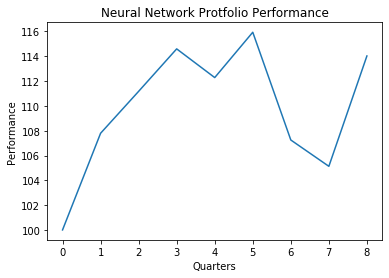

Compounded Result :14.02622680957029 %


In [16]:
total_performance(8)

# Running Random Forest on Feature Selected Data

In [10]:
filenames = open('filenames.txt','r').read()
filenames = filenames.split('\n')[:-1]

f_all_preds = {}
f_all_labels = {}

i = 0

#for i in range(15):
for i in range(len(filenames)):
    try:
        df = pd.read_csv("./All_Data/feature_clean_data/"+str(filenames[i]), delimiter = ',')
        preds,labels = neural_network(df)
        preds = np.reshape(preds,(8,))
        f_all_preds[str(filenames[i])] = preds
        f_all_labels[str(filenames[i])] = labels
    except:
        s=2

/home/anshul/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in true_divide
/home/anshul/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide


In [12]:
preds, labels = neural_network(df)

AttributeError: module 'tensorboard.lazy' has no attribute 'lazy_load'